Basic Library

In [ ]:
import pandas as pd
import numpy as np

import torch
import os
import sys
import tqdm
import yaml
from typing import Tuple, Dict

#For model
!pip install seaborn
import seaborn as sns
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.preprocessing import MinMaxScaler, LabelEncoder
from sklearn.model_selection import train_test_split
from tensorflow.keras.models import Model
from tensorflow.keras.layers import BatchNormalization, Dropout
import tensorflow as tf

#plot
import matplotlib.pyplot as plt
from statsmodels.graphics.tsaplots import plot_acf

# **I. Prepare & Analyze data**



1. Read raw data from 6 stations


In [ ]:
## Put data in your personal drive

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
## Prepare data frame

!rm -f All_Stations.xlsx
!rm -f aqi_test.xlsx

# Copy the data file
%cd /content
File_path_raw = '/content/drive/MyDrive/MasterThesis/Data/RAW/All_Stations.xlsx'
!cp {File_path_raw} /content

data_input = 'All_Stations.xlsx'
raw_df = pd.read_excel(data_input, sheet_name='Raw_Training')
station_locations = pd.read_excel(data_input, sheet_name='Location')

/content


2. Correlation Matrix for specific station

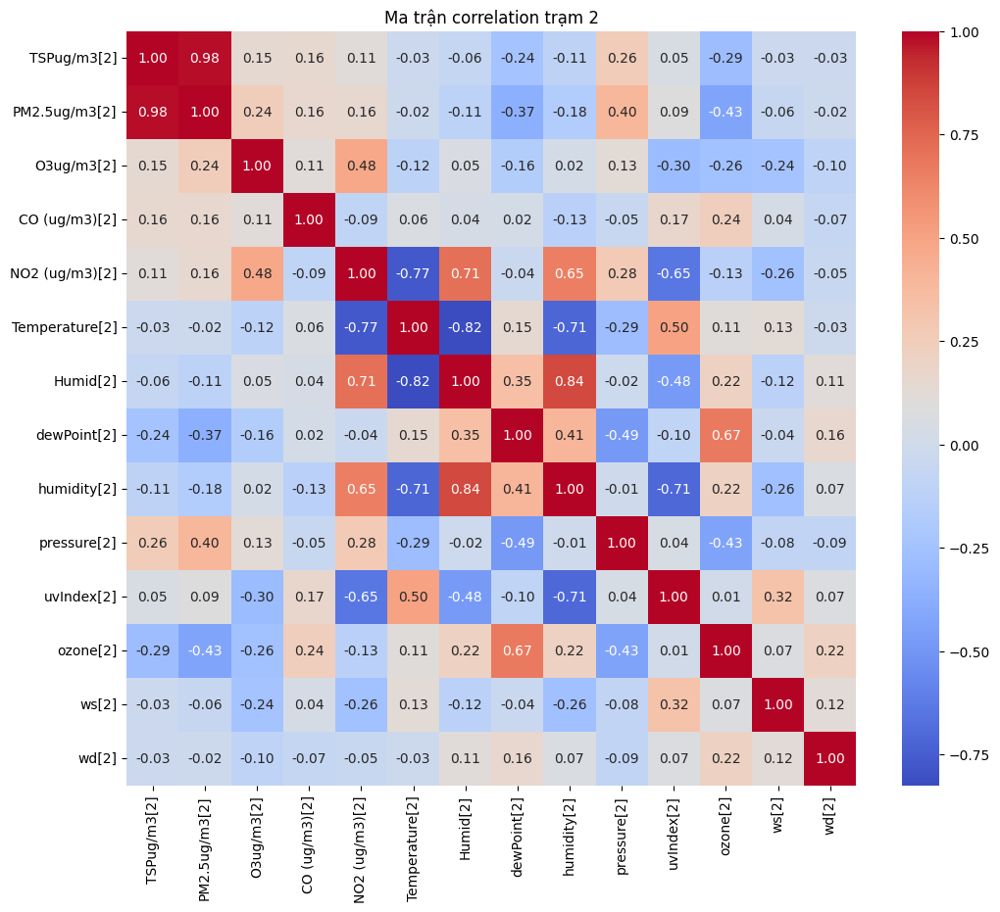

In [ ]:
station_2_columns = [col for col in raw_df.columns if '[2]' in col]
station_2_data = raw_df[station_2_columns]

numerical_features = station_2_data.select_dtypes(include=['number'])

# Calculate the correlation matrix
correlation_matrix = numerical_features.corr()

# Create the heatmap
plt.figure(figsize=(12, 10))  # Adjust figure size as needed
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Ma trận correlation trạm 2')
plt.show()

3. Keep features: PM2.5, O3, CO, NO2 and remove others

In [ ]:
# Format data
for column in raw_df.columns:
  if column != 'date':
    raw_df[column] = pd.to_numeric(raw_df[column], errors='coerce')

Keep_columns = ['date']  # Start with the 'date' column

for station_number in range(1, 7):
    Keep_columns.extend([
        f'PM2.5ug/m3[{station_number}]',
        f'O3ug/m3[{station_number}]',
        f'CO (ug/m3)[{station_number}]',
        f'NO2 (ug/m3)[{station_number}]'
    ])

for colunm in raw_df.columns:
  if colunm not in Keep_columns:
    raw_df = raw_df.drop(colunm, axis=1)

print(raw_df.columns)

Index(['date', 'PM2.5ug/m3[1]', 'O3ug/m3[1]', 'CO (ug/m3)[1]',
       'NO2 (ug/m3)[1]', 'PM2.5ug/m3[2]', 'O3ug/m3[2]', 'CO (ug/m3)[2]',
       'NO2 (ug/m3)[2]', 'PM2.5ug/m3[3]', 'O3ug/m3[3]', 'CO (ug/m3)[3]',
       'NO2 (ug/m3)[3]', 'PM2.5ug/m3[4]', 'O3ug/m3[4]', 'CO (ug/m3)[4]',
       'NO2 (ug/m3)[4]', 'PM2.5ug/m3[5]', 'O3ug/m3[5]', 'CO (ug/m3)[5]',
       'NO2 (ug/m3)[5]', 'PM2.5ug/m3[6]', 'O3ug/m3[6]', 'CO (ug/m3)[6]',
       'NO2 (ug/m3)[6]'],
      dtype='object')


4. Visualization

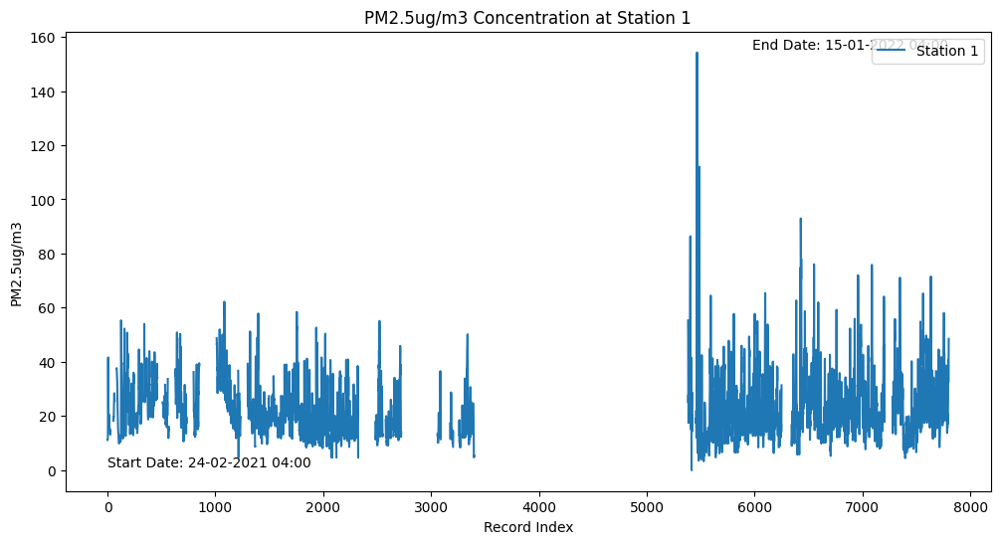

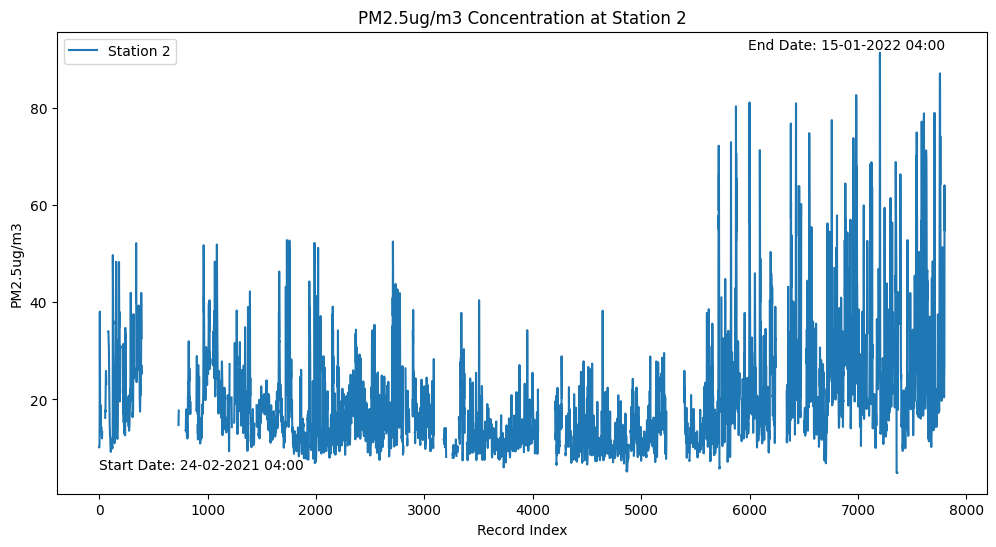

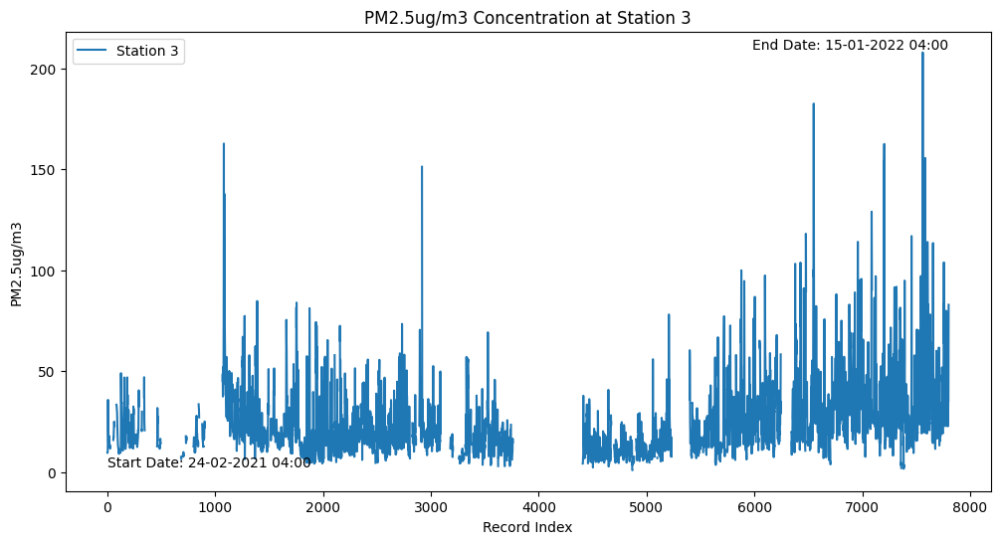

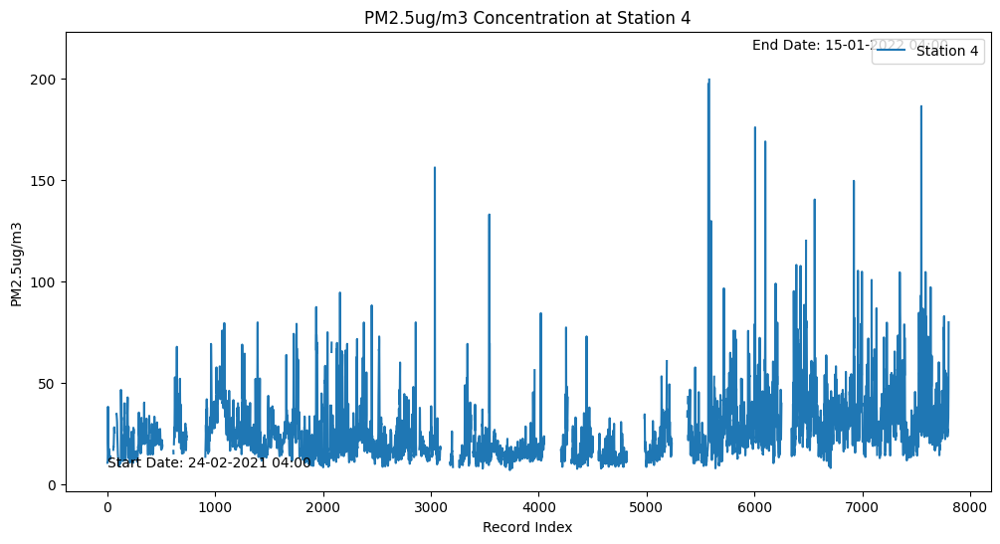

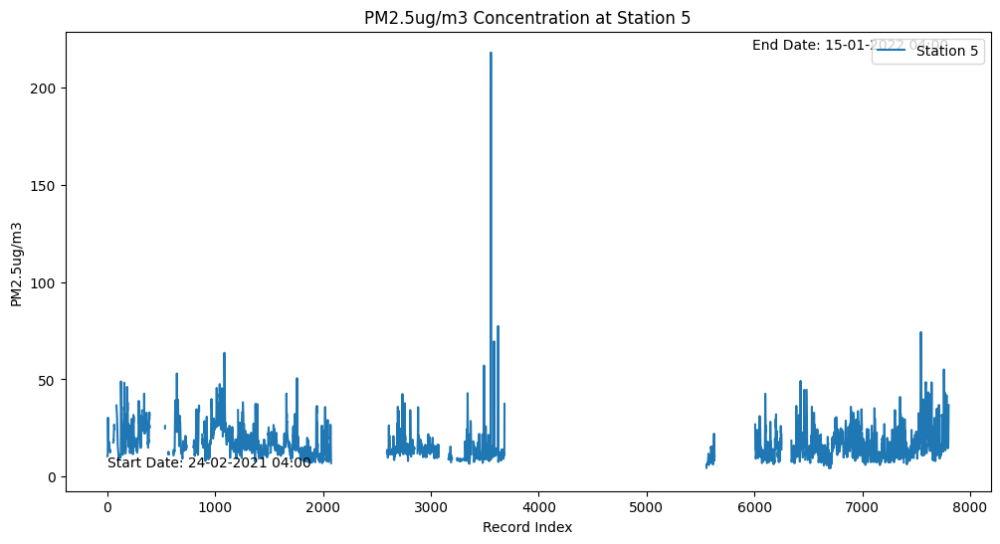

...

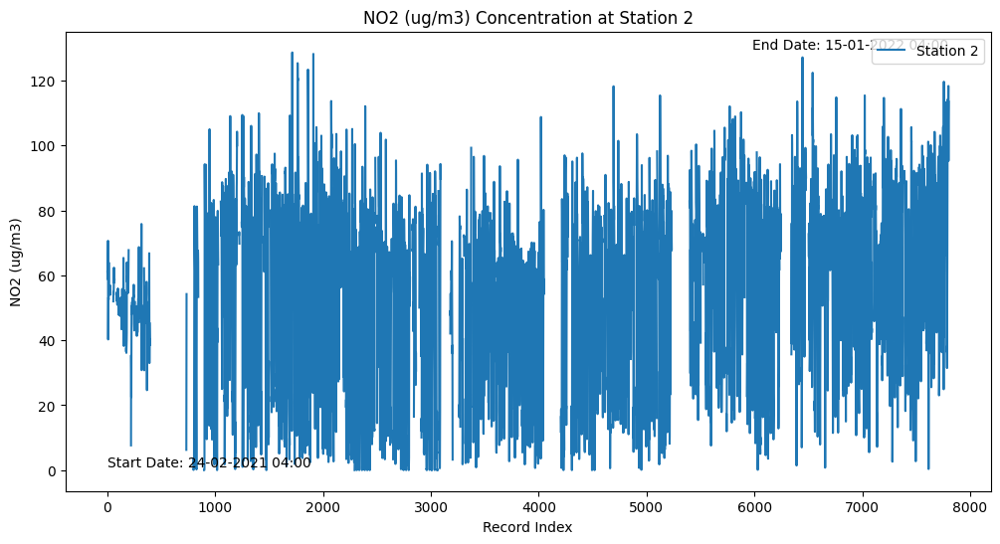

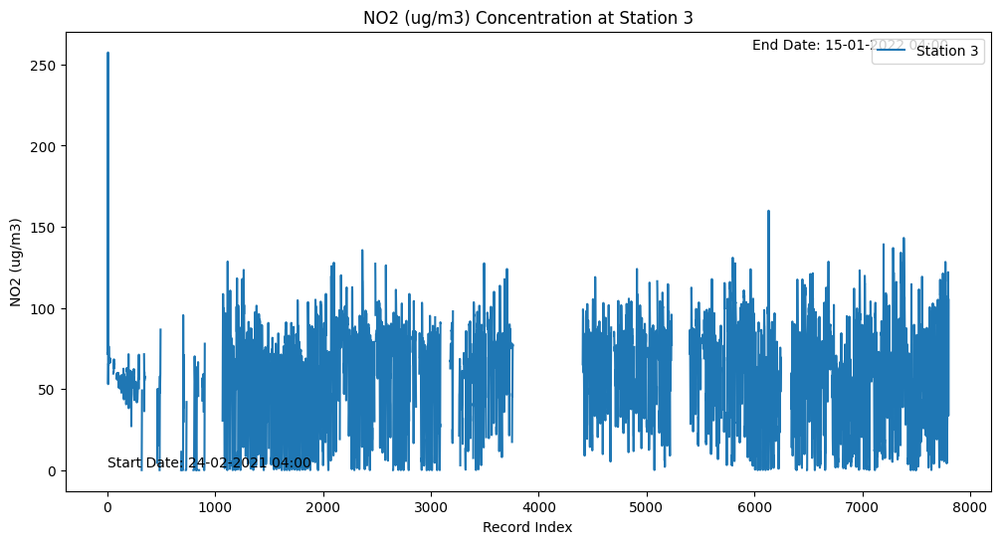

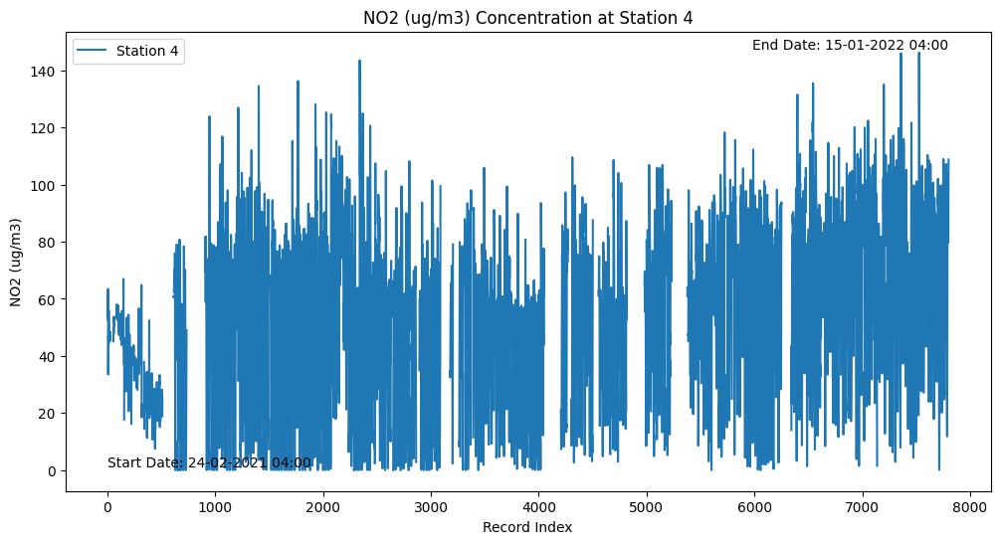

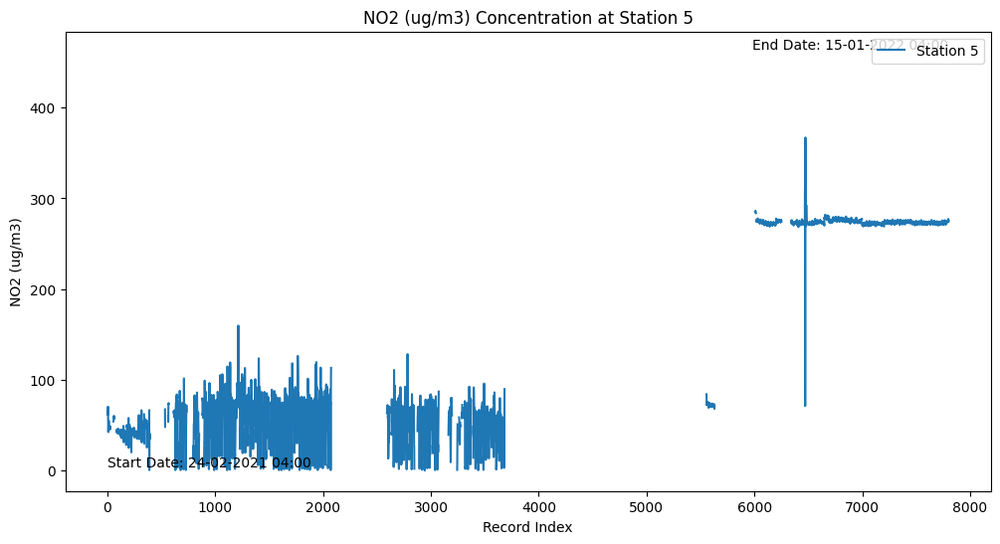

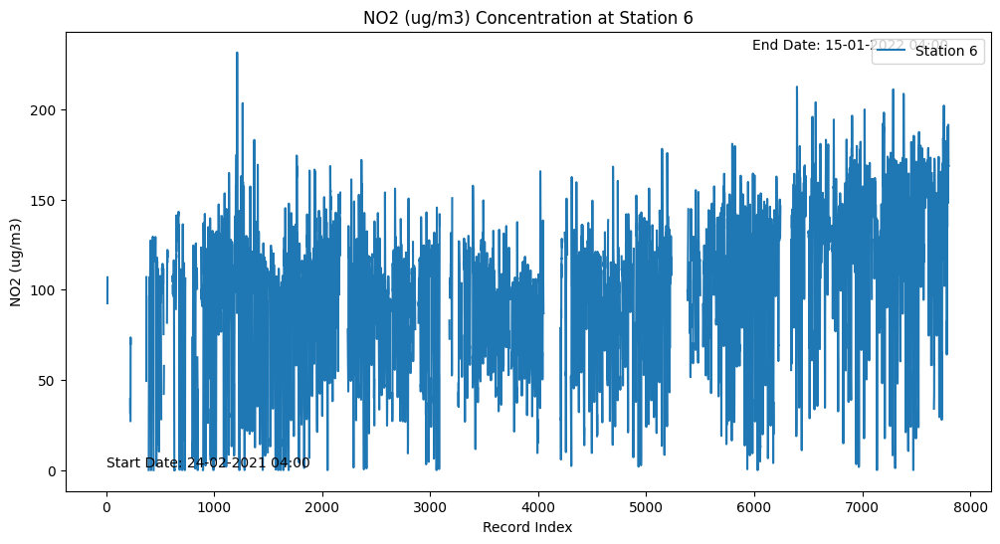

In [ ]:
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']

for pollutant in pollutants:
    for station in (1,2,3,4,5,6):
        column_name = f'{pollutant}[{station}]'

        # Create figure
        plt.figure(figsize=(12, 6))

        plt.plot(raw_df.index, raw_df[column_name], label=f'Station {station}')

        # Label and legend
        plt.title(f'{pollutant} Concentration at Station {station}')
        plt.xlabel('Record Index')  # Sử dụng index làm trục x
        plt.ylabel(pollutant)
        plt.legend()

        first_date = raw_df['date'].iloc[0]
        last_date = raw_df['date'].iloc[-1]
        plt.text(0, raw_df[column_name].min(), f'Start Date: {first_date}', ha='left', va='bottom')
        plt.text(len(raw_df) - 1, raw_df[column_name].max(), f'End Date: {last_date}', ha='right', va='bottom')

        plt.show()

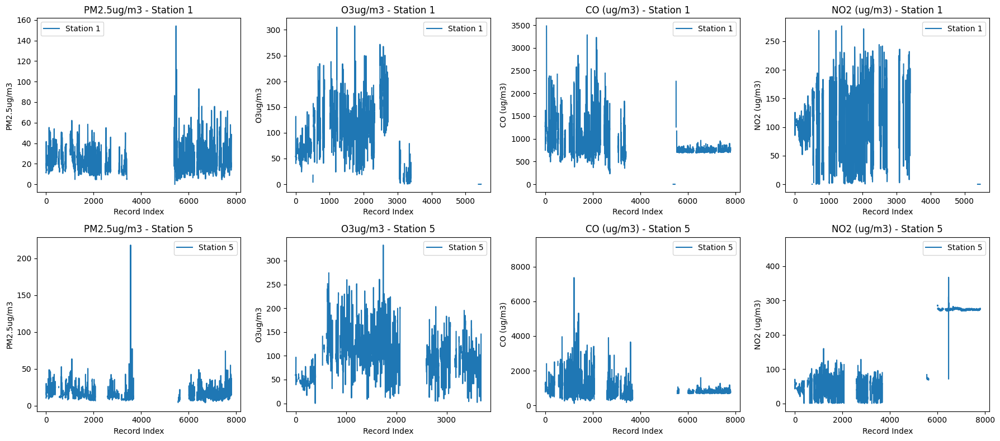

In [ ]:
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [1, 5]

fig, axes = plt.subplots(len(stations), len(pollutants), figsize=(18, 8))

for i, station in enumerate(stations):
    for j, pollutant in enumerate(pollutants):
        column_name = f'{pollutant}[{station}]'

        axes[i, j].plot(raw_df.index, raw_df[column_name], label=f'Station {station}')

        axes[i, j].set_title(f'{pollutant} - Station {station}')
        axes[i, j].set_xlabel('Record Index')
        axes[i, j].set_ylabel(pollutant)
        axes[i, j].legend()

plt.tight_layout()
plt.show()

In [ ]:
# Missing value percent
for station in stations:
    print(f"Station {station}:")
    total_data_points = 0
    missing_data_points = 0

    for pollutant in pollutants:
        column_name = f'{pollutant}[{station}]'

        total_data_points += len(raw_df[column_name])

        missing_data_points += raw_df[column_name].isnull().sum()

    percentage_missing = (missing_data_points / total_data_points) * 100
    print(f"  Missing value percent: {percentage_missing:.2f}%")
    print("\n")

Trạm 1:
  Tỷ lệ phần trăm dữ liệu bị khuyết: 57.91%


Trạm 5:
  Tỷ lệ phần trăm dữ liệu bị khuyết: 50.66%




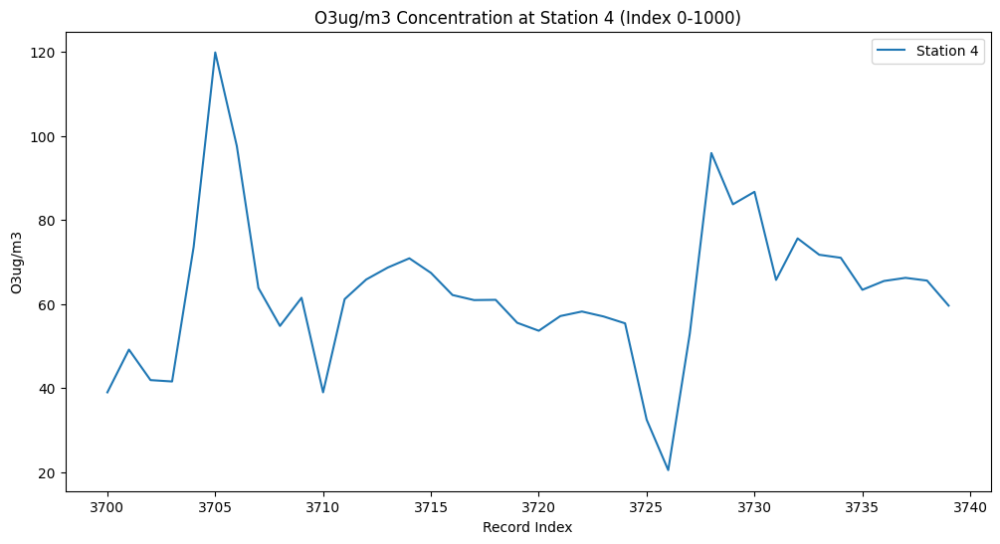

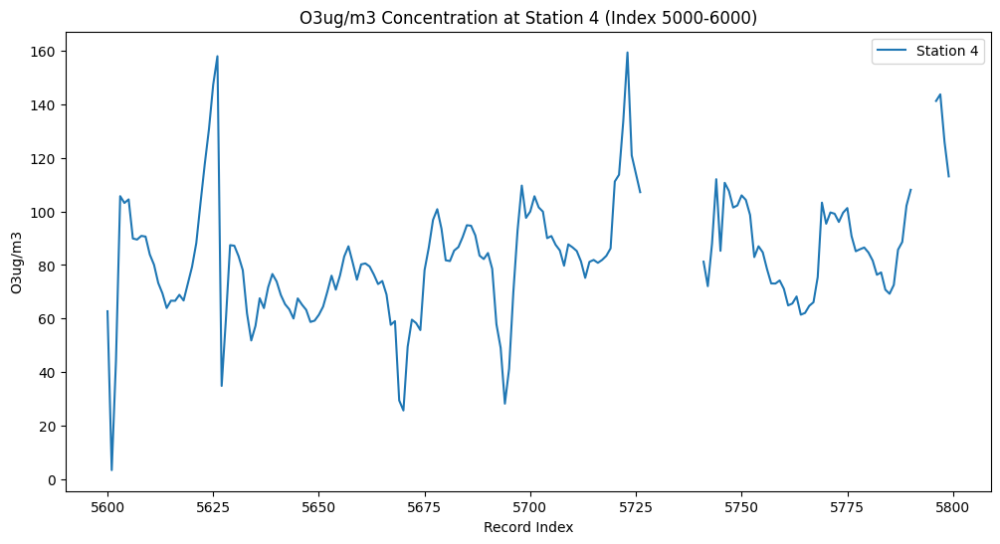

In [ ]:
# Define the pollutant and station
pollutant = 'O3ug/m3'
station = 4
column_name = f'{pollutant}[{station}]'

# Extract the data for the specified ranges
data_range1 = raw_df.iloc[3700:3740][column_name]
data_range2 = raw_df.iloc[5600:5800][column_name]

plt.figure(figsize=(12, 6))
plt.plot(data_range1.index, data_range1, label=f'Station {station}')
plt.title(f'{pollutant} Concentration at Station {station} (Index 0-1000)')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

# Plot for index 5000-6000
plt.figure(figsize=(12, 6))
plt.plot(data_range2.index, data_range2, label=f'Station {station}')
plt.title(f'{pollutant} Concentration at Station {station} (Index 5000-6000)')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

In [ ]:
stations = [6, 2, 3, 4]
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']

for station in stations:
    print(f"Trạm {station}:")
    total_data_points = 0
    missing_data_points = 0

    for pollutant in pollutants:
        if station == 2 and pollutant == 'CO (ug/m3)':
            continue

        column_name = f'{pollutant}[{station}]'

        total_data_points += len(raw_df[column_name])

        missing_data_points += raw_df[column_name].isnull().sum()

    percentage_missing = (missing_data_points / total_data_points) * 100
    print(f"  Tỷ lệ phần trăm dữ liệu bị khuyết: {percentage_missing:.2f}%")
    print("\n")

Trạm 6:
  Tỷ lệ phần trăm dữ liệu bị khuyết: 20.20%


Trạm 2:
  Tỷ lệ phần trăm dữ liệu bị khuyết: 19.75%


Trạm 3:
  Tỷ lệ phần trăm dữ liệu bị khuyết: 26.94%


Trạm 4:
  Tỷ lệ phần trăm dữ liệu bị khuyết: 16.76%




5. Eliminate station 1 & 5

In [ ]:
columns_to_drop = []
for pollutant in ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']:
    columns_to_drop.extend([f'{pollutant}[1]', f'{pollutant}[5]'])

raw_df = raw_df.drop(columns=columns_to_drop)
print(raw_df)

                  date  PM2.5ug/m3[2]  O3ug/m3[2]  CO (ug/m3)[2]  \
0     24-02-2021 04:00      10.183333   74.659433       1176.751   
1     24-02-2021 05:00      10.103333   73.448917       1167.201   
2     24-02-2021 06:00      10.258333   71.093317       1167.583   
3     24-02-2021 07:00      10.873333   71.747650       1209.412   
4     24-02-2021 08:00      14.468333   79.043467       1123.080   
...                ...            ...         ...            ...   
7796  15-01-2022 00:00      23.986667  127.529567            NaN   
7797  15-01-2022 01:00      26.171667  111.040367            NaN   
7798  15-01-2022 02:00      26.800000  114.023224            NaN   
7799  15-01-2022 03:00      64.055000   83.754667            NaN   
7800  15-01-2022 04:00      54.848333  118.107167            NaN   

      NO2 (ug/m3)[2]  PM2.5ug/m3[3]  O3ug/m3[3]  CO (ug/m3)[3]  \
0          61.070900       9.638333   63.633917    1123.080000   
1          60.600400       9.503333   63.077733    

6. Remove null data continuously for 24 hours

In [ ]:
pollutant_columns = [col for col in raw_df.columns if col != 'date']

raw_df['all_nan'] = raw_df[pollutant_columns].isnull().all(axis=1)

drop_indices = []
for i in range(len(raw_df) - 24):
    if raw_df['all_nan'].iloc[i : i + 24].all():
        drop_indices.extend(range(i, i + 24))

cleaned_df = raw_df.drop(raw_df.index[drop_indices])
cleaned_df = cleaned_df.drop(columns=['all_nan'])
raw_df = raw_df.drop(columns=['all_nan'])

pollutant_columns_cleaned = [col for col in cleaned_df.columns if col != 'date']

# Replace 0 with NaN in pollutant columns of cleaned_df
cleaned_df[pollutant_columns_cleaned] = cleaned_df[pollutant_columns_cleaned].replace(0, np.nan)

cleaned_df

,date,PM2.5ug/m3[2],O3ug/m3[2],CO (ug/m3)[2],NO2 (ug/m3)[2],PM2.5ug/m3[3],O3ug/m3[3],CO (ug/m3)[3],NO2 (ug/m3)[3],PM2.5ug/m3[4],O3ug/m3[4],CO (ug/m3)[4],NO2 (ug/m3)[4],PM2.5ug/m3[6],O3ug/m3[6],CO (ug/m3)[6],NO2 (ug/m3)[6]
0,24-02-2021 04:00,10.183333,74.659433,1176.751,61.070900,9.638333,63.633917,1123.080000,71.986500,10.573333,49.892917,1153.449000,54.766200,NaN,NaN,NaN,NaN
1,24-02-2021 05:00,10.103333,73.448917,1167.201,60.600400,9.503333,63.077733,1110.092000,71.547367,10.575000,47.341017,1138.360000,54.013400,NaN,NaN,NaN,NaN
2,24-02-2021 06:00,10.258333,71.093317,1167.583,59.408467,9.651667,62.521550,1110.092000,71.516000,10.725000,46.326800,1134.731000,54.170233,NaN,NaN,NaN,NaN
3,24-02-2021 07:00,10.873333,71.747650,1209.412,59.973067,10.115000,63.012300,1156.314000,71.892400,11.481667,46.294083,1179.234000,54.672100,NaN,NaN,NaN,NaN
4,24-02-2021 08:00,14.468333,79.043467,1123.080,58.749767,13.326667,106.165583,1107.036000,111.383033,15.611667,54.996717,1100.542000,52.727367,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7796,15-01-2022 00:00,23.986667,127.529567,NaN,106.615300,32.431667,95.303650,1213.805000,112.920000,32.616667,114.312033,866.949000,91.622033,37.440000,120.855367,1952.784000,183.902767
7797,15-01-2022 01:00,26.171667,111.040367,NaN,109.971533,35.128333,59.380750,1074.757000,77.475667,32.919444,107.637833,882.101667,79.671333,34.713559,124.700407,2065.325085,191.485525
7798,15-01-2022 02:00,26.800000,114.023224,NaN,118.306414,35.194828,20.916103,1074.078621,33.583966,42.056667,102.893917,1174.650000,100.718367,32.472881,107.599017,1483.390169,168.933424
7799,15-01-2022 03:00,64.055000,83.754667,NaN,95.260567,72.091667,68.966733,1375.964000,81.490600,46.556757,109.821892,1487.322162,107.528324,45.948333,108.717483,1220.108000,168.250800


7. Divide the data into 4 sub-dataframes based on pollutants.

In [ ]:
pollutant_dfs = []
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']

for pollutant in pollutants:
    pollutant_df = cleaned_df[['date']].copy()  # Start with the 'date' column

    for station_number in {2,3,4,6}:
        column_name = f'{pollutant}[{station_number}]'
        pollutant_df[column_name] = cleaned_df[column_name]

    pollutant_dfs.append(pollutant_df)

In [ ]:
pollutant_dfs[0]

,date,PM2.5ug/m3[2],PM2.5ug/m3[3],PM2.5ug/m3[4],PM2.5ug/m3[6]
0,23-02-2021 21:00,13.961364,12.900000,13.760000,NaN
1,23-02-2021 22:00,13.147059,12.154545,13.170588,NaN
2,23-02-2021 23:00,12.230000,11.381667,12.368333,NaN
3,24-02-2021 00:00,11.258333,10.496667,11.578333,NaN
4,24-02-2021 01:00,10.701667,9.956667,11.035000,NaN
...,...,...,...,...,...
7803,15-01-2022 00:00,23.986667,32.431667,32.616667,37.440000
7804,15-01-2022 01:00,26.171667,35.128333,32.919444,34.713559
7805,15-01-2022 02:00,26.800000,35.194828,42.056667,32.472881
7806,15-01-2022 03:00,64.055000,72.091667,46.556757,45.948333


8. Data range caculation

In [ ]:
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]

range_df = pd.DataFrame(columns=['pollutant', 'station', 'range'])

for i, pollutant in enumerate(pollutants):
    for station in stations:
        column_name = f'{pollutant}[{station}]'
        data = pollutant_dfs[i][column_name]
        range_value = data.max() - data.min()

        range_df = pd.concat([range_df, pd.DataFrame({
            'pollutant': [pollutant],
            'station': [station],
            'range': [range_value]
        })], ignore_index=True)

print(range_df)

for pollutant in pollutants:
    range_values = range_df[range_df['pollutant'] == pollutant]['range']
    min_range = range_values.min()
    max_range = range_values.max()
    print(f"{pollutant}: range between {min_range} and {max_range}")

      pollutant station         range
0    PM2.5ug/m3       2     86.431667
1    PM2.5ug/m3       3    206.811667
2    PM2.5ug/m3       4    205.650000
3    PM2.5ug/m3       6    114.746667
4       O3ug/m3       2    372.074067
5       O3ug/m3       3    349.267972
6       O3ug/m3       4    376.830567
7       O3ug/m3       6    276.166417
8    CO (ug/m3)       2  10500.607000
9    CO (ug/m3)       3  10485.454330
10   CO (ug/m3)       4   6662.462000
11   CO (ug/m3)       6  20879.032770
12  NO2 (ug/m3)       2    128.603333
13  NO2 (ug/m3)       3    257.449758
14  NO2 (ug/m3)       4    146.200033
15  NO2 (ug/m3)       6    231.517367
PM2.5ug/m3: range between 86.43166667 and 206.8116667
O3ug/m3: range between 276.1664167 and 376.83056666699997
CO (ug/m3): range between 6662.462 and 20879.032769999998
NO2 (ug/m3): range between 128.60333333300002 and 257.44975833300003


<ipython-input-12-c68f8da7d6e0>:13: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  range_df = pd.concat([range_df, pd.DataFrame({


8. Correlation matrix for pollutant datasets with null records removed from all stations for 24 consecutive hours

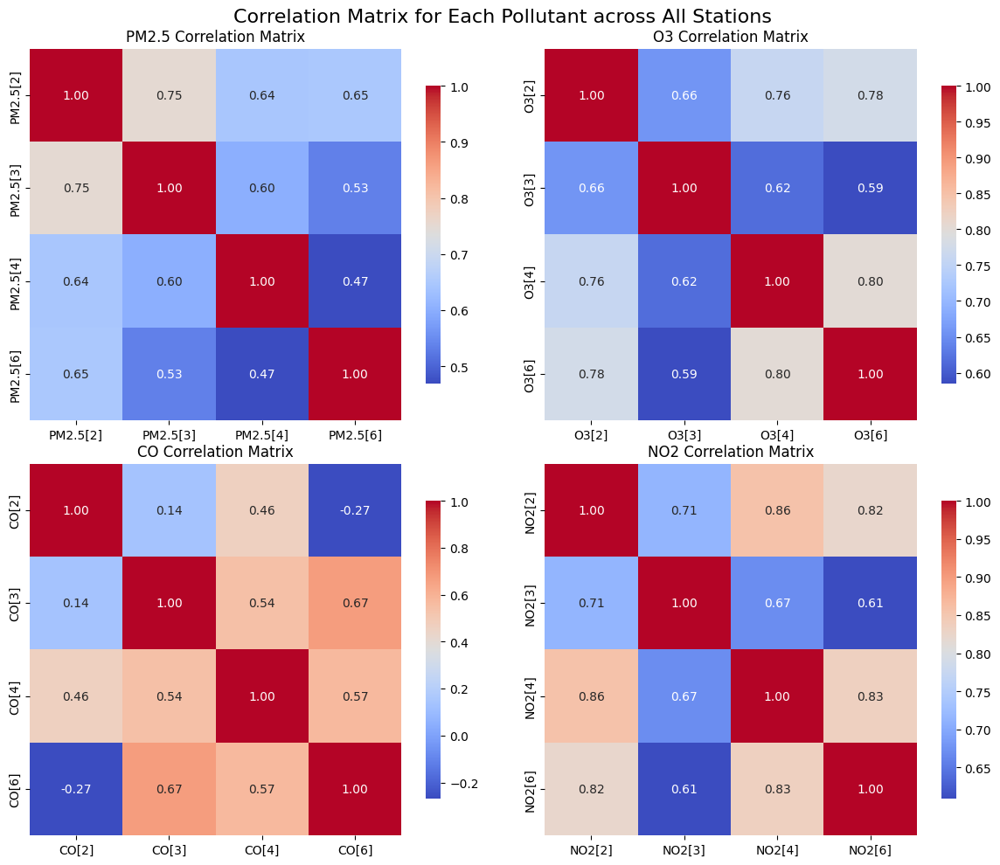

In [ ]:
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]

pollutant_labels = ['PM2.5', 'O3', 'CO', 'NO2']

modified_pollutant_dfs = [df.copy() for df in pollutant_dfs]

for i, df in enumerate(modified_pollutant_dfs):
    column_mapping = {
        f'{pollutants[i]}[{station}]': f'{pollutant_labels[i]}[{station}]'
        for station in stations
    }
    df.rename(columns=column_mapping, inplace=True)

fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Correlation Matrix for Each Pollutant across All Stations', fontsize=16)

for i, pollutant_label in enumerate(pollutant_labels):
    row = i // 2
    col = i % 2
    ax = axes[row, col]

    pollutant_df = modified_pollutant_dfs[i]

    correlation_matrix = pollutant_df.select_dtypes(include=['number']).corr()
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
                square=True, cbar_kws={"shrink": .8}, ax=ax)

    ax.set_title(f'{pollutant_label} Correlation Matrix')

plt.tight_layout()
plt.show()

# II. Outlier adjustment and data smoothing using MA and IQR

0. Data dispersion analyzation

In [ ]:
# Mean and Std_Dev  Caculattion
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]

std_dev_df = pd.DataFrame(columns=['Pollutant', 'Station', 'Std_Dev', 'Mean', 'Std_Dev/Mean', 'Recommended_Base_Factor'])

for i, pollutant in enumerate(pollutants):
    for station in stations:
        column_name = f'{pollutant}[{station}]'
        std_dev = pollutant_dfs[i][column_name].std()
        mean_value = pollutant_dfs[i][column_name].mean()  # Mean
        std_dev_over_mean = std_dev / mean_value if mean_value != 0 else 0  # Avoid divide 0

        # base factor base std_dev over mean
        if std_dev_over_mean > 1.0:
            recommended_base_factor = 1.2  # High ispersion
        elif std_dev_over_mean > 0.5:
            recommended_base_factor = 1.5  # Normal ispersion
        else:
            recommended_base_factor = 2.0  # Low ispersion

        std_dev_df = pd.concat([std_dev_df, pd.DataFrame({
            'Pollutant': [pollutant],
            'Station': [station],
            'Std_Dev': [std_dev],
            'Mean': [mean_value],
            'Std_Dev/Mean': [std_dev_over_mean],
            'Recommended_Base_Factor': [recommended_base_factor]
        })], ignore_index=True)

print(std_dev_df)

print("\n Base Factor for each poluttant:")
for pollutant in pollutants:
    base_factor_recommendations = std_dev_df[std_dev_df['Pollutant'] == pollutant]['Recommended_Base_Factor'].unique()
    print(f"{pollutant}: {base_factor_recommendations}")

      Pollutant Station     Std_Dev         Mean  Std_Dev/Mean  \
0    PM2.5ug/m3       2   10.920669    19.372594      0.563717   
1    PM2.5ug/m3       3   18.000864    24.534531      0.733695   
2    PM2.5ug/m3       4   15.378503    25.749864      0.597227   
3    PM2.5ug/m3       6   13.733057    20.289397      0.676859   
4       O3ug/m3       2   38.531930   110.350630      0.349177   
5       O3ug/m3       3   32.138216    75.599869      0.425109   
6       O3ug/m3       4   31.235737    79.870208      0.391081   
7       O3ug/m3       6   31.079302    93.901624      0.330977   
8    CO (ug/m3)       2  961.712770  1109.695981      0.866645   
9    CO (ug/m3)       3  543.853188   909.610973      0.597896   
10   CO (ug/m3)       4  445.800818   931.714183      0.478474   
11   CO (ug/m3)       6  927.664281  1304.484557      0.711135   
12  NO2 (ug/m3)       2   25.688760    58.724960      0.437442   
13  NO2 (ug/m3)       3   28.654157    60.562982      0.473130   
14  NO2 (u

<ipython-input-9-7d3058dcfd3f>:22: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  std_dev_df = pd.concat([std_dev_df, pd.DataFrame({


1. MA and dynamic IQR Function

In [ ]:
def dynamic_iqr_factor(data, base_factor=1.5, max_factor=5):
    """Calculates a dynamic IQR factor using robust statistics and a max factor."""
    if data.dropna().empty:
        return base_factor

    median = data.dropna().median()
    mad = np.median(np.abs(data.dropna() - median))
    std_dev = mad * 1.4826

    if abs(median) < 1e-6:
        iqr_factor = base_factor
    else:
        iqr_factor = base_factor + (std_dev / median)

    return min(iqr_factor, max_factor)

def correct_outliers_iqr_24h(df, base_factor, min_valid_data_points=5):
    """
    Corrects outliers in the DataFrame using IQR for each day (24 records)
    and a dynamic IQR factor. Outliers are replaced with interpolated values,
    or mean if interpolation is not possible.

    Only processes outliers, leaves original NaN values untouched.
    """
    num_days = len(df) // 24
    total_outliers = 0
    total_data_points = 0

    for day in range(num_days):
        start_index = day * 24
        end_index = (day + 1) * 24
        daily_data = df.iloc[start_index:end_index].copy()

        for column in daily_data.columns:
            if column != 'date':
                # Filter out missing values for IQR calculation
                valid_data = daily_data[column].dropna()

                if len(valid_data) < min_valid_data_points:
                    continue

                # Calculate dynamic IQR factor
                iqr_factor = dynamic_iqr_factor(valid_data, base_factor)

                # Detect outliers using IQR and dynamic iqr_factor
                Q1 = valid_data.quantile(0.25)
                Q3 = valid_data.quantile(0.75)
                IQR = Q3 - Q1
                lower_bound = Q1 - iqr_factor * IQR
                upper_bound = Q3 + iqr_factor * IQR

                # Create a mask for outliers
                outlier_mask = (daily_data[column] < lower_bound) | (daily_data[column] > upper_bound)
                num_outliers = outlier_mask.sum()
                total_outliers += num_outliers
                total_data_points += len(daily_data[column])


                # Store the original NaNs in the column
                original_nans = daily_data[column].isna()

                 # Replace outliers with NaN temporarily
                daily_data.loc[outlier_mask, column] = np.nan

                # Perform interpolation only on the outlier locations, keep NaN from before
                daily_data[column] = daily_data[column].interpolate(method='linear', limit_direction='both')

                # If interpolation didn't work, fill with mean, but only on outlier positions
                daily_data.loc[outlier_mask, column] = daily_data.loc[outlier_mask, column].fillna(daily_data[column].mean())

                # Restore original NaN positions
                daily_data.loc[original_nans, column] = np.nan

        # Update the original DataFrame with the cleaned daily data
        df.iloc[start_index:end_index] = daily_data

    # Calculate the outlier percentage
    outlier_percentage = (total_outliers / total_data_points) * 100 if total_data_points > 0 else 0
    print(f"Percentage of outliers corrected: {outlier_percentage:.2f}%")

    return df

# Example usage (assuming you have your pollutant_dfs ready)
cleaned_dfs = [pollutant_df.copy() for pollutant_df in pollutant_dfs]
base_factors = [1.2, 2, 1.1, 1.8]  # PM2.5, O3, CO, NO2

for i in range(len(cleaned_dfs)):
    cleaned_dfs[i] = correct_outliers_iqr_24h(cleaned_dfs[i], base_factor=base_factors[i])

Percentage of outliers corrected: 3.76%
Percentage of outliers corrected: 3.02%
Percentage of outliers corrected: 3.79%
Percentage of outliers corrected: 2.73%


Outlier adjustment result

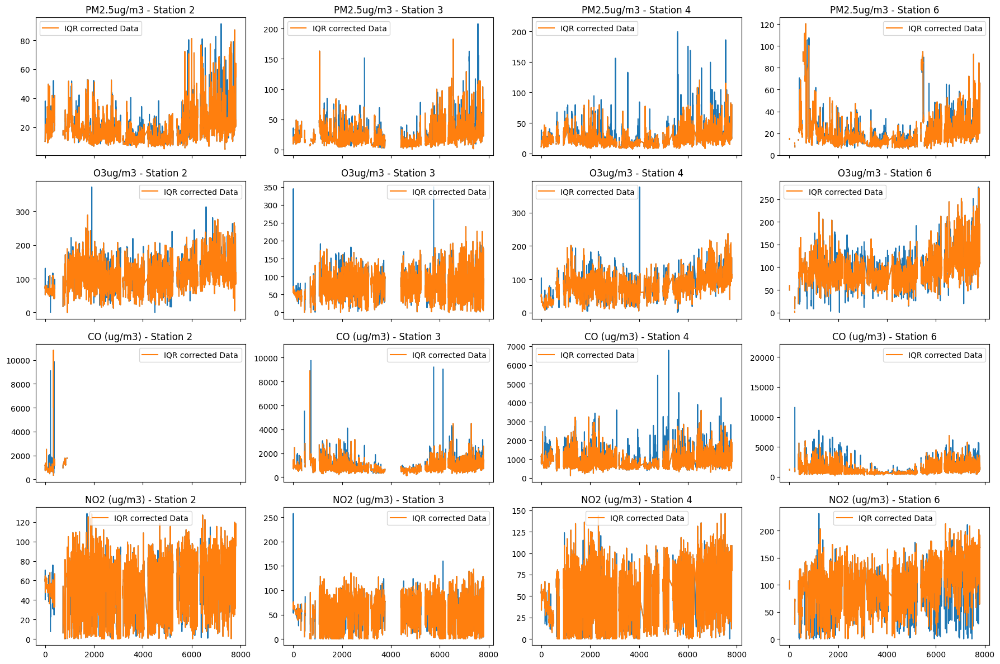

,2,3,4,6
Chất ô nhiễm,,,,
PM2.5ug/m3,232,201,295,259
O3ug/m3,167,114,242,271
CO (ug/m3),25,233,267,232
NO2 (ug/m3),160,119,109,330


In [ ]:
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]

# Create a figure and subplots
fig, axes = plt.subplots(len(pollutants), len(stations), figsize=(18, 12), sharex=True)
# fig.suptitle('Original vs. IQR Pollutant Concentrations (Stations 2, 3, 4, and 6)', fontsize=16)
corrected_points_count = {}

for i, pollutant in enumerate(pollutants):
    corrected_points_count[pollutant] = {}  # Initialize dictionary for the current pollutant
    for j, station in enumerate(stations):
        # Original data
        original_data = pollutant_dfs[i][f'{pollutant}[{station}]']

        # Corrected data
        IQR_corrected_data = cleaned_dfs[i][f'{pollutant}[{station}]']

        # Filter out null values before comparing
        valid_indices = original_data.notnull()
        original_data_valid = original_data[valid_indices]
        IQR_corrected_data_valid = IQR_corrected_data[valid_indices]

        # Count the number of corrected points (excluding null values)
        corrected_points = (original_data_valid != IQR_corrected_data_valid).sum()
        corrected_points_count[pollutant][station] = corrected_points

        # Plot on the corresponding subplot
        ax = axes[i, j]
        ax.plot(original_data.index, original_data)
        ax.plot(IQR_corrected_data.index, IQR_corrected_data, label='IQR corrected Data')
        ax.set_title(f'{pollutant} - Station {station}')
        ax.legend()

plt.tight_layout()
plt.show()

corrected_points_df = pd.DataFrame(corrected_points_count)

corrected_points_df = corrected_points_df.T

corrected_points_df.index.name = "Chất ô nhiễm"

display(corrected_points_df)

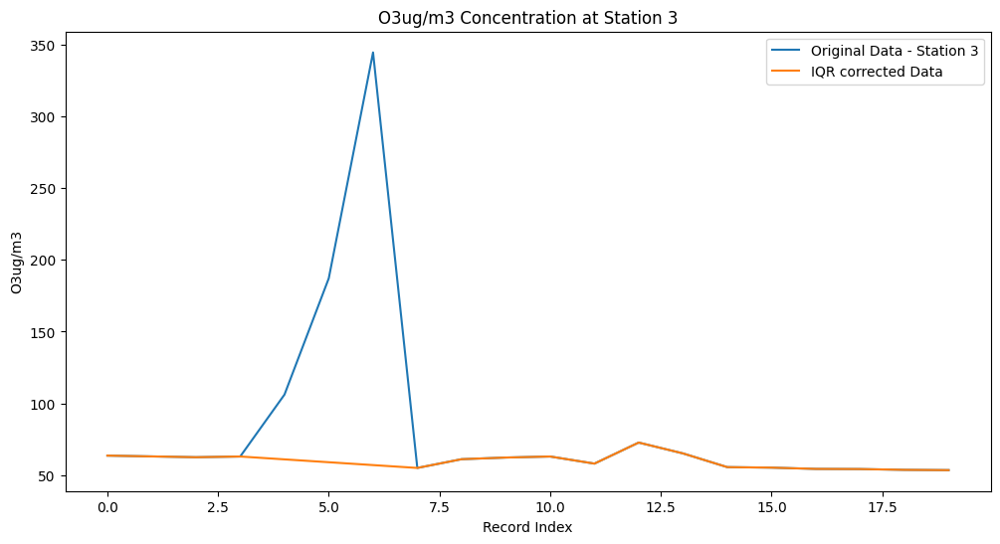

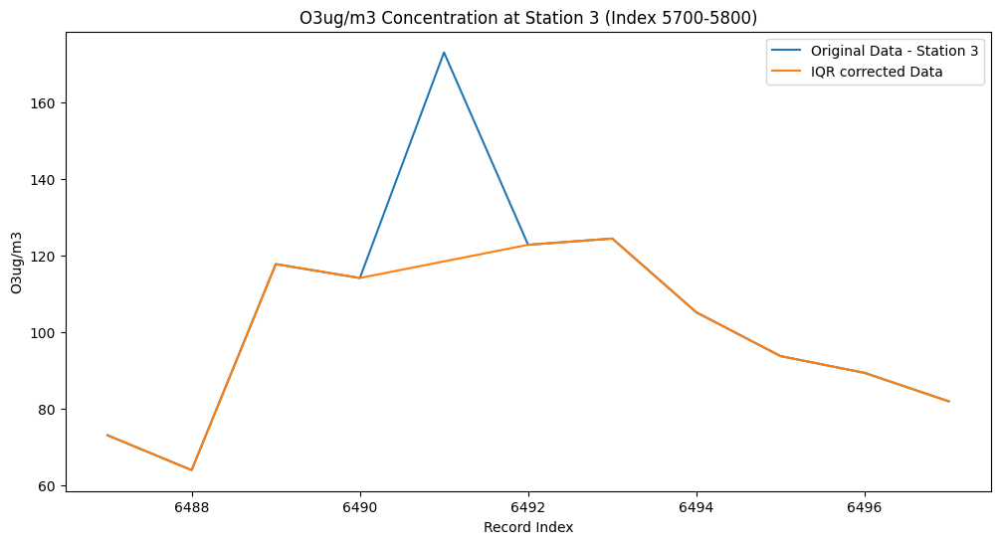

In [ ]:
# Define the pollutant and station
pollutant = 'O3ug/m3'
station = 3

# Extract the data for the specified ranges
original_data_range1 = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[0:20]  # Index 0-1000
original_data_range2 = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[5760:5775]  # Index 5000-6000

IQR_corrected_data_range1 = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[0:20]  # Index 0-1000
IQR_corrected_data_range2 = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[5760:5775]  # Index 5000-6000


# Plot for index 0-1000
plt.figure(figsize=(12, 6))
plt.plot(original_data_range1.index, original_data_range1, label=f'Original Data - Station {station}')
plt.plot(IQR_corrected_data_range1.index, IQR_corrected_data_range1, label='IQR corrected Data')

plt.title(f'{pollutant} Concentration at Station {station}')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

# Plot for index 5000-6000
plt.figure(figsize=(12, 6))
plt.plot(original_data_range2.index, original_data_range2, label=f'Original Data - Station {station}')
plt.plot(IQR_corrected_data_range2.index, IQR_corrected_data_range2, label='IQR corrected Data')

plt.title(f'{pollutant} Concentration at Station {station} (Index 5700-5800)')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

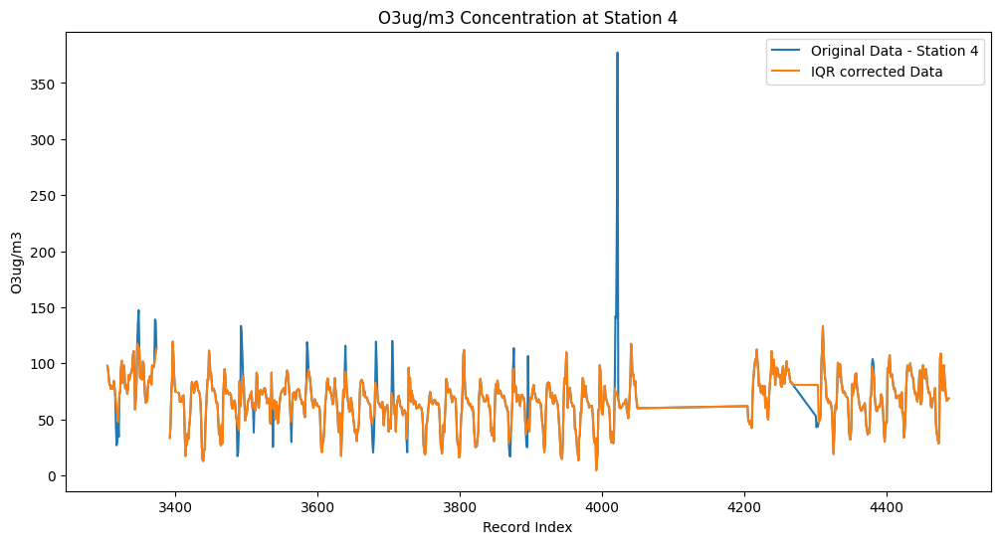

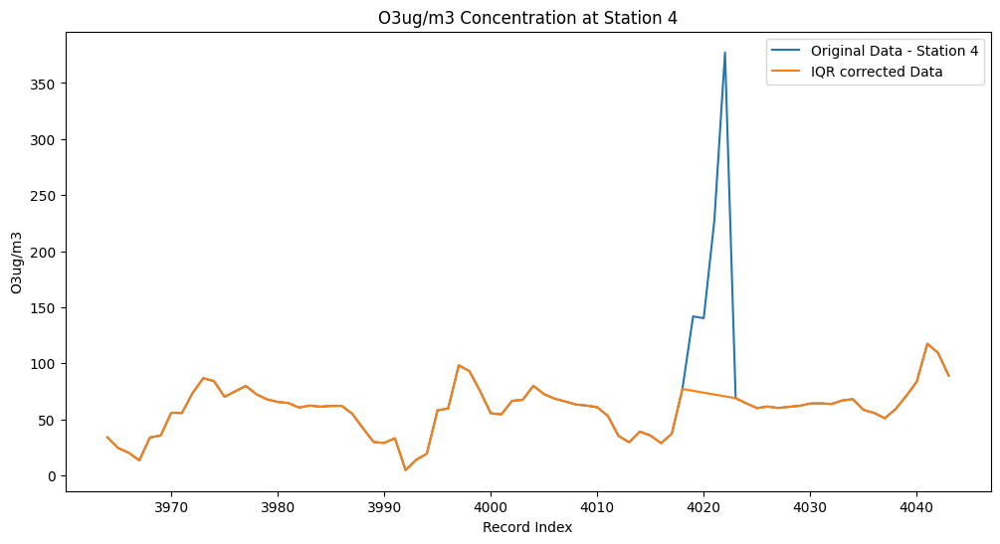

In [ ]:
# Define the pollutant and station
pollutant = 'O3ug/m3'
station = 4

# Extract the data for the specified ranges
original_data_range1 = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[3000:4000]  # Index 0-1000
original_data_range2 = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[3660:3740]  # Index 5000-6000

IQR_corrected_data_range1 = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[3000:4000]  # Index 0-1000
IQR_corrected_data_range2 = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[3660:3740]  # Index 5000-6000


# Plot for index 0-1000
plt.figure(figsize=(12, 6))
plt.plot(original_data_range1.index, original_data_range1, label=f'Original Data - Station {station}')
plt.plot(IQR_corrected_data_range1.index, IQR_corrected_data_range1, label='IQR corrected Data')

plt.title(f'{pollutant} Concentration at Station {station}')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

# Plot for index 5000-6000
plt.figure(figsize=(12, 6))
plt.plot(original_data_range2.index, original_data_range2, label=f'Original Data - Station {station}')
plt.plot(IQR_corrected_data_range2.index, IQR_corrected_data_range2, label='IQR corrected Data')

plt.title(f'{pollutant} Concentration at Station {station}')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

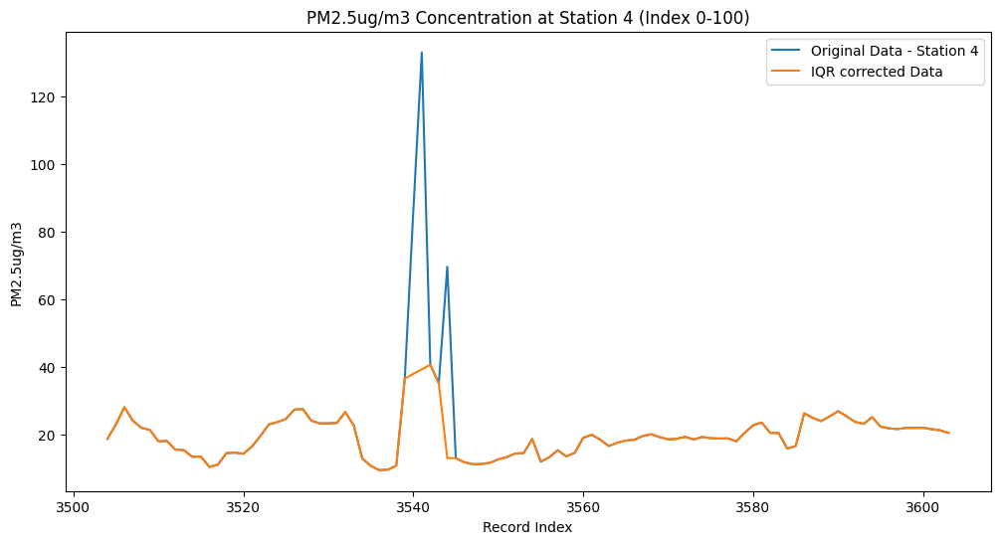

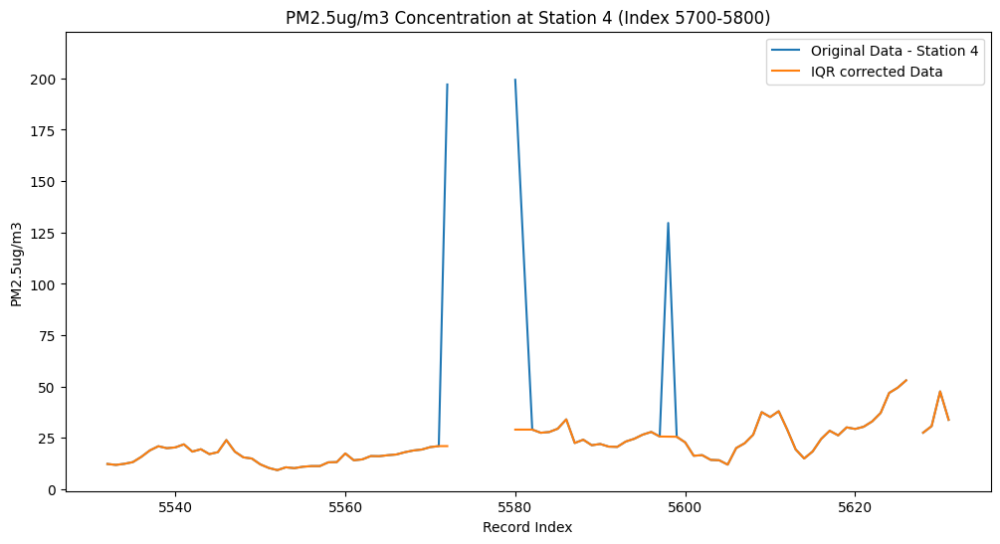

In [ ]:
# Define the pollutant and station
pollutant = 'PM2.5ug/m3'
station = 4

# Extract the data for the specified ranges
original_data_range1 = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[3200:3300]  # Index 0-1000
original_data_range2 = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[4900:5000]  # Index 5000-6000

IQR_corrected_data_range1 = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[3200:3300]  # Index 0-1000
IQR_corrected_data_range2 = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[4900:5000]  # Index 5000-6000


# Plot for index 0-1000
plt.figure(figsize=(12, 6))
plt.plot(original_data_range1.index, original_data_range1, label=f'Original Data - Station {station}')
plt.plot(IQR_corrected_data_range1.index, IQR_corrected_data_range1, label='IQR corrected Data')

plt.title(f'{pollutant} Concentration at Station {station}')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

# Plot for index 5000-6000
plt.figure(figsize=(12, 6))
plt.plot(original_data_range2.index, original_data_range2, label=f'Original Data - Station {station}')
plt.plot(IQR_corrected_data_range2.index, IQR_corrected_data_range2, label='IQR corrected Data')

plt.title(f'{pollutant} Concentration at Station {station}')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

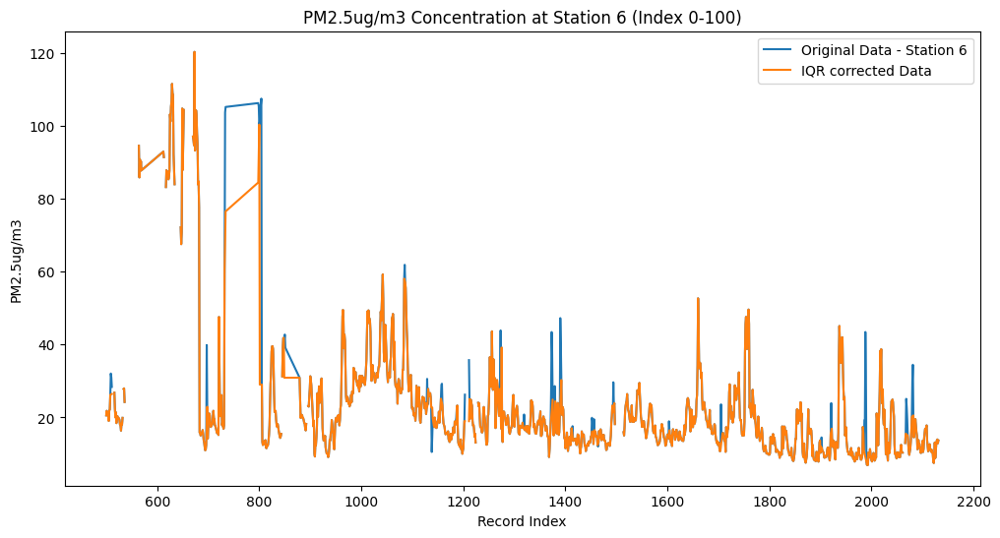

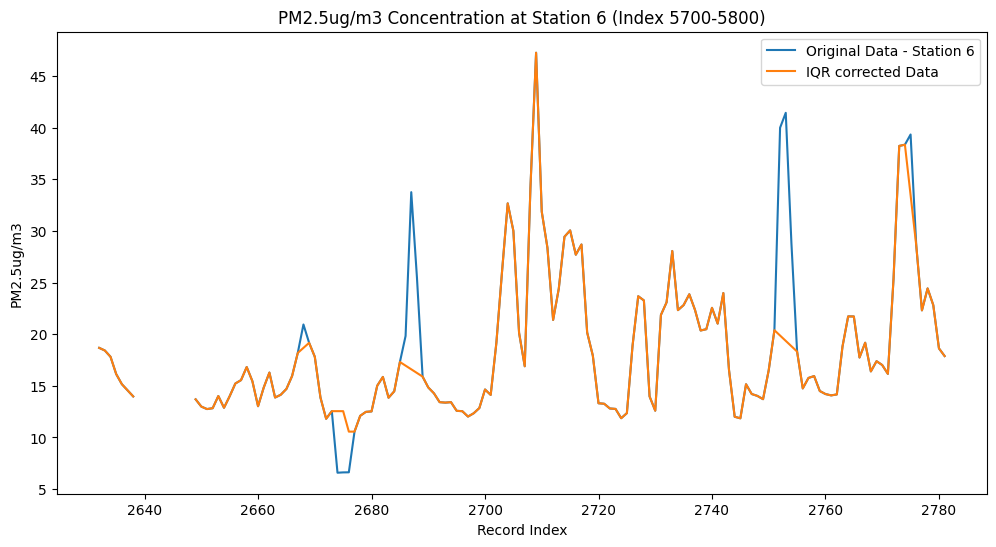

In [ ]:
# Define the pollutant and station
pollutant = 'PM2.5ug/m3'
station = 6

# Extract the data for the specified ranges
original_data_range1 = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[500:2000]  # Index 0-1000
original_data_range2 = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[2500:2650]  # Index 5000-6000

IQR_corrected_data_range1 = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[500:2000]  # Index 0-1000
IQR_corrected_data_range2 = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[2500:2650]  # Index 5000-6000


# Plot for index 0-1000
plt.figure(figsize=(12, 6))
plt.plot(original_data_range1.index, original_data_range1, label=f'Original Data - Station {station}')
plt.plot(IQR_corrected_data_range1.index, IQR_corrected_data_range1, label='IQR corrected Data')

plt.title(f'{pollutant} Concentration at Station {station} (Index 0-100)')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

# Plot for index 5000-6000
plt.figure(figsize=(12, 6))
plt.plot(original_data_range2.index, original_data_range2, label=f'Original Data - Station {station}')
plt.plot(IQR_corrected_data_range2.index, IQR_corrected_data_range2, label='IQR corrected Data')

plt.title(f'{pollutant} Concentration at Station {station} (Index 5700-5800)')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

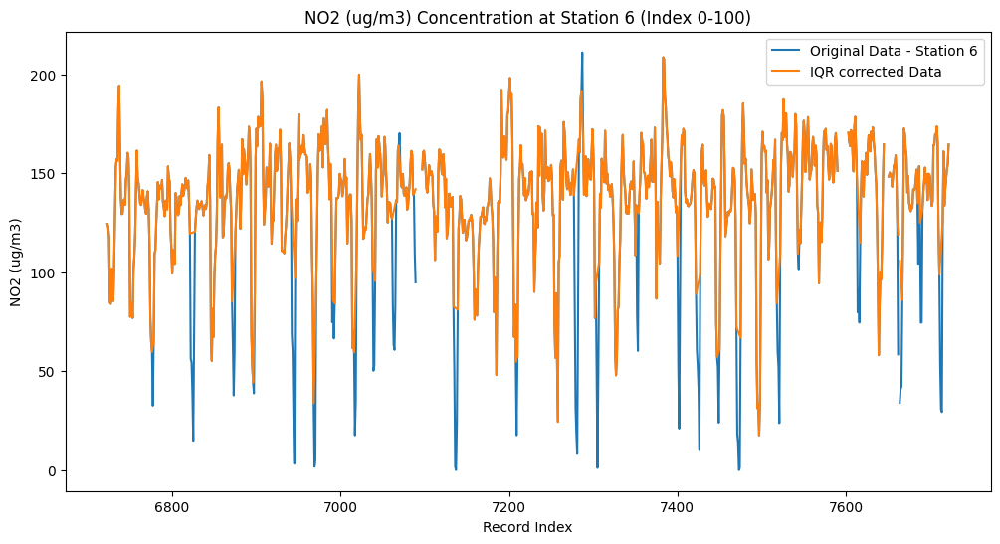

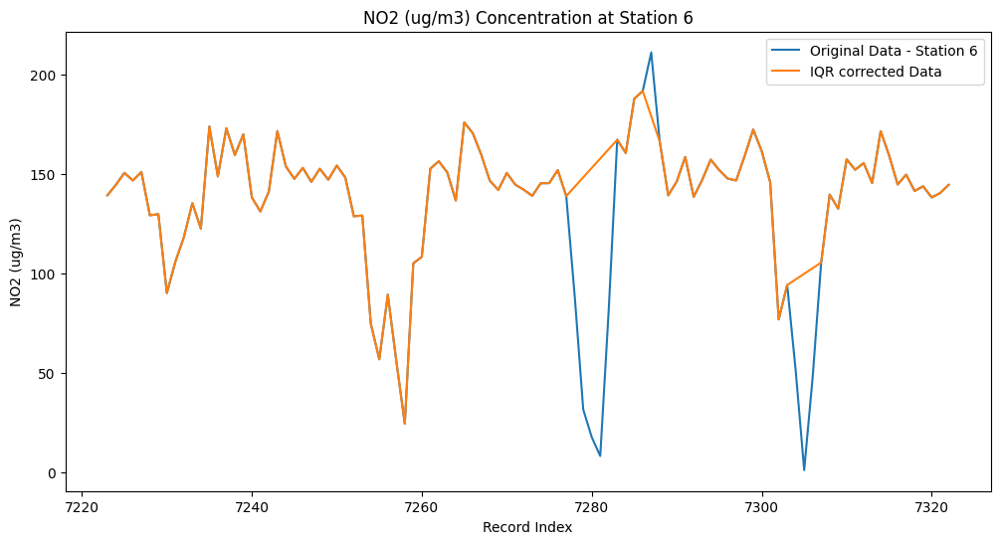

In [ ]:
# Define the pollutant and station
pollutant = 'NO2 (ug/m3)'
station = 6

# Extract the data for the specified ranges
original_data_range1 = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[6000:7000]  # Index 0-1000
original_data_range2 = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[6500:6600]  # Index 5000-6000

IQR_corrected_data_range1 = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[6000:7000]  # Index 0-1000
IQR_corrected_data_range2 = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]'].iloc[6500:6600]  # Index 5000-6000


# Plot for index 0-1000
plt.figure(figsize=(12, 6))
plt.plot(original_data_range1.index, original_data_range1, label=f'Original Data - Station {station}')
plt.plot(IQR_corrected_data_range1.index, IQR_corrected_data_range1, label='IQR corrected Data')

plt.title(f'{pollutant} Concentration at Station {station} (Index 0-100)')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

# Plot for index 5000-6000
plt.figure(figsize=(12, 6))
plt.plot(original_data_range2.index, original_data_range2, label=f'Original Data - Station {station}')
plt.plot(IQR_corrected_data_range2.index, IQR_corrected_data_range2, label='IQR corrected Data')

plt.title(f'{pollutant} Concentration at Station {station}')
plt.xlabel('Record Index')
plt.ylabel(pollutant)
plt.legend()
plt.show()

In [ ]:
## Caculate avg fluctuation

pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]

def calculate_avg_fluctuation(data):
    """
    Calculates the average fluctuation within 24 hours, ignoring periods with NaN values.

    Args:
        data: A pandas Series containing the data.

    Returns:
        The average fluctuation within 24 hours.
    """
    fluctuations = []
    for i in range(len(data) - 24):
        daily_data = data[i:i + 24]

        # Skip if there are NaN values in the daily data
        if daily_data.isnull().any():
            continue

        fluctuation = daily_data.max() - daily_data.min()  # Range within 24 hours
        fluctuations.append(fluctuation)

    # Return NaN if no valid fluctuations were calculated
    if not fluctuations:
        return np.nan
    else:
        return np.mean(fluctuations)  # Average fluctuation

# Create a dictionary to store the results
fluctuation_results = {}

# Iterate through each pollutant and station
for pollutant in pollutants:
    fluctuation_results[pollutant] = {}
    for station in stations:
        # Original data
        original_data = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]']

        # Corrected data
        corrected_data = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]']

        # Calculate average fluctuations
        original_fluctuation = calculate_avg_fluctuation(original_data).round(2)
        corrected_fluctuation = calculate_avg_fluctuation(corrected_data).round(2)

        # Store the results
        fluctuation_results[pollutant][station] = {
            'Original': original_fluctuation,
            'After IQR': corrected_fluctuation
        }

# Create a DataFrame to display the results
fluctuation_df = pd.DataFrame(fluctuation_results).T  # Transpose for pollutants as rows
fluctuation_df.index.name = "Chất ô nhiễm"  # Rename index

# Round the values to 2 decimal places
fluctuation_df = fluctuation_df

# Display the DataFrame as a table
display(fluctuation_df)

,2,3,4,6
Chất ô nhiễm,,,,
PM2.5ug/m3,"{'Original': 23.25, 'After IQR': 18.73}","{'Original': 42.66, 'After IQR': 32.79}","{'Original': 35.22, 'After IQR': 25.18}","{'Original': 20.19, 'After IQR': 17.58}"
O3ug/m3,"{'Original': 115.79, 'After IQR': 96.89}","{'Original': 104.44, 'After IQR': 91.05}","{'Original': 80.39, 'After IQR': 66.01}","{'Original': 83.77, 'After IQR': 66.69}"
CO (ug/m3),"{'Original': 873.09, 'After IQR': 1129.14}","{'Original': 1218.21, 'After IQR': 996.67}","{'Original': 1253.44, 'After IQR': 954.03}","{'Original': 2148.82, 'After IQR': 1715.64}"
NO2 (ug/m3),"{'Original': 76.68, 'After IQR': 70.64}","{'Original': 86.31, 'After IQR': 78.89}","{'Original': 79.91, 'After IQR': 76.79}","{'Original': 112.06, 'After IQR': 92.1}"


3. Smoothing with MA filter


In [ ]:
MA_cleaned_dfs = [cleaned_df.copy() for cleaned_df in cleaned_dfs]

def correct_outliers_ma(df, window= 3):
    """
    Hiệu chỉnh outlier trong DataFrame bằng cách sử dụng Moving Average.

    Args:
        df: DataFrame đầu vào.
        window: Kích thước cửa sổ trượt cho Moving Average.

    Returns:
        DataFrame với outlier đã được hiệu chỉnh bằng MA.
    """
    for column in df.columns:
        if column != 'date':
            df[column] = df[column].rolling(window=window, center=True, min_periods=1).mean()

    return df

for i in range(len(MA_cleaned_dfs)):
    MA_cleaned_dfs[i] = correct_outliers_ma(MA_cleaned_dfs[i])

In [ ]:
MA_cleaned_dfs[3]

,date,NO2 (ug/m3)[2],NO2 (ug/m3)[3],NO2 (ug/m3)[4],NO2 (ug/m3)[6]
0,24-02-2021 04:00,60.835650,71.766933,54.389800,NaN
1,24-02-2021 05:00,60.359922,71.683289,54.316611,NaN
2,24-02-2021 06:00,59.993978,71.651922,54.285244,NaN
3,24-02-2021 07:00,59.377100,71.043409,53.856567,NaN
4,24-02-2021 08:00,61.175456,69.721827,54.933489,NaN
...,...,...,...,...,...
7796,15-01-2022 00:00,105.883411,104.137333,91.726589,178.881442
7797,15-01-2022 01:00,111.631082,74.659877,90.670578,181.440572
7798,15-01-2022 02:00,107.846171,64.183411,95.972675,176.223250
7799,15-01-2022 03:00,109.017193,73.352933,105.661490,168.561986


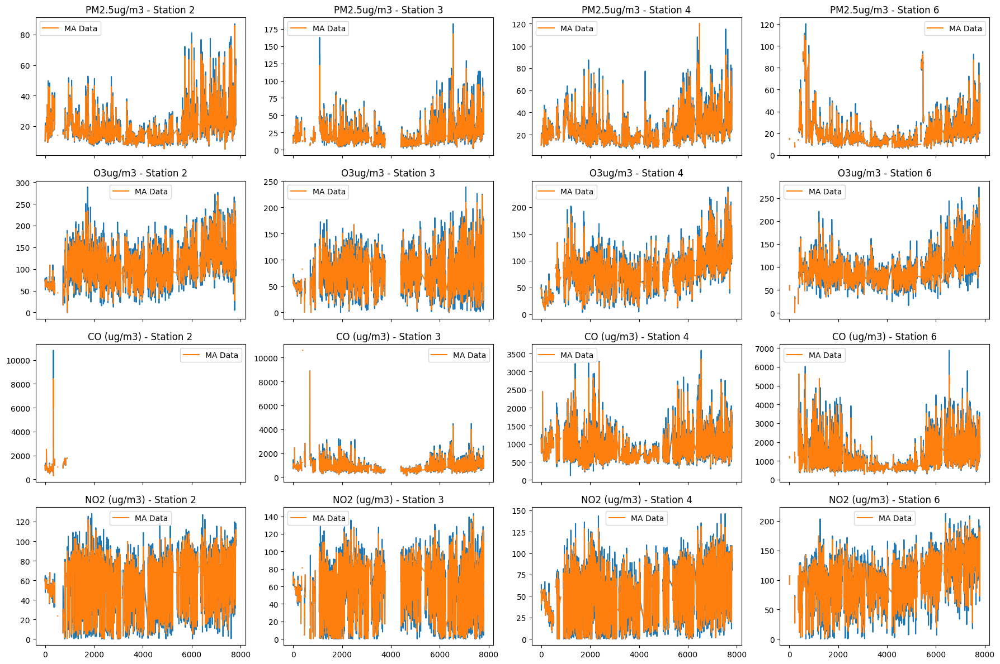

In [ ]:
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]

# Create a figure and subplots
fig, axes = plt.subplots(len(pollutants), len(stations), figsize=(18, 12), sharex=True)
# fig.suptitle('IQR vs. MA Pollutant Concentrations (Stations 2, 3, 4, and 6)', fontsize=16)

# Iterate through each pollutant and station
for i, pollutant in enumerate(pollutants):
    for j, station in enumerate(stations):
        # Original data
        IQR_data = cleaned_dfs[i][f'{pollutant}[{station}]']

        # Corrected data
        MA_corrected_data = MA_cleaned_dfs[i][f'{pollutant}[{station}]']

        # Plot on the corresponding subplot
        ax = axes[i, j]
        ax.plot(IQR_data.index, IQR_data)
        ax.plot(MA_corrected_data.index, MA_corrected_data, label='MA Data')
        ax.set_title(f'{pollutant} - Station {station}')
        # ax.set_ylabel(pollutant)
        ax.legend()

plt.tight_layout()
plt.show()

In [ ]:
def calculate_avg_fluctuation(data):
    """
    Calculates the average fluctuation within 24 hours, ignoring periods with NaN values.

    Args:
        data: A pandas Series containing the data.

    Returns:
        The average fluctuation within 24 hours.
    """
    fluctuations = []
    for i in range(len(data) - 24):
        daily_data = data[i:i + 24]

        # Skip if there are NaN values in the daily data
        if daily_data.isnull().any():
            continue

        fluctuation = daily_data.max() - daily_data.min()  # Range within 24 hours
        fluctuations.append(fluctuation)

    # Return NaN if no valid fluctuations were calculated
    if not fluctuations:
        return np.nan
    else:
        return np.mean(fluctuations)  # Average fluctuation

# Create a dictionary to store the results
fluctuation_results = {}

# Iterate through each pollutant and station
for pollutant in pollutants:
    fluctuation_results[pollutant] = {}
    for station in stations:
        # Original data
        original_data = cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]']

        # Corrected data
        corrected_data = MA_cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]']

        # Calculate average fluctuations
        original_fluctuation = calculate_avg_fluctuation(original_data).round(2)
        corrected_fluctuation = calculate_avg_fluctuation(corrected_data).round(2)

        # Store the results
        fluctuation_results[pollutant][station] = {
            'Before': original_fluctuation,
            'After MA': corrected_fluctuation
        }

# Create a DataFrame to display the results
fluctuation_df = pd.DataFrame(fluctuation_results).T  # Transpose for pollutants as rows
fluctuation_df.index.name = "Chất ô nhiễm"  # Rename index

# Round the values to 2 decimal places
fluctuation_df = fluctuation_df

display(fluctuation_df)

,2,3,4,6
Chất ô nhiễm,,,,
PM2.5ug/m3,"{'Before': 19.1, 'After MA': 14.32}","{'Before': 34.92, 'After MA': 24.84}","{'Before': 25.6, 'After MA': 18.96}","{'Before': 16.83, 'After MA': 12.84}"
O3ug/m3,"{'Before': 101.98, 'After MA': 73.6}","{'Before': 94.18, 'After MA': 68.22}","{'Before': 67.71, 'After MA': 47.71}","{'Before': 67.98, 'After MA': 46.67}"
CO (ug/m3),"{'Before': 442.75, 'After MA': 308.79}","{'Before': 986.6, 'After MA': 704.09}","{'Before': 963.72, 'After MA': 695.73}","{'Before': 1723.04, 'After MA': 1236.49}"
NO2 (ug/m3),"{'Before': 74.37, 'After MA': 59.57}","{'Before': 82.63, 'After MA': 66.66}","{'Before': 77.42, 'After MA': 63.57}","{'Before': 93.94, 'After MA': 67.35}"


In [ ]:
comparison_results = {}

# Loop through pollutants and stations
for pollutant in pollutants:
    comparison_results[pollutant] = {}
    for station in stations:
        # Get data for the current pollutant and station from both dataframes
        original_data = pollutant_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]']
        cleaned_data = MA_cleaned_dfs[pollutants.index(pollutant)][f'{pollutant}[{station}]']

        # Calculate statistics for original data
        original_std_dev = original_data.std() # Remove round
        original_std_dev = round(original_std_dev, 2) # Apply round to original_std_dev
        original_mean = original_data.mean()  # Remove round
        original_mean = round(original_mean, 2) # Apply round to original_mean
        original_std_dev_over_mean = (original_std_dev / original_mean) if original_mean != 0 else 0  # Remove round
        original_std_dev_over_mean = round(original_std_dev_over_mean, 2) # Apply round to original_std_dev_over_mean

        # Calculate statistics for cleaned data
        cleaned_std_dev = cleaned_data.std() # Remove round
        cleaned_std_dev = round(cleaned_std_dev, 2)  # Apply round to cleaned_std_dev
        cleaned_mean = cleaned_data.mean()  # Remove round
        cleaned_mean = round(cleaned_mean, 2) # Apply round to cleaned_mean
        cleaned_std_dev_over_mean = (cleaned_std_dev / cleaned_mean) if cleaned_mean != 0 else 0  # Remove round
        cleaned_std_dev_over_mean = round(cleaned_std_dev_over_mean, 2) # Apply round to cleaned_std_dev_over_mean

        # Store the results in a single record within the dictionary
        comparison_results[pollutant][station] = {
            'Org Std_Dev': original_std_dev,
            'Org Mean': original_mean,
            'Org Std_Dev/Mean': original_std_dev_over_mean,
            'Std_Dev': cleaned_std_dev,
            'Mean': cleaned_mean,
            'Std_Dev/Mean': cleaned_std_dev_over_mean
        }

# Create a DataFrame from the results, similar to fluctuation_df
comparison_df = pd.DataFrame(comparison_results).T
comparison_df.index.name = "Chất ô nhiễm"

# Display the DataFrame as a table
display(comparison_df)

,2,3,4,6
Chất ô nhiễm,,,,
PM2.5ug/m3,"{'Org Std_Dev': 10.92, 'Org Mean': 19.37, 'Org...","{'Org Std_Dev': 18.0, 'Org Mean': 24.53, 'Org ...","{'Org Std_Dev': 15.38, 'Org Mean': 25.75, 'Org...","{'Org Std_Dev': 13.73, 'Org Mean': 20.29, 'Org..."
O3ug/m3,"{'Org Std_Dev': 38.53, 'Org Mean': 110.35, 'Or...","{'Org Std_Dev': 32.14, 'Org Mean': 75.6, 'Org ...","{'Org Std_Dev': 31.24, 'Org Mean': 79.87, 'Org...","{'Org Std_Dev': 31.08, 'Org Mean': 93.9, 'Org ..."
CO (ug/m3),"{'Org Std_Dev': 961.71, 'Org Mean': 1109.7, 'O...","{'Org Std_Dev': 543.85, 'Org Mean': 909.61, 'O...","{'Org Std_Dev': 445.8, 'Org Mean': 931.71, 'Or...","{'Org Std_Dev': 927.66, 'Org Mean': 1304.48, '..."
NO2 (ug/m3),"{'Org Std_Dev': 25.69, 'Org Mean': 58.72, 'Org...","{'Org Std_Dev': 28.65, 'Org Mean': 60.56, 'Org...","{'Org Std_Dev': 27.8, 'Org Mean': 57.62, 'Org ...","{'Org Std_Dev': 36.45, 'Org Mean': 105.59, 'Or..."


#  III. Missing data imputation with Random Forest



In [ ]:
station_locations

,Station_id,Latitude,Longitude,Station Name
0,1,10.874426,106.793659,"Khu đô thị Đại học Quốc gia TP. Hồ Chí Minh, T..."
1,2,10.740084,106.616575,Cạnh Phòng GDĐT Q Bình Tân– Q. Bình Tân
2,3,10.780610,106.654032,Trạm phát sóng MobiFone trong khuôn Viên KCN T...
3,4,10.815859,106.717392,"Trường THCS Cù Chính Lan, Thanh Đa, F27, Q. Bì..."
4,5,10.776380,106.687783,Tòa soạn Báo Thanh Niên – Nguyễn Đình Chiểu - Q3
5,6,10.778108,106.666182,"MobiFone Thành Thái, Q10."


In [ ]:
MA_cleaned_dfs[0]

,date,PM2.5ug/m3[2],PM2.5ug/m3[3],PM2.5ug/m3[4],PM2.5ug/m3[6]
0,23-02-2021 21:00,13.554211,12.527273,13.465294,NaN
1,23-02-2021 22:00,13.112807,12.145404,13.099641,NaN
2,23-02-2021 23:00,12.649189,11.733220,12.719314,NaN
3,24-02-2021 00:00,11.834265,10.997386,12.038064,NaN
4,24-02-2021 01:00,11.183333,10.423750,11.468333,NaN
...,...,...,...,...,...
7803,15-01-2022 00:00,22.976667,29.680000,31.467361,31.090056
7804,15-01-2022 01:00,24.344583,32.696624,34.933611,32.949944
7805,15-01-2022 02:00,35.253333,43.711624,38.537384,37.643694
7806,15-01-2022 03:00,42.968750,56.320790,50.323032,44.758277


0. Intentionally introducing missing data (skip this)

In [ ]:
import random

# Define the parameters
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]
start_index = 6610
end_index = 6900
num_missing_values = 10

# Create new dataframes to store the data with missing values
MA_cleaned_dfs_missing = [df.copy() for df in MA_cleaned_dfs]

# Loop through the specified dataframes and stations
for i, (pollutant, station) in enumerate(zip(pollutants, stations)):
    # Get the column name
    column_name = f'{pollutant}[{station}]'

    # Get the relevant data from the new dataframes
    data = MA_cleaned_dfs_missing[i][column_name]

    # Generate random indices within the specified range
    random_indices = random.sample(range(start_index, end_index), num_missing_values)

    # Set the values at the random indices to NaN
    data.iloc[random_indices] = np.nan

    # Update the new dataframe
    MA_cleaned_dfs_missing[i][column_name] = data

print("Đã làm khuyết 10 điểm dữ liệu ngẫu nhiên.")

Đã làm khuyết 10 điểm dữ liệu ngẫu nhiên.


<ipython-input-48-ece950924d7b>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.iloc[random_indices] = np.nan
<ipython-input-48-ece950924d7b>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.iloc[random_indices] = np.nan
<ipython-input-48-ece950924d7b>:25: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.iloc[random_indices] = np.nan
<ipython-input-48-ece950924d7b>:25: SettingWithCopyWarning: 
A value is trying to be set

In [ ]:
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]

for i, (pollutant, station) in enumerate(zip(pollutants, stations)):
    # Get the column name
    column_name = f'{pollutant}[{station}]'

    # Get the relevant data from both dataframes
    original_data = MA_cleaned_dfs[i][column_name]
    missing_data = MA_cleaned_dfs_missing[i][column_name]

    # Count the number of null values in each dataframe
    original_null_count = original_data.isnull().sum()
    missing_null_count = missing_data.isnull().sum()

    # Print the results
    print(f"Số lượng null cho {pollutant} ở trạm {station}:")
    print(f"  MA_cleaned_dfs: {original_null_count}")
    print(f"  MA_cleaned_dfs_missing: {missing_null_count}")

Số lượng null cho PM2.5ug/m3 ở trạm 2:
  MA_cleaned_dfs: 677
  MA_cleaned_dfs_missing: 687
Số lượng null cho O3ug/m3 ở trạm 3:
  MA_cleaned_dfs: 1233
  MA_cleaned_dfs_missing: 1243
Số lượng null cho CO (ug/m3) ở trạm 4:
  MA_cleaned_dfs: 473
  MA_cleaned_dfs_missing: 483
Số lượng null cho NO2 (ug/m3) ở trạm 6:
  MA_cleaned_dfs: 717
  MA_cleaned_dfs_missing: 726


In [ ]:
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]

# Loop through the specified dataframes and stations
for i, (pollutant, station) in enumerate(zip(pollutants, stations)):
    # Get the column name
    column_name = f'{pollutant}[{station}]'

    # Get the relevant data from both dataframes
    original_data = MA_cleaned_dfs[i][column_name]
    missing_data = MA_cleaned_dfs_missing[i][column_name]

    # Find indices where original data is not null and missing data is null
    indices = original_data[original_data.notnull() & missing_data.isnull()].index

    # Print the results
    print(f"Indices where original data is not null and missing data is null for {pollutant} at station {station}:")
    print(indices)

Indices where original data is not null and missing data is null for PM2.5ug/m3 at station 2:
Index([7344, 7397, 7445, 7475, 7478, 7480, 7493, 7548, 7583, 7619], dtype='int64')
Indices where original data is not null and missing data is null for O3ug/m3 at station 3:
Index([7342, 7344, 7362, 7408, 7492, 7524, 7555, 7557, 7581, 7597], dtype='int64')
Indices where original data is not null and missing data is null for CO (ug/m3) at station 4:
Index([7375, 7448, 7462, 7505, 7521, 7538, 7543, 7552, 7580, 7583], dtype='int64')
Indices where original data is not null and missing data is null for NO2 (ug/m3) at station 6:
Index([7407, 7408, 7418, 7447, 7474, 7487, 7536, 7544, 7557, 7570], dtype='int64')


1. Random Forest Imputation

In [ ]:
import pandas as pd
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import RandomizedSearchCV
import numpy as np


def create_time_lag(df, column):
    """Creates a lag feature for a given column."""
    df[f'{column}_lag'] = df[column].shift(1)
    return df


def create_lag_df(df):
    """Creates a lag DataFrame containing only AQI columns with their lag features."""
    lag_df = pd.DataFrame()
    for column in df.columns:
        if pd.api.types.is_numeric_dtype(df[column]) and column != 'CO (ug/m3)[2]':
            lag_df[column] = df[column]  # Copy column to lag_df
            lag_df = create_time_lag(lag_df, column) # create lag
    return lag_df



def fill_missing_with_spatial_random_forest(df, df_lag, optimize_params=False, best_params=None):
    """
    Fill missing data using Random Forest spatially and temporally,
    Leave CO in station 2.
    """
    date_column = df['date']
    df = df.drop(columns=['date'])
    metrics = {}

    for column in df.columns:
        if column == 'CO (ug/m3)[2]':
            continue

        if not df[column].isnull().any():
            continue

        missing_indices = df[column].isnull()

        # # Get numeric columns as features (excluding target and CO[2])
        #features = [c for c in df.columns if c != column and c != 'CO (ug/m3)[2]' and pd.api.types.is_numeric_dtype(df[c])]

        # Create a list of lag features
        # features_with_lags = features + [f'{column}_lag']

        #temp_df = df[[column] + features].copy() # Get the columns for train

        #Add lag feature
        # for col in features_with_lags:
        #     if col in df_lag.columns:
        #         temp_df[col] = df_lag[col]
        #     else:
        #          temp_df[col] = np.nan


        #temp_df = temp_df.dropna(subset=features_with_lags)
        features = [c for c in df.columns if c != column and c != 'CO (ug/m3)[2]']
        temp_df = df[[column] + features]
        temp_df = temp_df[temp_df.drop(columns=[column]).notnull().all(axis=1)]

        train_data = temp_df[temp_df[column].notnull()].copy()
        test_data = df[df[column].isnull()].drop(columns=['CO (ug/m3)[2]'], errors='ignore').copy()

        X_train = train_data.drop(columns=[column])
        y_train = train_data[column]
        X_test = test_data.drop(columns=[column])


        # for col in features_with_lags:
        #   if col not in X_train.columns:
        #     X_train[col] = np.nan
        #   if col not in X_test.columns:
        #     X_test[col] = np.nan

        # X_train = X_train.dropna(axis=1, how='all')
        # X_test = X_test[X_train.columns]

        # X_train = X_train.fillna(X_train.mean())
        # X_test = X_test.fillna(X_train.mean())


        try:
            if optimize_params:
                # Example of RandomizedSearchCV for parameter tuning (optional)
                param_grid = {
                    'n_estimators': [150, 200, 300],
                    'max_depth': [5, 10, 15],
                    'min_samples_split': [2, 5, 7 ],
                    'min_samples_leaf': [ 2, 3, 4]
                }
                rf_model = RandomForestRegressor(random_state=42)
                model = RandomizedSearchCV(estimator=rf_model, param_distributions=param_grid, n_iter=3, cv=3, n_jobs=-1)
                model.fit(X_train, y_train)
                best_model = model.best_estimator_
                best_params = model.best_params_
                print(f"Best parameters for {column}: {best_params}")
                predicted_values = best_model.predict(X_test)

            # Remove all use of best_params when optimize_params = False.
            else:
                # Use default model
                model = RandomForestRegressor(n_estimators=300, max_depth=10, min_samples_split=7, min_samples_leaf=3, random_state=42)
                model.fit(X_train, y_train)
                predicted_values = model.predict(X_test)

            df.loc[missing_indices, column] = predicted_values


        except Exception as e:
            print(f"Error processing column {column}: {e}")
            metrics[column] = {'RMSE': np.nan, 'MAE': np.nan, 'R2': np.nan}
            continue

    df.insert(0, 'date', date_column)
    return df, metrics, None


allCleaned_dfs = []
allCleaned_metrics = []

for i in range(len(MA_cleaned_dfs)):
    df_lag = create_lag_df(MA_cleaned_dfs[i].copy()) # Create lag df.
    allCleaned_df, metric, _ = fill_missing_with_spatial_random_forest(MA_cleaned_dfs[i], df_lag, optimize_params=True)
    allCleaned_dfs.append(allCleaned_df)
    allCleaned_metrics.append(metric)

Best parameters for PM2.5ug/m3[2]: {'n_estimators': 300, 'min_samples_split': 7, 'min_samples_leaf': 2, 'max_depth': 10}
Best parameters for PM2.5ug/m3[3]: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': 5}
Best parameters for PM2.5ug/m3[4]: {'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 15}
Best parameters for PM2.5ug/m3[6]: {'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 5}
Best parameters for O3ug/m3[2]: {'n_estimators': 300, 'min_samples_split': 7, 'min_samples_leaf': 3, 'max_depth': 5}
Best parameters for O3ug/m3[3]: {'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 4, 'max_depth': 5}
Best parameters for O3ug/m3[4]: {'n_estimators': 150, 'min_samples_split': 2, 'min_samples_leaf': 4, 'max_depth': 15}
Best parameters for O3ug/m3[6]: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_depth': 10}
Best parameters for CO (ug/m3)[3]: {'n_estimator

In [ ]:
allCleaned_dfs[0]

,date,PM2.5ug/m3[2],PM2.5ug/m3[3],PM2.5ug/m3[4],PM2.5ug/m3[6]
0,24-02-2021 04:00,10.143333,9.570833,10.574167,16.067927
1,24-02-2021 05:00,10.181667,9.597778,10.624444,16.067927
2,24-02-2021 06:00,10.411667,9.756667,10.927222,16.067927
3,24-02-2021 07:00,11.866667,11.031111,12.606111,16.059132
4,24-02-2021 08:00,13.902500,12.906111,14.886379,16.162391
...,...,...,...,...,...
7796,15-01-2022 00:00,23.526111,31.863889,32.559259,33.108964
7797,15-01-2022 01:00,25.652778,34.251609,35.864259,34.875480
7798,15-01-2022 02:00,39.008889,47.471609,40.510956,37.711591
7799,15-01-2022 03:00,48.567778,63.384943,56.124228,48.106516


In [ ]:
MA_cleaned_dfs[0]

,date,PM2.5ug/m3[2],PM2.5ug/m3[3],PM2.5ug/m3[4],PM2.5ug/m3[6]
0,24-02-2021 04:00,10.143333,9.570833,10.574167,NaN
1,24-02-2021 05:00,10.181667,9.597778,10.624444,NaN
2,24-02-2021 06:00,10.411667,9.756667,10.927222,NaN
3,24-02-2021 07:00,11.866667,11.031111,12.606111,NaN
4,24-02-2021 08:00,13.902500,12.906111,14.886379,NaN
...,...,...,...,...,...
7796,15-01-2022 00:00,23.526111,31.863889,32.559259,33.108964
7797,15-01-2022 01:00,25.652778,34.251609,35.864259,34.875480
7798,15-01-2022 02:00,39.008889,47.471609,40.510956,37.711591
7799,15-01-2022 03:00,48.567778,63.384943,56.124228,48.106516


In [ ]:
# RMSE, MAE, R2 after Imputation
for i, df_metrics in enumerate(allCleaned_metrics):
    print(f"DataFrame {i}:")
    for column, values in df_metrics.items():
        print(f"  Chất ô nhiễm: {column}")
        print(f"    RMSE: {values['RMSE']}")
        print(f"    MAE: {values['MAE']}")
        print(f"    R2: {values['R2']}")
        print("\n")


DataFrame 0:
  Chất ô nhiễm: PM2.5ug/m3[2]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


  Chất ô nhiễm: PM2.5ug/m3[3]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


  Chất ô nhiễm: PM2.5ug/m3[4]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


  Chất ô nhiễm: PM2.5ug/m3[6]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


DataFrame 1:
  Chất ô nhiễm: O3ug/m3[2]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


  Chất ô nhiễm: O3ug/m3[3]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


  Chất ô nhiễm: O3ug/m3[4]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


  Chất ô nhiễm: O3ug/m3[6]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


DataFrame 2:
  Chất ô nhiễm: CO (ug/m3)[3]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


  Chất ô nhiễm: CO (ug/m3)[4]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


  Chất ô nhiễm: CO (ug/m3)[6]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


DataFrame 3:
  Chất ô nhiễm: NO2 (ug/m3)[2]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


  Chất ô nhiễm: NO2 (ug/m3)[3]
    RMSE: 0.0
    MAE: 0.0
    R2: 1.0


  Chất ô nhiễm: NO2 (ug/m3)[4]
    

In [ ]:
pollutant_metrics = {
    'PM2.5ug/m3': {'RMSE_sum': 0, 'MAE_sum': 0, 'R2_sum': 0, 'count': 0},
    'O3ug/m3': {'RMSE_sum': 0, 'MAE_sum': 0, 'R2_sum': 0, 'count': 0},
    'CO (ug/m3)': {'RMSE_sum': 0, 'MAE_sum': 0, 'R2_sum': 0, 'count': 0},
    'NO2 (ug/m3)': {'RMSE_sum': 0, 'MAE_sum': 0, 'R2_sum': 0, 'count': 0}
}

for df_metrics in allCleaned_metrics:
    for column, values in df_metrics.items():
        pollutant_name = column.split('[')[0]

        pollutant_metrics[pollutant_name]['RMSE_sum'] += values['RMSE']
        pollutant_metrics[pollutant_name]['MAE_sum'] += values['MAE']
        pollutant_metrics[pollutant_name]['R2_sum'] += values['R2']
        pollutant_metrics[pollutant_name]['count'] += 1

for pollutant_name, metrics in pollutant_metrics.items():
    if metrics['count'] > 0:
        avg_rmse = metrics['RMSE_sum'] / metrics['count']
        avg_mae = metrics['MAE_sum'] / metrics['count']
        avg_r2 = metrics['R2_sum'] / metrics['count']

        print(f"Chất ô nhiễm: {pollutant_name}")
        print(f"  Trung bình RMSE: {avg_rmse:.2f}")
        print(f"  Trung bình MAE: {avg_mae:.2f}")
        print(f"  Trung bình R2: {avg_r2:.2f}")
        print("\n")

Chất ô nhiễm: PM2.5ug/m3
  Trung bình RMSE: 38.19
  Trung bình MAE: 3.43
  Trung bình R2: 0.61


Chất ô nhiễm: O3ug/m3
  Trung bình RMSE: 155.07
  Trung bình MAE: 10.10
  Trung bình R2: 0.59


Chất ô nhiễm: CO (ug/m3)
  Trung bình RMSE: 72203.61
  Trung bình MAE: 168.34
  Trung bình R2: 0.31


Chất ô nhiễm: NO2 (ug/m3)
  Trung bình RMSE: 371.10
  Trung bình MAE: 14.95
  Trung bình R2: -0.38




In [ ]:
allCleaned_dfs[0]

,date,PM2.5ug/m3[2],PM2.5ug/m3[3],PM2.5ug/m3[4],PM2.5ug/m3[6]
0,23-02-2021 21:00,13.554211,12.527273,13.465294,13.569762
1,23-02-2021 22:00,13.112807,12.145404,13.099641,12.852239
2,23-02-2021 23:00,12.211797,11.344293,12.372418,12.121645
3,24-02-2021 00:00,11.396667,10.611667,11.660556,11.233716
4,24-02-2021 01:00,10.834444,10.104444,11.168333,10.880439
...,...,...,...,...,...
7798,14-01-2022 19:00,21.854444,25.438333,24.718333,21.486111
7799,14-01-2022 20:00,22.858333,24.228333,25.511111,21.855000
7800,14-01-2022 21:00,22.903333,24.383333,26.609444,23.503889
7801,14-01-2022 22:00,22.302222,25.200000,28.763333,25.495000


2. KNN

In [ ]:
from sklearn.impute import KNNImputer

def knn_imputation(df, k=24):
    """
    Áp dụng KNN để ước tính giá trị bị thiếu.

    Args:
        df: DataFrame chứa dữ liệu chất ô nhiễm.
        k: Số lượng láng giềng gần nhất.

    Returns:
        DataFrame với giá trị bị thiếu đã được điền bằng KNN.
    """
    # If 'date' column exists, remove it before imputation
    date_column = df['date']  # Store the date column
    df = df.drop(columns=['date'])  # Drop the date column

    temp_df = df.copy()

    imputer = KNNImputer(n_neighbors=k)

    df_imputed = pd.DataFrame(imputer.fit_transform(df), columns=df.columns, index=df.index)

    metrics = {}
    for i, column in enumerate(df.columns):
        mean_values = df_imputed.mean(axis=1)

        # Lọc ra các điểm dữ liệu bị thiếu
        missing_indices = temp_df[column].isnull()
        predicted_values = df_imputed.loc[missing_indices, column]

        actual_values = mean_values[missing_indices]
        if actual_values.isnull().any():
            print(f"Warning: NaN values found in actual_values for column {column}.")

            # In ra các giá trị làm cho actual_values bị null
            nan_rows = temp_df[missing_indices][actual_values.isnull()]
            print("Rows with NaN values in actual_values:")
            print(nan_rows)

            continue

        rmse = mean_squared_error(actual_values, predicted_values)
        mae = mean_absolute_error(actual_values, predicted_values)
        r2 = r2_score(actual_values, predicted_values)

        metrics[column] = {'RMSE': rmse, 'MAE': mae, 'R2': r2}

    df_imputed.insert(0, 'date', date_column)  # Insert date column back at the beginning

    return df_imputed, metrics

knn_filled_dfs = []
knn_filled_metrics = []

for i in range(len(MA_cleaned_dfs)):
    knn_filled_df, metrics = knn_imputation(MA_cleaned_dfs[i])

    knn_filled_dfs.append(knn_filled_df)
    knn_filled_metrics.append(metrics)

In [ ]:
# In kết quả cho từng chất ô nhiễm trong từng DataFrame
for i, df_metrics in enumerate(knn_filled_metrics):
    print(f"DataFrame {i}:")
    for column, values in df_metrics.items():
        print(f"  Chất ô nhiễm: {column}")
        print(f"    RMSE: {values['RMSE']}")
        print(f"    MAE: {values['MAE']}")
        print(f"    R2: {values['R2']}")
        print("\n")

DataFrame 0:
  Chất ô nhiễm: PM2.5ug/m3[2]
    RMSE: 59.313513259100965
    MAE: 4.767190366583836
    R2: 0.34329440367676


  Chất ô nhiễm: PM2.5ug/m3[3]
    RMSE: 27.945358908247474
    MAE: 3.1025817531776987
    R2: 0.6900070972683113


  Chất ô nhiễm: PM2.5ug/m3[4]
    RMSE: 21.22292964307332
    MAE: 3.6757469021608817
    R2: 0.49589171529305265


  Chất ô nhiễm: PM2.5ug/m3[6]
    RMSE: 109.17297559408573
    MAE: 5.800672761529574
    R2: -0.3641805398385938


DataFrame 1:
  Chất ô nhiễm: O3ug/m3[2]
    RMSE: 430.0207001276703
    MAE: 18.546611955165773
    R2: 0.005007660901887645


  Chất ô nhiễm: O3ug/m3[3]
    RMSE: 223.52828792368948
    MAE: 12.354428005721351
    R2: 0.30096933416441607


  Chất ô nhiễm: O3ug/m3[4]
    RMSE: 427.6114592807068
    MAE: 16.090592278991142
    R2: -1.1758079005236048


  Chất ô nhiễm: O3ug/m3[6]
    RMSE: 493.50525772374414
    MAE: 17.131317690511473
    R2: -0.022872489192858003


DataFrame 2:
  Chất ô nhiễm: CO (ug/m3)[2]
    RMSE: 123

In [ ]:
pollutant_metrics = {
    'PM2.5ug/m3': {'RMSE_sum': 0, 'MAE_sum': 0, 'R2_sum': 0, 'count': 0},
    'O3ug/m3': {'RMSE_sum': 0, 'MAE_sum': 0, 'R2_sum': 0, 'count': 0},
    'CO (ug/m3)': {'RMSE_sum': 0, 'MAE_sum': 0, 'R2_sum': 0, 'count': 0},
    'NO2 (ug/m3)': {'RMSE_sum': 0, 'MAE_sum': 0, 'R2_sum': 0, 'count': 0}
}

for df_metrics in knn_filled_metrics:
    for column, values in df_metrics.items():
        pollutant_name = column.split('[')[0]

        pollutant_metrics[pollutant_name]['RMSE_sum'] += values['RMSE']
        pollutant_metrics[pollutant_name]['MAE_sum'] += values['MAE']
        pollutant_metrics[pollutant_name]['R2_sum'] += values['R2']
        pollutant_metrics[pollutant_name]['count'] += 1

for pollutant_name, metrics in pollutant_metrics.items():
    if metrics['count'] > 0:
        avg_rmse = metrics['RMSE_sum'] / metrics['count']
        avg_mae = metrics['MAE_sum'] / metrics['count']
        avg_r2 = metrics['R2_sum'] / metrics['count']

        print(f"Chất ô nhiễm: {pollutant_name}")
        print(f"  Trung bình RMSE: {avg_rmse:.2f}")
        print(f"  Trung bình MAE: {avg_mae:.2f}")
        print(f"  Trung bình R2: {avg_r2:.2f}")
        print("\n")

Chất ô nhiễm: PM2.5ug/m3
  Trung bình RMSE: 54.41
  Trung bình MAE: 4.34
  Trung bình R2: 0.29


Chất ô nhiễm: O3ug/m3
  Trung bình RMSE: 393.67
  Trung bình MAE: 16.03
  Trung bình R2: -0.22


Chất ô nhiễm: CO (ug/m3)
  Trung bình RMSE: 82560.93
  Trung bình MAE: 197.05
  Trung bình R2: 0.21


Chất ô nhiễm: NO2 (ug/m3)
  Trung bình RMSE: 507.78
  Trung bình MAE: 18.45
  Trung bình R2: -1.23




4. Evaluation

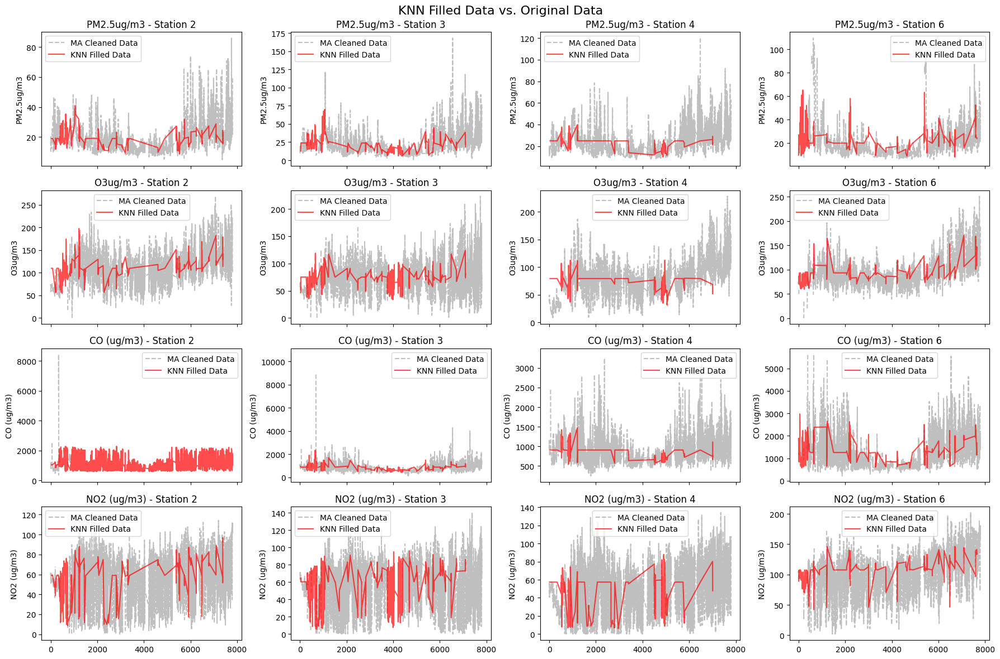

In [ ]:
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']

stations = [2, 3, 4, 6]

fig, axes = plt.subplots(len(pollutants), len(stations), figsize=(18, 12), sharex=True)
fig.suptitle('KNN Filled Data vs. Original Data', fontsize=16)

for i, pollutant in enumerate(pollutants):
    for j, station in enumerate(stations):
        column_name = f'{pollutant}[{station}]'

        original_data = MA_cleaned_dfs[i][column_name]

        filled_data = knn_filled_dfs[i][column_name]

        filled_indices = original_data.isnull()

        axes[i, j].plot(original_data.index, original_data, label='MA Cleaned Data', linestyle='--', alpha=0.5, color='gray')

        knn_filled_values = filled_data[filled_indices]

        axes[i, j].plot(knn_filled_values.index, knn_filled_values, label='KNN Filled Data', color='red', alpha=0.7)

        axes[i, j].set_title(f'{pollutant} - Station {station}')
        axes[i, j].set_ylabel(pollutant)
        axes[i, j].legend()

plt.tight_layout()
plt.show()

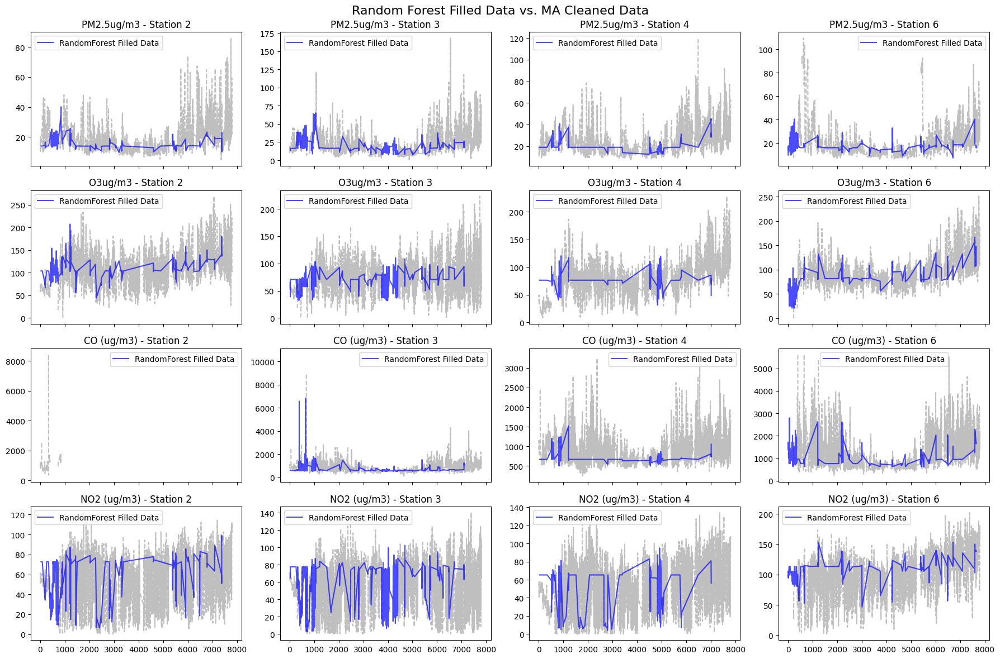

In [ ]:
# RandomForest Vs original
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]

fig, axes = plt.subplots(len(pollutants), len(stations), figsize=(18, 12), sharex=True)
fig.suptitle('Random Forest Filled Data vs. MA Cleaned Data', fontsize=16)

for i, pollutant in enumerate(pollutants):
    for j, station in enumerate(stations):
        column_name = f'{pollutant}[{station}]'

        original_data = MA_cleaned_dfs[i][column_name]

        filled_data = allCleaned_dfs[i][column_name]

        filled_indices = original_data.isnull()

        axes[i, j].plot(original_data.index, original_data, linestyle='--', alpha=0.5, color='gray')

        idw_filled_values = filled_data[filled_indices]

        axes[i, j].plot(idw_filled_values.index, idw_filled_values, label='RandomForest Filled Data', color='blue', alpha=0.7)

        axes[i, j].set_title(f'{pollutant} - Station {station}')
        axes[i, j].legend()

plt.tight_layout()
plt.show()

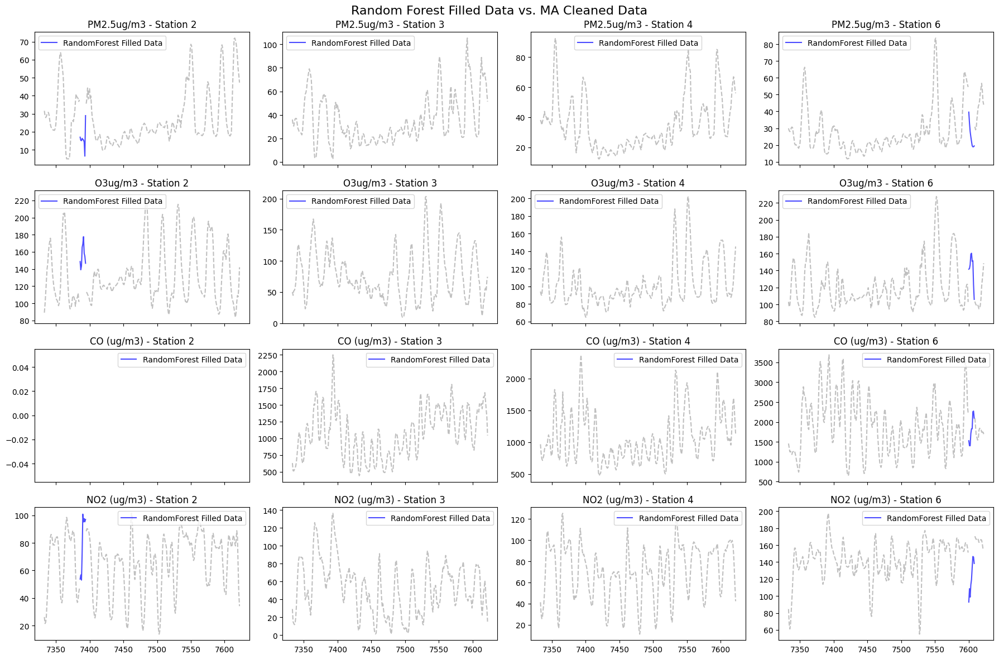

In [ ]:
# Missing value detail

pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]

fig, axes = plt.subplots(len(pollutants), len(stations), figsize=(18, 12), sharex=True)
fig.suptitle('Random Forest Filled Data vs. MA Cleaned Data', fontsize=16)

for i, pollutant in enumerate(pollutants):
    for j, station in enumerate(stations):
        column_name = f'{pollutant}[{station}]'

        original_data = MA_cleaned_dfs[i][column_name].iloc[6610:6900]

        filled_data = allCleaned_dfs[i][column_name].iloc[6610:6900]

        filled_indices = original_data.isnull()

        axes[i, j].plot(original_data.index, original_data, linestyle='--', alpha=0.5, color='gray')

        idw_filled_values = filled_data[filled_indices]

        axes[i, j].plot(idw_filled_values.index, idw_filled_values, label='RandomForest Filled Data', color='blue', alpha=0.7)

        axes[i, j].set_title(f'{pollutant} - Station {station}')
        axes[i, j].legend()

plt.tight_layout()
plt.show()

In [ ]:
for i, (pollutant, station) in enumerate(zip(pollutants, stations)):
    column_name = f'{pollutant}[{station}]'

    original_data = MA_cleaned_dfs[i][column_name]
    rf_filled_data = allCleaned_dfs[i][column_name]
    knn_filled_data = knn_filled_dfs[i][column_name]

    missing_indices = original_data[original_data.notnull() & MA_cleaned_dfs_missing[i][column_name].isnull()].index

    original_values = original_data.loc[missing_indices].values
    rf_filled_values = rf_filled_data.loc[missing_indices].values
    knn_filled_values = knn_filled_data.loc[missing_indices].values  # Extract KNN filled values

    # Calculate metrics for Random Forest
    mse_rf = mean_squared_error(original_values, rf_filled_values)
    rmse_rf = np.sqrt(mse_rf)
    mae_rf = mean_absolute_error(original_values, rf_filled_values)
    mape_rf = np.mean(np.abs((original_values - rf_filled_values) / original_values)) * 100

    # Calculate metrics for KNN
    mse_knn = mean_squared_error(original_values, knn_filled_values)
    rmse_knn = np.sqrt(mse_knn)
    mae_knn = mean_absolute_error(original_values, knn_filled_values)
    mape_knn = np.mean(np.abs((original_values - knn_filled_values) / original_values)) * 100


    # Create a DataFrame for comparison with both Random Forest and KNN filled data
    comparison_df = pd.DataFrame({
        'Original Data': original_values,
        'Random Forest Filled Data': rf_filled_values,
        'KNN Filled Data': knn_filled_values  # Add KNN filled data column
    }, index=missing_indices)

    # Display the comparison DataFrame
    print(f"Comparison for {pollutant} at Station {station}:")
    display(comparison_df)

    # Print metrics for both Random Forest and KNN
    print(f"  Random Forest Metrics:")
    print(f"    RMSE: {rmse_rf:.2f}")
    print(f"    MAE: {mae_rf:.2f}")
    print(f"    MAPE: {mape_rf:.2f}%")
    print("\n")

    print(f"  KNN Metrics:")
    print(f"    RMSE: {rmse_knn:.2f}")
    print(f"    MAE: {mae_knn:.2f}")
    print(f"    MAPE: {mape_knn:.2f}%")
    print("\n")

Comparison for PM2.5ug/m3 at Station 2:


,Original Data,Random Forest Filled Data,KNN Filled Data
7355,57.966250,62.789352,58.582639
7360,54.418750,48.019240,39.985228
7377,28.234583,36.352617,33.294495
7441,13.283750,15.731406,14.689306
7482,24.203333,16.499252,22.049444
7506,23.708333,23.135453,21.321844
7536,26.945417,29.600901,23.509513
7566,17.922198,24.958730,35.596389
7574,43.551667,44.893827,40.371389
7616,70.744583,49.054950,40.291528


  Random Forest Metrics:
    RMSE: 8.51
    MAE: 6.28
    MAPE: 18.44%


  KNN Metrics:
    RMSE: 12.28
    MAE: 8.08
    MAPE: 23.68%


Comparison for O3ug/m3 at Station 3:


,Original Data,Random Forest Filled Data,KNN Filled Data
7346,96.252433,73.495367,95.909284
7347,93.326510,69.867788,94.925442
7390,116.348646,93.057225,116.027295
7393,126.777083,85.120786,95.657309
7414,73.080854,77.854582,101.549687
7418,67.592633,71.741047,77.252229
7444,47.701732,63.658526,86.751344
7503,56.123998,67.685427,83.779204
7509,127.349625,126.698865,110.149966
7611,50.432742,56.634300,80.837184


  Random Forest Metrics:
    RMSE: 19.53
    MAE: 15.45
    MAPE: 18.12%


  KNN Metrics:
    RMSE: 23.21
    MAE: 18.58
    MAPE: 28.51%


Comparison for CO (ug/m3) at Station 4:


,Original Data,Random Forest Filled Data,KNN Filled Data
7353,1631.044500,1116.137084,1336.602083
7403,1578.069951,1385.993775,1278.777382
7417,968.226750,961.297035,1021.786333
7439,831.107067,976.973820,1064.519046
7508,952.100893,1030.918515,887.863500
7511,988.663750,1228.848293,1169.314244
7549,1842.594364,1375.908296,1029.203500
7554,1450.036188,1197.642645,1142.124292
7608,1239.783513,1302.445517,1468.694500
7621,1330.759820,1223.804814,965.938161


  Random Forest Metrics:
    RMSE: 261.56
    MAE: 206.75
    MAPE: 15.04%


  KNN Metrics:
    RMSE: 348.18
    MAE: 284.06
    MAPE: 20.69%


Comparison for NO2 (ug/m3) at Station 6:


,Original Data,Random Forest Filled Data,KNN Filled Data
7383,120.190651,88.746082,95.946594
7402,144.490550,117.312869,125.042005
7444,133.331858,134.173977,109.956873
7498,139.871808,135.687548,111.892742
7513,152.261642,111.601494,118.757764
7528,61.204208,106.624356,96.347944
7570,162.510700,127.991341,132.104473
7609,170.509200,142.583815,135.881243
7617,165.553267,162.670499,101.469741


  Random Forest Metrics:
    RMSE: 28.75
    MAE: 23.90
    MAPE: 20.99%


  KNN Metrics:
    RMSE: 34.77
    MAE: 32.53
    MAPE: 25.37%




Histogram chart

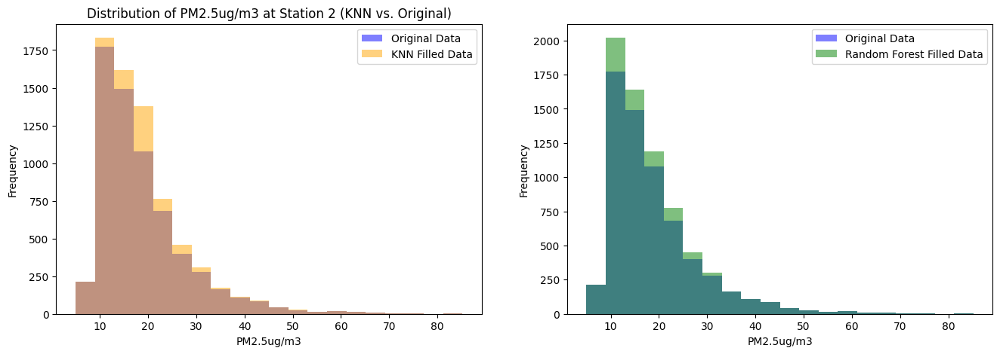

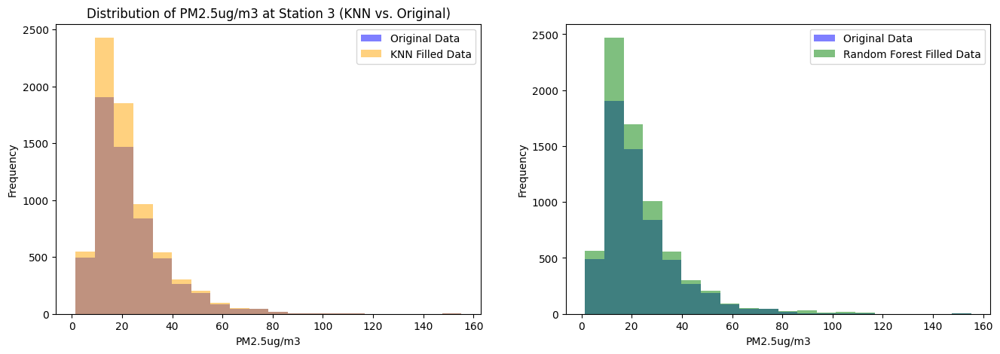

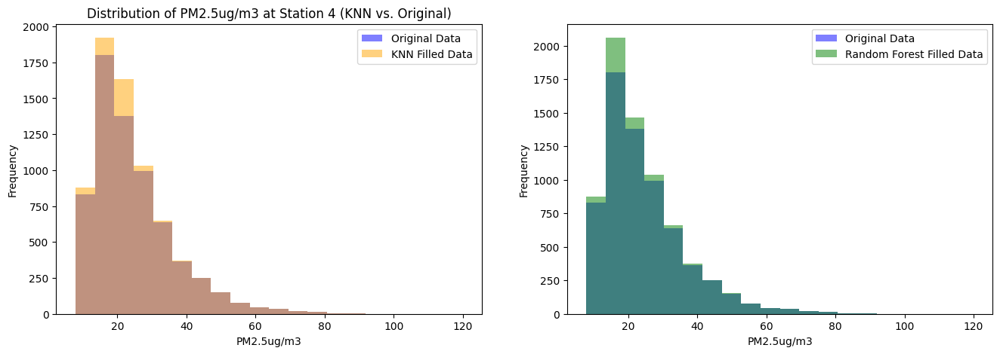

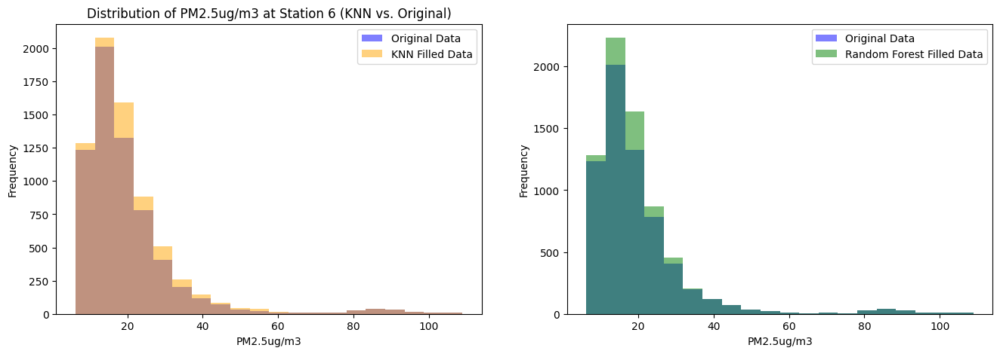

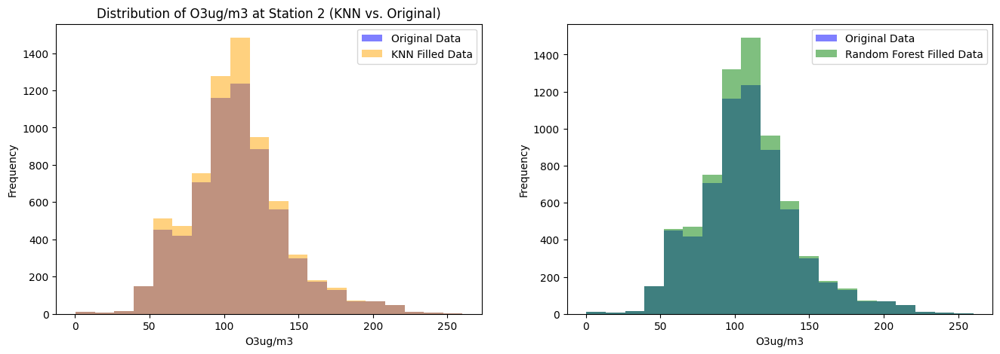

...

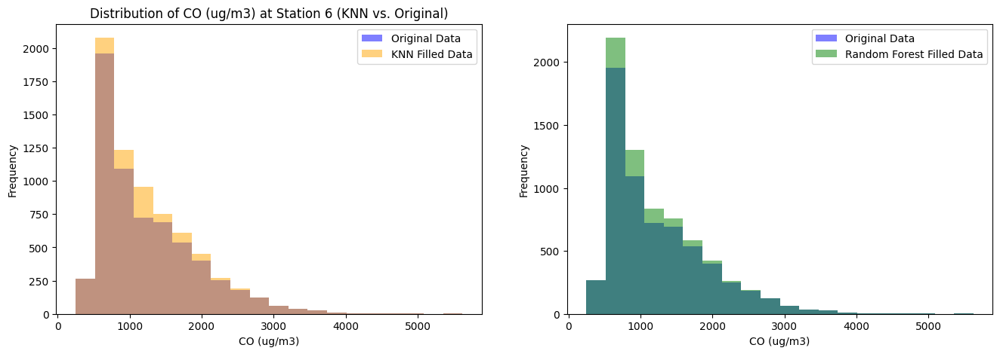

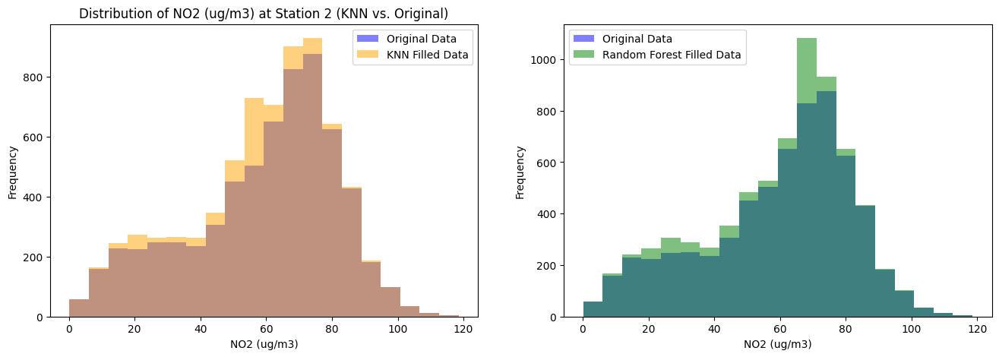

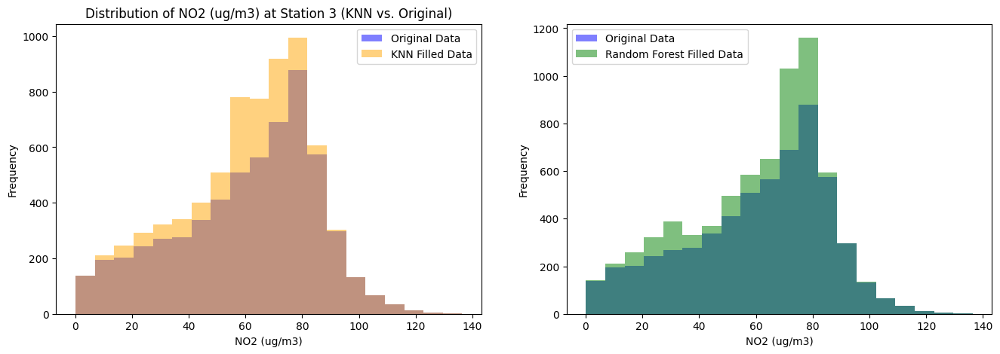

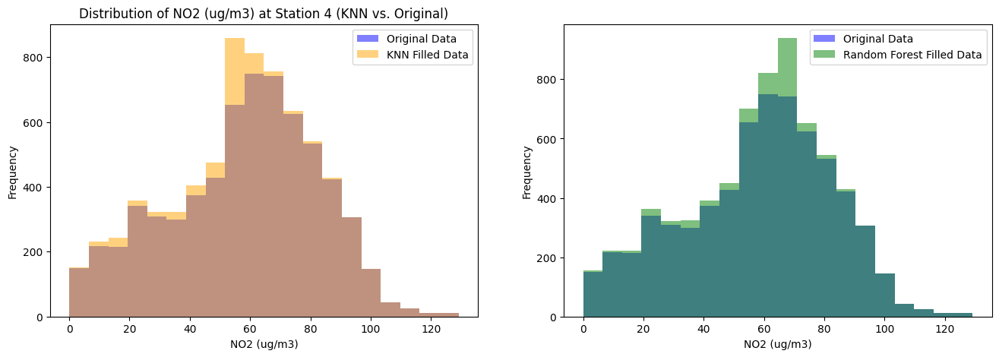

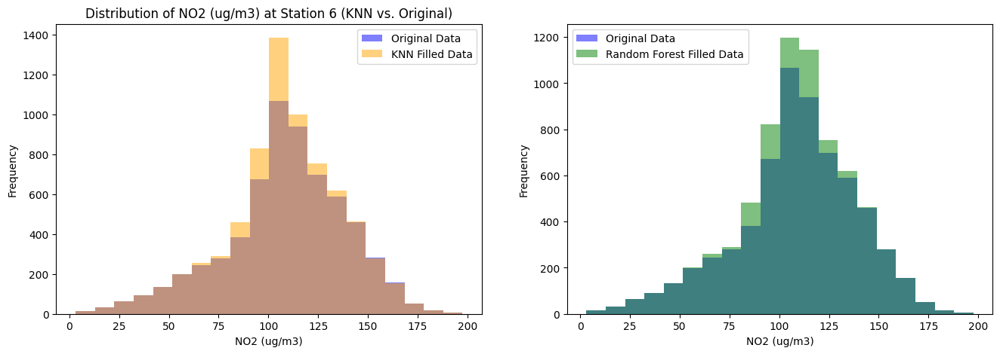

In [ ]:
pollutant_name = 'PM2.5ug/m3'

pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']

for pollutant in pollutants:
    for station in [2, 3, 4, 6]:
        column_name = f'{pollutant}[{station}]'

        original_data = MA_cleaned_dfs[pollutants.index(pollutant)][column_name]
        knn_filled_data = knn_filled_dfs[pollutants.index(pollutant)][column_name]
        rf_filled_data = allCleaned_dfs[pollutants.index(pollutant)][column_name]

        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

        ax1.hist(original_data.dropna(), bins=20, alpha=0.5, label='Original Data', color='blue')
        ax1.hist(knn_filled_data, bins=20, alpha=0.5, label='KNN Filled Data', color='orange')
        ax1.set_title(f'Distribution of {pollutant} at Station {station} (KNN vs. Original)')
        ax1.set_xlabel(pollutant)
        ax1.set_ylabel('Frequency')
        ax1.legend()

        ax2.hist(original_data.dropna(), bins=20, alpha=0.5, label='Original Data', color='blue')
        ax2.hist(rf_filled_data, bins=20, alpha=0.5, label='Random Forest Filled Data', color='green')
        #ax2.set_title(f'Distribution of {pollutant} at Station {station} (Random Forest vs. Original)')
        ax2.set_xlabel(pollutant)
        ax2.set_ylabel('Frequency')
        ax2.legend()

        plt.show()

Correlation matrix after imputation

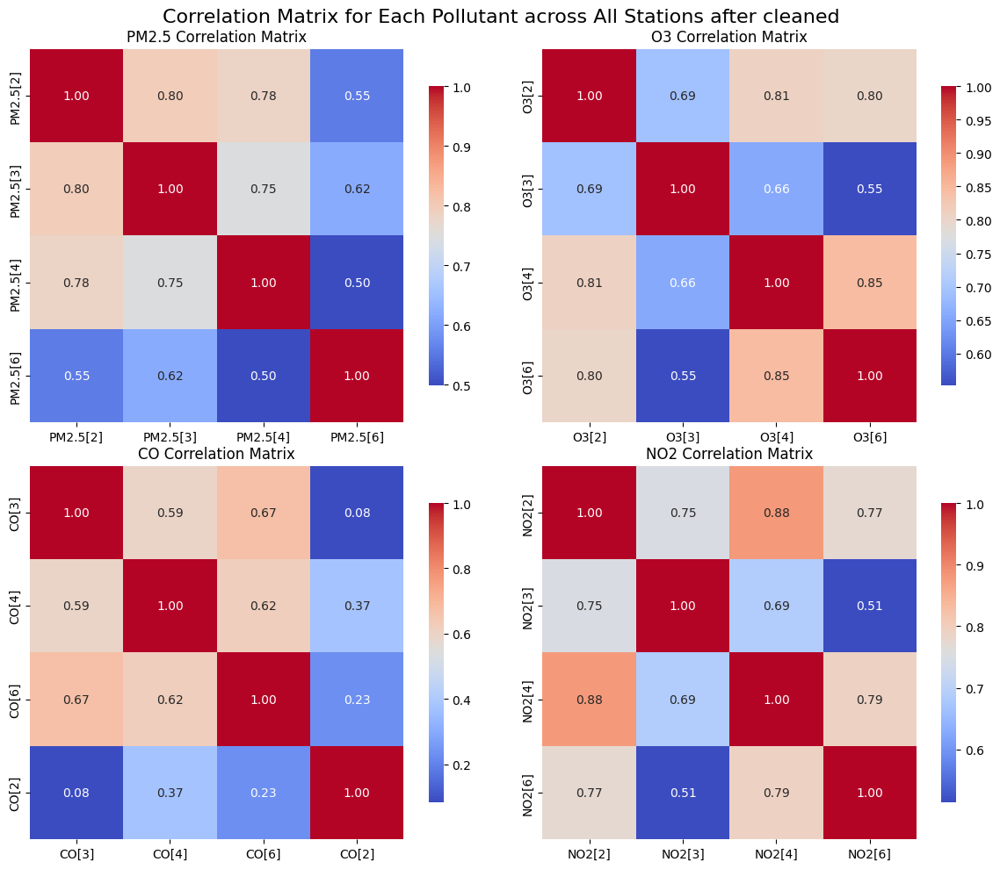

In [ ]:
pollutants = ['PM2.5ug/m3', 'O3ug/m3', 'CO (ug/m3)', 'NO2 (ug/m3)']
stations = [2, 3, 4, 6]

pollutant_labels = ['PM2.5', 'O3', 'CO', 'NO2']

modified_pollutant_dfs = [df.copy() for df in allCleaned_dfs]

for i, df in enumerate(modified_pollutant_dfs):
    column_mapping = {
        f'{pollutants[i]}[{station}]': f'{pollutant_labels[i]}[{station}]'
        for station in stations
    }
    df.rename(columns=column_mapping, inplace=True)

# Tạo figure và axes cho 4 subplot
fig, axes = plt.subplots(2, 2, figsize=(12, 10))
fig.suptitle('Correlation Matrix for Each Pollutant across All Stations after cleaned', fontsize=16)

# Lặp qua từng chất ô nhiễm và vẽ correlation matrix
for i, pollutant_label in enumerate(pollutant_labels):  # Lặp qua pollutant_labels
    # Chọn subplot tương ứng
    row = i // 2
    col = i % 2
    ax = axes[row, col]

    # Lấy DataFrame cho chất ô nhiễm hiện tại (sử dụng modified_pollutant_dfs)
    pollutant_df = modified_pollutant_dfs[i]

    # Tính toán correlation matrix
    correlation_matrix = pollutant_df.select_dtypes(include=['number']).corr()

    # Vẽ heatmap
    sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap='coolwarm',
                square=True, cbar_kws={"shrink": .8}, ax=ax)

    # Thiết lập tiêu đề cho subplot (sử dụng pollutant_label)
    ax.set_title(f'{pollutant_label} Correlation Matrix')

# Điều chỉnh layout và hiển thị
plt.tight_layout()
plt.show()

# IV. Pre-training a model for AQI prediction

In [ ]:
# Data after imputation process in Cleaned_dfs
# Now we combine

correction_df = cleaned_df[['date']].copy()

for temp_df in allCleaned_dfs:
    pollutant_cols = [col for col in temp_df.columns if col != 'date']  # Select pollutant columns
    correction_df = pd.concat([correction_df, temp_df[pollutant_cols]], axis=1)

correction_df = correction_df.loc[:, ~correction_df.columns.duplicated()]

correction_df

,date,PM2.5ug/m3[2],PM2.5ug/m3[3],PM2.5ug/m3[4],PM2.5ug/m3[6],O3ug/m3[2],O3ug/m3[3],O3ug/m3[4],O3ug/m3[6],CO (ug/m3)[2],CO (ug/m3)[3],CO (ug/m3)[4],CO (ug/m3)[6],NO2 (ug/m3)[2],NO2 (ug/m3)[3],NO2 (ug/m3)[4],NO2 (ug/m3)[6]
0,24-02-2021 04:00,10.143333,9.570833,10.574167,9.799167,74.054175,63.355825,48.616967,70.821971,1171.976000,1116.586000,1145.904500,1719.103662,60.835650,71.766933,54.389800,103.495941
1,24-02-2021 05:00,10.181667,9.597778,10.624444,9.913066,73.067222,63.077733,47.853578,69.541362,1170.511667,1114.421333,1142.180000,1717.836304,60.359922,71.683289,54.316611,103.461346
2,24-02-2021 06:00,10.411667,9.756667,10.927222,10.758461,72.096628,62.870528,46.653967,69.809752,1181.398667,1125.499333,1150.775000,1720.255549,59.993978,71.651922,54.285244,103.532946
3,24-02-2021 07:00,11.866667,11.031111,12.606111,12.512805,73.961478,62.184841,49.205867,70.757721,1166.691667,1124.480667,1138.169000,1720.255549,59.377100,71.043409,53.856567,103.237944
4,24-02-2021 08:00,13.902500,12.906111,14.886379,15.310972,73.608865,61.020673,49.264837,71.018087,1025.288000,993.518333,1013.000333,1556.099324,61.175456,69.721827,54.933489,103.591869
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7796,15-01-2022 00:00,23.526111,31.863889,32.559259,33.108964,121.673283,89.163822,112.349033,122.540552,NaN,1182.799333,958.777556,1727.800028,105.883411,104.137333,91.726589,178.881442
7797,15-01-2022 01:00,25.652778,34.251609,35.864259,34.875480,117.531052,58.533501,108.281261,117.718263,NaN,1120.880207,974.566889,1833.833085,111.631082,74.659877,90.670578,181.440572
7798,15-01-2022 02:00,39.008889,47.471609,40.510956,37.711591,102.939419,49.754529,106.784547,113.672302,NaN,1174.933207,1181.357943,1589.607751,107.846171,64.183411,95.972675,176.223250
7799,15-01-2022 03:00,48.567778,63.384943,56.124228,48.106516,105.295019,61.074496,105.984807,108.813600,NaN,1286.477207,1512.106276,1421.704723,109.017193,73.352933,105.661490,168.561986


1. AQI Caculation funtion

In [ ]:
def calculate_AQI(concentration, target):
    """
    Tính toán chỉ số AQI cho một chất ô nhiễm tại một trạm quan trắc.
    Args:
        concentration: Nồng độ của chất ô nhiễm (số thực).
        target: Tên của chất ô nhiễm (chuỗi),
                hỗ trợ 'CO' (mg/m3), 'NO2' (µg/m3), 'O3' (µg/m3), 'PM2.5' (µg/m3), 'PM10' (µg/m3), 'SO2' (µg/m3).
    Returns:
        Chỉ số AQI (số nguyên) hoặc None nếu chất ô nhiễm không hợp lệ hoặc nồng độ nằm ngoài bảng điểm ngắt.
    """
    # Bảng điểm ngắt nồng độ và chỉ số AQI theo Quyết định 1459/QĐ-TCMT
    bp_table = {
        'CO': [
            (0, 10000, 0, 50),
            (10000, 30000, 50, 100),
            (30000, 45000, 100, 150),
            (45000, 60000, 150, 200),
            (60000, 90000, 200, 300),
            (90000, 120000, 300, 400),
            (120000, 150000, 400, 500),
        ],
        'NO2': [
            (0, 100, 0, 50),
            (100, 200, 50, 100),
            (200, 700, 100, 150),
            (700, 1200, 150, 200),
            (1200, 2350, 200, 300),
            (2350, 3100, 300, 400),
            (3100, 3850, 400, 500),
        ],
        'O3': [
            (0, 160, 0, 50),
            (160, 200, 51, 100),
            (200, 300, 101, 150),
            (300, 400, 151, 200),
            (400, 800, 201, 300),
            (800, 1000, 300, 400),
            (1000, 1200, 400, 500),
        ],
        'PM2.5': [
            (0, 25, 0, 50),
            (25, 50, 50, 100),
            (50, 80, 100, 150),
            (80, 150, 150, 200),
            (150, 250, 200, 300),
            (250, 350, 300, 400),
            (350, 500, 400, 500),
        ],
    }

    if target not in bp_table:

      return None


    max_BPHi = bp_table[target][-1][1]  # Last tuple, second element (BPHi)

    for BPLo, BPHi, ILo, IHi in bp_table[target]:

      if BPLo < concentration <= BPHi:
        IAQI = ((IHi - ILo) / (BPHi - BPLo)) * (concentration - BPLo) + ILo
        return round(IAQI)

    if concentration > max_BPHi:
     return 500

    #print(f"Nồng độ {concentration} của {chat_o_nhiem} nằm ngoài bảng điểm ngắt.")
    return None

2. Caculate AQI for station with trending pollutant

In [ ]:
aqi_station = []

# Mapping of pollutants to numbers
pollutant_mapping = {
    'PM2.5': 1,
    'O3': 2,
    'CO': 3,
    'NO2': 4
}

for i in (2, 3, 4, 6):
    # Create a temporary DataFrame for station i
    df_station = correction_df[[f'PM2.5ug/m3[{i}]', f'O3ug/m3[{i}]', f'CO (ug/m3)[{i}]', f'NO2 (ug/m3)[{i}]']]

    # Rename columns to match the AQI calculation function
    df_station = df_station.rename(columns={
        f'PM2.5ug/m3[{i}]': 'PM2.5ug/m3',
        f'O3ug/m3[{i}]': 'O3ug/m3',
        f'CO (ug/m3)[{i}]': 'CO (ug/m3)',
        f'NO2 (ug/m3)[{i}]': 'NO2 (ug/m3)'
    })

    # Calculate AQI for each pollutant at station i
    df_station[f'AQI_PM2.5[{i}]'] = df_station['PM2.5ug/m3'].apply(lambda x: calculate_AQI(x, 'PM2.5'))
    df_station[f'AQI_O3[{i}]'] = df_station['O3ug/m3'].apply(lambda x: calculate_AQI(x, 'O3'))
    df_station[f'AQI_CO[{i}]'] = df_station['CO (ug/m3)'].apply(lambda x: calculate_AQI(x, 'CO'))
    df_station[f'AQI_NO2[{i}]'] = df_station['NO2 (ug/m3)'].apply(lambda x: calculate_AQI(x, 'NO2'))

    # Calculate overall AQI for station i
    df_station[f'AQI_Station[{i}]'] = df_station[[f'AQI_PM2.5[{i}]', f'AQI_O3[{i}]', f'AQI_CO[{i}]', f'AQI_NO2[{i}]']].max(axis=1)

    # Identify the pollutant responsible for max AQI
    df_station[f'Max_AQI_Pollutant[{i}]'] = df_station[[f'AQI_PM2.5[{i}]', f'AQI_O3[{i}]', f'AQI_CO[{i}]', f'AQI_NO2[{i}]']].idxmax(axis=1).map({
        f'AQI_PM2.5[{i}]': pollutant_mapping['PM2.5'],
        f'AQI_O3[{i}]': pollutant_mapping['O3'],
        f'AQI_CO[{i}]': pollutant_mapping['CO'],
        f'AQI_NO2[{i}]': pollutant_mapping['NO2']
    })

    aqi_station.append(df_station[[f'AQI_PM2.5[{i}]', f'AQI_O3[{i}]', f'AQI_CO[{i}]', f'AQI_NO2[{i}]', f'AQI_Station[{i}]', f'Max_AQI_Pollutant[{i}]']])

    # Calculate the maximum AQI for each station
    max_aqi_per_station = df_station[f'AQI_Station[{i}]'].max()

    print(f"Station {i}: Max AQI = {max_aqi_per_station}")

df_aqi = pd.concat(aqi_station, axis=1)

df_aqi.insert(0, 'date', correction_df['date'])



Station 2: Max AQI = 154.0
Station 3: Max AQI = 218
Station 4: Max AQI = 179
Station 6: Max AQI = 171


In [ ]:
df_aqi

,date,AQI_PM2.5[2],AQI_O3[2],AQI_CO[2],AQI_NO2[2],AQI_Station[2],Max_AQI_Pollutant[2],AQI_PM2.5[3],AQI_O3[3],AQI_CO[3],...,AQI_CO[4],AQI_NO2[4],AQI_Station[4],Max_AQI_Pollutant[4],AQI_PM2.5[6],AQI_O3[6],AQI_CO[6],AQI_NO2[6],AQI_Station[6],Max_AQI_Pollutant[6]
0,24-02-2021 04:00,20,23,6.0,30,30.0,4,19,20,6,...,6,27,27,4,20,22,9,53,53,4
1,24-02-2021 05:00,20,23,6.0,30,30.0,4,19,20,6,...,6,27,27,4,20,22,9,53,53,4
2,24-02-2021 06:00,21,23,6.0,30,30.0,4,20,20,6,...,6,27,27,4,21,22,9,53,53,4
3,24-02-2021 07:00,24,23,6.0,30,30.0,4,22,19,6,...,6,27,27,4,25,22,9,53,53,4
4,24-02-2021 08:00,28,23,5.0,31,31.0,4,26,19,5,...,5,27,30,1,29,22,8,53,53,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7796,15-01-2022 00:00,47,38,NaN,53,53.0,4,64,28,6,...,5,46,65,1,66,38,9,89,89,4
7797,15-01-2022 01:00,51,37,NaN,56,56.0,4,69,18,6,...,5,45,72,1,70,37,9,91,91,4
7798,15-01-2022 02:00,78,32,NaN,54,78.0,1,95,16,6,...,6,48,81,1,75,36,8,88,88,4
7799,15-01-2022 03:00,97,33,NaN,55,97.0,1,122,19,6,...,8,53,110,1,96,34,7,84,96,1


In [ ]:
# Split df_aqi into 4 sub-DataFrames
station_dfs = []  # List to store the sub-DataFrames

# Select all AQI_Station columns
aqi_station_columns = [col for col in df_aqi.columns if col.startswith('AQI_Station')]

for station_number in [2, 3, 4, 6]:
    # Select columns for the current station, including all AQI_Station columns
    columns_to_select = ['date',
                        f'AQI_PM2.5[{station_number}]',
                        f'AQI_O3[{station_number}]',
                        f'AQI_CO[{station_number}]',
                        f'AQI_NO2[{station_number}]',
                        f'Max_AQI_Pollutant[{station_number}]'] + aqi_station_columns

    # Create a sub-DataFrame for the current station
    station_df = df_aqi[columns_to_select]

    # Add the sub-DataFrame to the list
    station_dfs.append(station_df)

station_dfs[1]

,date,AQI_PM2.5[3],AQI_O3[3],AQI_CO[3],AQI_NO2[3],Max_AQI_Pollutant[3],AQI_Station[2],AQI_Station[3],AQI_Station[4],AQI_Station[6]
0,24-02-2021 04:00,19,20,6,36,4,30.0,36,27,52
1,24-02-2021 05:00,19,20,6,36,4,30.0,36,27,52
2,24-02-2021 06:00,20,20,6,36,4,30.0,36,27,52
3,24-02-2021 07:00,22,19,6,36,4,30.0,36,27,52
4,24-02-2021 08:00,26,19,5,35,4,31.0,35,30,52
...,...,...,...,...,...,...,...,...,...,...
7796,15-01-2022 00:00,64,28,6,52,1,53.0,64,65,89
7797,15-01-2022 01:00,69,18,6,37,1,56.0,69,72,91
7798,15-01-2022 02:00,95,16,6,32,1,78.0,95,81,88
7799,15-01-2022 03:00,122,19,6,37,1,97.0,122,110,96


In [ ]:
# Create CSV files for each station
for i, station_df in enumerate(station_dfs):
    # Create a filename based on the station number
    station_number = [2, 3, 4, 6][i]  # Get the station number from the loop index
    filename = f'station_{station_number}_aqi.csv'

    # Save the DataFrame to a CSV file
    station_df.to_csv(filename, index=False)

    print(f"Data for station {station_number} saved to {filename}")

Data for station 2 saved to station_2_aqi.csv
Data for station 3 saved to station_3_aqi.csv
Data for station 4 saved to station_4_aqi.csv
Data for station 6 saved to station_6_aqi.csv


In [ ]:
# Select the relevant columns
aqi_columns = [f'AQI_Station[{i}]' for i in [2, 3, 4, 6]]

# Get the last 48 records for the selected columns
last_48_records = df_aqi[aqi_columns].tail(48)

# Display the results
print(last_48_records)

      AQI_Station[2]  AQI_Station[3]  AQI_Station[4]  AQI_Station[6]
7753            53.0             109              77              88
7754            86.0             138              96              96
7755           124.0             157             118             113
7756           154.0             157             142             126
7757           154.0             151             145             132
7758           147.0             140             141             131
7759           140.0             142             124             139
7760           125.0             142              98             136
7761           119.0             123              90             131
7762           111.0             102              98             116
7763            99.0              86             102             111
7764            87.0              73              96             102
7765            76.0              62              78              77
7766            71.0              

In [ ]:
# Addition feature to improve forecast result

def add_features(df, aqi_column='AQI_Station', min_delta=1, consecutive_hours=3, delta_levels = [1, 5, 10]):
    """
    Adds 'normalized_date' and an enhanced 'rush_hour' column to the DataFrame.

    Args:
        df: The input DataFrame.
        aqi_column: The name of the column containing AQI values.
        min_delta: The minimum average change in AQI to be considered as an increasing/decreasing trend.
        consecutive_hours: The minimum number of consecutive hours for an increasing/decreasing trend.
        delta_levels: A list of delta thresholds for assigning different rush_hour levels (e.g., [1, 5, 10]).

    Returns:
        DataFrame with the added 'normalized_date' and 'rush_hour' columns.
    """

    # Normalize date
    df['date'] = pd.to_datetime(df['date'])

    # 2.0 Experimental Advanced: Calculate AQI rolling average
    df['aqi_rolling_avg'] = df[aqi_column].rolling(window=consecutive_hours, center=True).mean()
    df.loc[:, 'aqi_rolling_avg'] = df['aqi_rolling_avg'].fillna(method='bfill')  # Fill NaNs using backward fill
    df.loc[:, 'aqi_rolling_avg'] = df['aqi_rolling_avg'].fillna(method='ffill')  # Fill remaining NaNs using forward fill

    # Round the aqi_rolling_avg column
    df.loc[:, 'aqi_rolling_avg'] = np.round(df['aqi_rolling_avg'])


    # Add rush_hour feature
    df['rush_hour'] = 0
    df['aqi_diff'] = df[aqi_column].diff()
    df['aqi_diff'].fillna(0, inplace=True)

    trend = 0  # 1 for increasing, -1 for decreasing, 0 for no trend
    trend_start = 0

    delta_levels.sort() # Ensure delta_levels is sorted in ascending order

    for i in df.index[1:]:
        if df.loc[i, 'aqi_diff'] > min_delta:
            if trend >= 0: # Allow trend to continue or start
                trend += 1 if trend == 0 else (1 if df.loc[i, 'aqi_diff'] > delta_levels[1] else 0) # Check if should increase level
                if trend == 1:
                  trend_start = i # new trend
                if i - trend_start + 1 >= consecutive_hours:
                    level = 0
                    for delta in delta_levels:
                      if df.loc[i, 'aqi_diff'] > delta:
                        level += 1
                      else:
                        break
                    df.loc[trend_start:i, 'rush_hour'] = level
            else: # trend < 0
                trend = 1
                trend_start = i
        elif df.loc[i, 'aqi_diff'] < -min_delta:
            if trend <= 0:
                trend -= 1 if trend == 0 else (1 if -df.loc[i, 'aqi_diff'] > delta_levels[1] else 0)
                if trend == -1:
                  trend_start = i
                if i - trend_start + 1 >= consecutive_hours:
                    level = 0
                    for delta in delta_levels:
                      if -df.loc[i, 'aqi_diff'] > delta:
                        level += 1
                      else:
                        break
                    df.loc[trend_start:i, 'rush_hour'] = -level
            else: #trend > 0
                trend = -1
                trend_start = i
        else:
            trend = 0

    df.drop(columns=['aqi_diff'], inplace=True)  # Remove 'aqi_diff' column
    return df

## Prepare data
station2 = station_dfs[0].copy()
station3 = station_dfs[1].copy()
station4 = station_dfs[2].copy()
station6 = station_dfs[3].copy()

def remove_station_prefix(df, station_number):
    """
    Removes station-specific prefixes from column names in a pandas DataFrame.

    Args:
        df: The pandas DataFrame to modify.
        station_number: The station number to remove from column names.

    Returns:
        The modified DataFrame with station-specific prefixes removed.
    """
    # Create a dictionary to store the renamed columns
    renamed_columns = {}

    # Iterate through each column name
    for col in df.columns:
        # Check if the column name contains the station number in brackets
        if f'[{station_number}]' in col:
            # If it does, remove the station number and add it to the dictionary
            renamed_columns[col] = col.split(f'[{station_number}]')[0]

    # Rename the columns in the DataFrame
    df.rename(columns=renamed_columns, inplace=True)

    # Return the modified DataFrame
    return df

station2 = remove_station_prefix(station2, 2)
station3 = remove_station_prefix(station3, 3)
station4 = remove_station_prefix(station4, 4)
station6 = remove_station_prefix(station6, 6)

add_features(station2, aqi_column='AQI_Station', min_delta=1, consecutive_hours=3, delta_levels = [1.5, 4, 8])
add_features(station3, aqi_column='AQI_Station', min_delta=1, consecutive_hours=3, delta_levels = [1.5, 4, 8])
add_features(station4, aqi_column='AQI_Station', min_delta=1, consecutive_hours=3, delta_levels = [1.5, 4, 8])
add_features(station6, aqi_column='AQI_Station', min_delta=1, consecutive_hours=3, delta_levels = [1.5, 4, 8])

<ipython-input-24-706106d62f19>:19: UserWarning: Parsing dates in %d-%m-%Y %H:%M format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df['date'] = pd.to_datetime(df['date'])
<ipython-input-24-706106d62f19>:23: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.loc[:, 'aqi_rolling_avg'] = df['aqi_rolling_avg'].fillna(method='bfill')  # Fill NaNs using backward fill
<ipython-input-24-706106d62f19>:24: FutureWarning: Series.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  df.loc[:, 'aqi_rolling_avg'] = df['aqi_rolling_avg'].fillna(method='ffill')  # Fill remaining NaNs using forward fill
<ipython-input-24-706106d62f19>:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will ch

,date,AQI_PM2.5,AQI_O3,AQI_CO,AQI_NO2,Max_AQI_Pollutant,AQI_Station[2],AQI_Station[3],AQI_Station[4],AQI_Station,aqi_rolling_avg,rush_hour
0,2021-02-24 04:00:00,20,22,9,52,4,30.0,36,27,52,52.0,0
1,2021-02-24 05:00:00,20,22,9,52,4,30.0,36,27,52,52.0,0
2,2021-02-24 06:00:00,22,22,9,52,4,30.0,36,27,52,52.0,0
3,2021-02-24 07:00:00,25,22,9,52,4,30.0,36,27,52,52.0,0
4,2021-02-24 08:00:00,31,22,8,52,4,31.0,35,30,52,53.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
7796,2022-01-15 00:00:00,66,38,9,89,4,53.0,64,65,89,87.0,1
7797,2022-01-15 01:00:00,70,37,9,91,4,56.0,69,72,91,89.0,1
7798,2022-01-15 02:00:00,75,36,8,88,4,78.0,95,81,88,92.0,0
7799,2022-01-15 03:00:00,96,34,7,84,1,97.0,122,110,96,98.0,0


from matplotlib import pyplot as plt
station6['AQI_PM2.5'].plot(kind='hist', bins=20, title='AQI_PM2.5')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
station6['AQI_O3'].plot(kind='hist', bins=20, title='AQI_O3')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
station6['AQI_CO'].plot(kind='hist', bins=20, title='AQI_CO')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
station6['AQI_NO2'].plot(kind='hist', bins=20, title='AQI_NO2')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
station6.plot(kind='scatter', x='AQI_PM2.5', y='AQI_O3', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
station6.plot(kind='scatter', x='AQI_O3', y='AQI_CO', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
station6.plot(kind='scatter', x='AQI_CO', y='AQI_NO2', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
station6.plot(kind='scatter', x='AQI_NO2', y='Max_AQI_Pollutant', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['date']
  ys = series['AQI_PM2.5']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = station6.sort_values('date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('date')
_ = plt.ylabel('AQI_PM2.5')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['date']
  ys = series['AQI_O3']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = station6.sort_values('date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('date')
_ = plt.ylabel('AQI_O3')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['date']
  ys = series['AQI_CO']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = station6.sort_values('date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('date')
_ = plt.ylabel('AQI_CO')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['date']
  ys = series['AQI_NO2']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = station6.sort_values('date', ascending=True)
_plot_series(df_sorted, '')
sns.despine(fig=fig, ax=ax)
plt.xlabel('date')
_ = plt.ylabel('AQI_NO2')

from matplotlib import pyplot as plt
station6['AQI_PM2.5'].plot(kind='line', figsize=(8, 4), title='AQI_PM2.5')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
station6['AQI_O3'].plot(kind='line', figsize=(8, 4), title='AQI_O3')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
station6['AQI_CO'].plot(kind='line', figsize=(8, 4), title='AQI_CO')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
station6['AQI_NO2'].plot(kind='line', figsize=(8, 4), title='AQI_NO2')
plt.gca().spines[['top', 'right']].set_visible(False)

Error: Runtime no longer has a reference to this dataframe, please re-run this cell and try again.


In [ ]:
station6

,date,AQI_PM2.5,AQI_O3,AQI_CO,AQI_NO2,Max_AQI_Pollutant,AQI_Station[2],AQI_Station[3],AQI_Station[4],AQI_Station,aqi_rolling_avg,rush_hour
0,2021-02-24 04:00:00,20,22,9,53,4,30.0,36,27,53,53.0,0
1,2021-02-24 05:00:00,20,22,9,53,4,30.0,36,27,53,53.0,0
2,2021-02-24 06:00:00,21,22,9,53,4,30.0,36,27,53,53.0,0
3,2021-02-24 07:00:00,25,22,9,53,4,30.0,36,27,53,53.0,0
4,2021-02-24 08:00:00,29,22,8,53,4,31.0,35,30,53,53.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
7796,2022-01-15 00:00:00,66,38,9,89,4,53.0,64,65,89,87.0,1
7797,2022-01-15 01:00:00,70,37,9,91,4,56.0,69,72,91,89.0,1
7798,2022-01-15 02:00:00,75,36,8,88,4,78.0,95,81,88,92.0,0
7799,2022-01-15 03:00:00,96,34,7,84,1,97.0,122,110,96,98.0,0


<ipython-input-289-0b374bb7ed2d>:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(pollutant_names)
<ipython-input-289-0b374bb7ed2d>:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(pollutant_names)
<ipython-input-289-0b374bb7ed2d>:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(pollutant_names)
<ipython-input-289-0b374bb7ed2d>:42: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(pollutant_names)


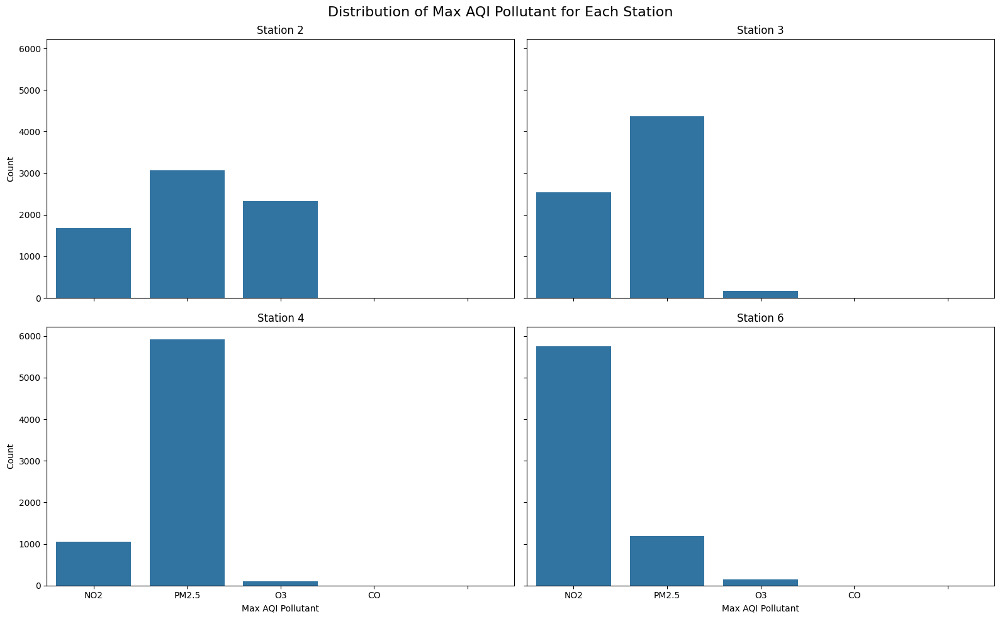

In [ ]:
# Mapping of pollutants to numbers (reversed)
pollutant_mapping = {
    1: 'PM2.5',
    2: 'O3',
    3: 'CO',
    4: 'NO2'
}

fig, axes = plt.subplots(2, 2, figsize=(16, 10), sharex=True, sharey=True)  # 2 rows, 2 columns
fig.suptitle('Distribution of Max AQI Pollutant for Each Station', fontsize=16)

# List of station numbers
station_nums = [2, 3, 4, 6]

# Iterate through stations and create subplots
for i, station_num in enumerate(station_nums):
    row = i // 2  # Calculate row index
    col = i % 2   # Calculate column index
    ax = axes[row, col]  # Get the current subplot

    pollutant_column = f'Max_AQI_Pollutant[{station_num}]'

    if pollutant_column in df_aqi.columns:
        # Get unique pollutants for the current station
        unique_pollutants = df_aqi[pollutant_column].unique()

        # Map pollutants to names using pollutant_mapping
        pollutant_names = [pollutant_mapping.get(pollutant, str(pollutant))
                            for pollutant in unique_pollutants]
        if 'CO' not in pollutant_names:
            pollutant_names.append('CO')
            unique_pollutants = np.append(unique_pollutants, pollutant_mapping[3]) # add code mapping to unique_pollutants
        # Create countplot with order and specific labels
    # Create countplot without xticklabels argument
        sns.countplot(
            x=pollutant_column,
            data=df_aqi,
            ax=ax,
            order=unique_pollutants,
        )
        ax.set_xticklabels(pollutant_names)
        ax.set_title(f'Station {station_num}')
        ax.set_xlabel('Max AQI Pollutant')
        ax.set_ylabel('Count')


    else:
        print(f"Warning: Column '{pollutant_column}' not found in df_aqi.")

plt.tight_layout()  # Adjust layout for better spacing
plt.show()

3. Evaluator class

In [ ]:
class ModelEvaluator:
    @staticmethod
    def calculate_mape(y_true: np.ndarray, y_pred: np.ndarray) -> float:
        """Calculate Mean Absolute Percentage Error"""
        mask = y_true != 0
        return np.mean(np.abs((y_true[mask] - y_pred[mask]) / y_true[mask])) * 100

    @staticmethod
    def calculate_smape(y_true: np.ndarray, y_pred: np.ndarray) -> float:
        """Calculate Symmetric Mean Absolute Percentage Error"""
        return np.mean(2.0 * np.abs(y_pred - y_true) / (np.abs(y_true) + np.abs(y_pred))) * 100

    @staticmethod
    def calculate_mase(y_true: np.ndarray, y_pred: np.ndarray, y_train: np.ndarray, seasonality: int = 24) -> float:
        """Calculate Mean Absolute Scaled Error"""
        # Calculate naive seasonal forecast error (denominator)
        seasonal_errors = np.mean(np.abs(y_train[seasonality:] - y_train[:-seasonality]))

        # Calculate prediction error (numerator)
        prediction_errors = np.mean(np.abs(y_true - y_pred))

        return prediction_errors / seasonal_errors

    @staticmethod
    def calculate_directional_accuracy(y_true: np.ndarray, y_pred: np.ndarray) -> float:
        """
        Calculate the directional accuracy.
        """
        if len(y_true) < 2 or len(y_pred) < 2:
          return np.nan
        y_true_diff = np.diff(y_true)
        y_pred_diff = np.diff(y_pred)
        return np.mean((np.sign(y_true_diff) == np.sign(y_pred_diff)).astype(int)) * 100

    def evaluate_numeric_predictions(self, y_true: np.ndarray, y_pred: np.ndarray, y_train: np.ndarray = None) -> Dict[str, float]:
        """Calculate all metrics for numeric predictions"""
        metrics = {
            'MAE': mean_absolute_error(y_true, y_pred),
            'RMSE': np.sqrt(mean_squared_error(y_true, y_pred)),
            'MAPE': self.calculate_mape(y_true, y_pred),
            'Correlation': np.corrcoef(y_true, y_pred)[0, 1],  # Correlation coefficient
            'DA': self.calculate_directional_accuracy(y_true, y_pred) # Directional Accuracy
        }

        return metrics

    def evaluate_numeric_predictions_timeframes(self, y_true: np.ndarray, y_pred: np.ndarray, y_train: np.ndarray = None) -> Dict[str, Dict[str, float]]:
        """
        Calculate numeric prediction metrics for different timeframes: 1, 4, 8, and 24 hours ahead.
        """
        timeframes = [1, 2, 4, 8, 12, 16, 24, 36, 48]
        results = {}

        for timeframe in timeframes:
            if len(y_true) >= timeframe and len(y_pred) >= timeframe:
              y_true_tf = y_true[:timeframe]
              y_pred_tf = y_pred[:timeframe]

              results[f"{timeframe}h"] = self.evaluate_numeric_predictions(y_true_tf, y_pred_tf, y_train)
            else:
              results[f"{timeframe}h"] = {"Error": "Not enough data for this timeframe."}

        return results

    def evaluate_categorical_predictions(self, y_true: np.ndarray, y_pred: np.ndarray) -> float:
        """Calculate accuracy for categorical predictions"""
        return np.mean(y_true == y_pred) * 100

    def plot_predictions(self, y_true: np.ndarray, y_pred: np.ndarray,
                        title: str = "Prediction vs Actual Values",
                        hours_ahead: int = 48) -> None:
        """Plot the predictions against actual values"""
        plt.figure(figsize=(15, 6))

        # Create hour labels for x-axis
        hours = [f"H+{i+1}" for i in range(hours_ahead)]

        # Plot actual values
        plt.plot(hours, y_true, label='Actual', marker='o')
        # Plot predicted values
        plt.plot(hours, y_pred, label='Predicted', marker='x')

        plt.title(title)
        plt.xlabel('Hours Ahead')
        plt.ylabel('Value')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

    def plot_categorical_comparison(self, y_true: np.ndarray, y_pred: np.ndarray,
                                  class_names: list, hours_ahead: int = 48) -> None:
        """Plot categorical predictions comparison"""
        plt.figure(figsize=(15, 6))
        # Get the actual number of data points
        num_data_points = len(y_true)

        # Adjust hours array to match data points
        hours = [f"H+{i+1}" for i in range(num_data_points)]

        # Plot actual and predicted classes
        plt.plot(hours, [class_names[i] for i in y_true if 0 <= i < len(class_names)], label='Actual', marker='o')
        plt.plot(hours, [class_names[i] for i in y_pred if 0 <= i < len(class_names)], label='Predicted', marker='x')

        plt.title("Predicted vs Actual Pollutant Classes")
        plt.xlabel('Hours Ahead')
        plt.ylabel('Pollutant Class')
        plt.legend()
        plt.grid(True)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# V. Hybrid LSTM + CNN

In [ ]:
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, Flatten, LSTM, Dense, Dropout, concatenate, BatchNormalization, Activation, Bidirectional, Attention
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

1. Prepare Model


In [ ]:
class Cnn_Lstm_AirQualityPredictor:
    def __init__(self, lookback=168, forecast_range=48, epochs=100, batch_size=32,
                 cnn_filters=64, lstm_units=128, dropout_rate=0.2, learning_rate=0.001):
        self.lookback = lookback
        self.forecast_range = forecast_range
        self.epochs = epochs
        self.batch_size = batch_size
        self.cnn_filters = cnn_filters
        self.lstm_units = lstm_units
        self.dropout_rate = dropout_rate
        self.learning_rate = learning_rate
        # self.label_encoder = LabelEncoder()  # No longer used
        # Removed feature_scaler and target_scaler

    def prepare_data(self, df, isIncludeCO=True, stride=1):
        df['date'] = pd.to_datetime(df['date'])

        if isIncludeCO is True:
            features = ['aqi_rolling_avg', 'rush_hour']
            #features = ['aqi_rolling_avg', 'rush_hour']
        else:
            features = ['aqi_rolling_avg', 'rush_hour']

        # # Add AQI_Station[i] features if they exist
        # for station in [2, 3, 4, 6]:  # Iterate through station numbers
        #     column_name = f'AQI_Station[{station}]'
        #     if column_name in df.columns:
        #         features.append(column_name)

        X = df[features].values
        # Removed feature scaling
        y_numeric = df['AQI_Station'].values
        # Removed target scaling

        X_seq, y_seq = [], []
        for i in range(0, len(X) - self.lookback - self.forecast_range):
            X_seq.append(X[i:(i + self.lookback)])
            y_seq.append(y_numeric[i + self.lookback:i + self.lookback + self.forecast_range])

        return np.array(X_seq), np.array(y_seq)

    def build_model(self, input_shape):
            inputs = Input(shape=input_shape)
            x = BatchNormalization()(inputs)

            # CNN branch
            conv1 = Conv1D(filters=self.cnn_filters, kernel_size=3, padding='same')(x)
            bn1 = BatchNormalization()(conv1)
            act1 = Activation('relu')(bn1)
            conv2 = Conv1D(filters=self.cnn_filters * 2, kernel_size=3, padding='same')(act1)
            bn2 = BatchNormalization()(conv2)
            act2 = Activation('relu')(bn2)
            pool = MaxPooling1D(pool_size=2)(act2)
            drop1 = Dropout(self.dropout_rate)(pool)
            flatten_cnn = Flatten()(drop1)

            # LSTM branch
            lstm1 = Bidirectional(LSTM(self.lstm_units, return_sequences=True))(x)
            bn3 = BatchNormalization()(lstm1)
            drop2 = Dropout(self.dropout_rate)(bn3)
            attention = Attention()([drop2, drop2])  # Self attention layer
            lstm2 = LSTM(self.lstm_units // 2)(attention)
            bn4 = BatchNormalization()(lstm2)

            merged = concatenate([flatten_cnn, bn4])
            drop3 = Dropout(self.dropout_rate)(merged)
            dense1 = Dense(100, activation='relu')(drop3)
            bn5 = BatchNormalization()(dense1)
            drop4 = Dropout(self.dropout_rate)(bn5)

            output = Dense(self.forecast_range,
                        activation='linear',
                        kernel_initializer='he_normal',
                        name='aqi_station')(drop4)
            model = Model(inputs=inputs, outputs=output)
            optimizer = Adam(learning_rate=self.learning_rate)
            model.compile(optimizer=optimizer, loss='mae')
            return model

    def train(self, X_train, y_train, validation_split=0.3):
            input_shape = (self.lookback, X_train.shape[2])
            model = self.build_model(input_shape)

            # Early stopping callback
            early_stopping = EarlyStopping(
                monitor='val_loss',
                patience=25,
                restore_best_weights=True,
                min_delta=1e-5
            )

            reduce_lr = ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.2,
                patience=20,
                min_lr=1e-6,
                verbose=1
            )

            history = model.fit(
                X_train,
                y_train,
                epochs=self.epochs,
                batch_size=self.batch_size,
                validation_split=validation_split,
                callbacks=[reduce_lr],
                verbose=1
            )

            self.model = model
            return history

    def predict(self, X):
        predictions = self.model.predict(X)
        return predictions  # No inverse transform

    def evaluate(self, df, isIncludeCO=True, stride=1):
        evaluator = ModelEvaluator()
        X, y = self.prepare_data(df, isIncludeCO, stride)

        train_size = len(X) - 1  # Lấy tất cả trừ chuỗi cuối cùng làm train
        X_train, X_test = X[:train_size], X[train_size:]
        y_train, y_test = y[:train_size], y[train_size:]

        self.train(X_train, y_train)

        y_pred = self.predict(X_test)

        y_true = y_test[0]  # Lấy chuỗi test đầu tiên (no inverse transform)
        train_aqi = y_train

        metrics_aqi = evaluator.evaluate_numeric_predictions_timeframes(y_true, y_pred[0], train_aqi)

        evaluator.plot_predictions(y_true, y_pred[0], "AQI Station: Predicted vs Actual Values",
                                   hours_ahead=self.forecast_range)

        return metrics_aqi, y_pred[0]

2. Forcast for station 2

In [ ]:
# Test
predictor_s2 = AirQualityPredictor(lookback=8, forecast_range=4, epochs=50, batch_size=32)
metrics_aqi_s2, y_pred_s2 = predictor_s2.evaluate(station2, isIncludeCO=False) # Thay đổi ở đây

# # Save model
# predictor_s2.model.save('model_s2.h5')

# Print results
print("\nAQI Station 2 with lookback 48 and forecast_range 30 Metrics:") # Thay đổi ở đây
for timeframe, metrics in metrics_aqi_s2.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

In [ ]:
# Test
predictor_s2 = AirQualityPredictor(lookback=12, forecast_range=4, epochs=50, batch_size=32)
metrics_aqi_s2, y_pred_s2 = predictor_s2.evaluate(station2, isIncludeCO=False) # Thay đổi ở đây

# # Save model
# predictor_s2.model.save('model_s2.h5')

# Print results
print("\nAQI Station 2 with lookback 48 and forecast_range 30 Metrics:") # Thay đổi ở đây
for timeframe, metrics in metrics_aqi_s2.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

<ipython-input-42-7c8a5a8a9821>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = pd.to_datetime(df['date'])


Epoch 1/40
183/183 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - aqi_station_loss: 1759.8409 - loss: 1762.7130 - max_aqi_pollutant_loss: 2.8727 - val_aqi_station_loss: 3248.1982 - val_loss: 3261.4470 - val_max_aqi_pollutant_loss: 1.7367
Epoch 2/40
183/183 ━━━━━━━━━━━━━━━━━━━━ 6s 31ms/step - aqi_station_loss: 1404.8958 - loss: 1407.0563 - max_aqi_pollutant_loss: 2.1588 - val_aqi_station_loss: 2199.5352 - val_loss: 2227.0493 - val_max_aqi_pollutant_loss: 1.5247
Epoch 3/40
183/183 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - aqi_station_loss: 759.4457 - loss: 761.1921 - max_aqi_pollutant_loss: 1.7455 - val_aqi_station_loss: 1311.2682 - val_loss: 1331.6667 - val_max_aqi_pollutant_loss: 1.1782
Epoch 4/40
183/183 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - aqi_station_loss: 192.9691 - loss: 194.1376 - max_aqi_pollutant_loss: 1.1684 - val_aqi_station_loss: 816.6509 - val_loss: 827.5034 - val_max_aqi_pollutant_loss: 0.8988
Epoch 5/40
183/183 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - aqi_station_loss: 110.8498 - loss: 111.719

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


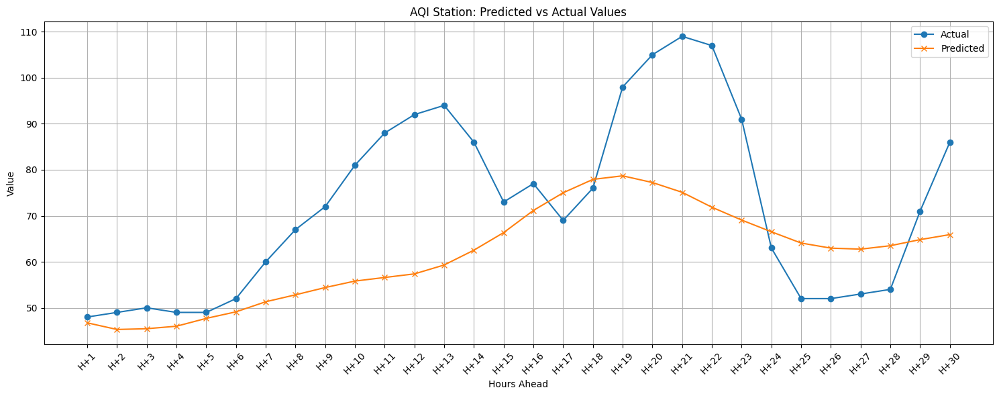

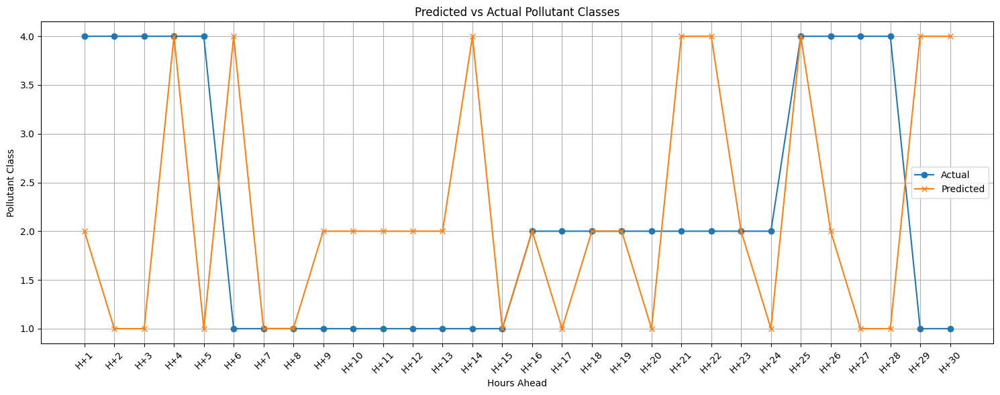


AQI Station 2 Metrics:

  Metrics for 1h:
    MAE: 1.2672080993652344
    RMSE: 1.2672080993652344
    MAPE: 2.6400168736775713
    sMAPE: 2.6753314748591155
    Correlation: nan
    DA: nan
    MASE: 0.11149320778290053

  Metrics for 2h:
    MAE: 2.4880447387695312
    RMSE: 2.771427199518458
    MAPE: 5.104581271710039
    sMAPE: 5.271102345652498
    Correlation: -1.0
    DA: 0.0
    MASE: 0.21890649939164541

  Metrics for 4h:
    MAE: 3.129953384399414
    RMSE: 3.354449721775148
    MAPE: 6.354757359238709
    sMAPE: 6.594505626745511
    Correlation: -0.801931129834598
    DA: 33.33333333333333
    MASE: 0.27538376941596315

  Metrics for 8h:
    MAE: 4.944279670715332
    RMSE: 6.43563766775709
    MAPE: 8.653890413770288
    sMAPE: 9.251911003102729
    Correlation: 0.9203019482133905
    DA: 57.14285714285714
    MASE: 0.435014265565354

  Metrics for 24h:
    MAE: 15.353726228078207
    RMSE: 19.7415216637677
    MAPE: 17.915089873645798
    sMAPE: 20.619122723365837
    C

In [ ]:
# Forecast for station 2
predictor_s2 = AirQualityPredictor(lookback=168, forecast_range=30, epochs=40, batch_size=32)
metrics_aqi_s2, pollutant_accuracy_s2 = predictor_s2.evaluate(station2, isIncludeCO = False)

# # Save model
predictor_s2.model.save('model_s2_2.h5')

# Print results
print("\nAQI Station 2 Metrics:")
for timeframe, metrics in metrics_aqi_s2.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

print(f"\nPollutant Classification Accuracy: {pollutant_accuracy_s2:.2f}%")

<ipython-input-112-0055156b9726>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = pd.to_datetime(df['date'])


Epoch 1/40
162/162 ━━━━━━━━━━━━━━━━━━━━ 10s 26ms/step - aqi_station_loss: 1609.3615 - loss: 1612.2689 - max_aqi_pollutant_loss: 2.9094 - val_aqi_station_loss: 2642.3323 - val_loss: 2638.6238 - val_max_aqi_pollutant_loss: 1.8709
Epoch 2/40
162/162 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - aqi_station_loss: 1341.2274 - loss: 1343.4022 - max_aqi_pollutant_loss: 2.1560 - val_aqi_station_loss: 2052.0867 - val_loss: 2050.6270 - val_max_aqi_pollutant_loss: 1.7209
Epoch 3/40
162/162 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - aqi_station_loss: 808.1530 - loss: 810.0185 - max_aqi_pollutant_loss: 1.8454 - val_aqi_station_loss: 1100.5780 - val_loss: 1099.6760 - val_max_aqi_pollutant_loss: 1.4385
Epoch 4/40
162/162 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - aqi_station_loss: 276.8483 - loss: 278.2602 - max_aqi_pollutant_loss: 1.4060 - val_aqi_station_loss: 702.0458 - val_loss: 701.1536 - val_max_aqi_pollutant_loss: 1.0199
Epoch 5/40
162/162 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - aqi_station_loss: 88.8609 - loss: 89.8845 

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


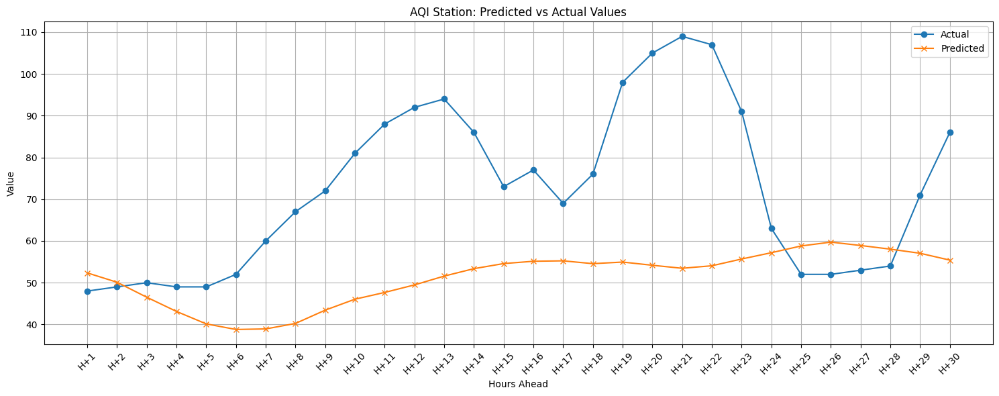

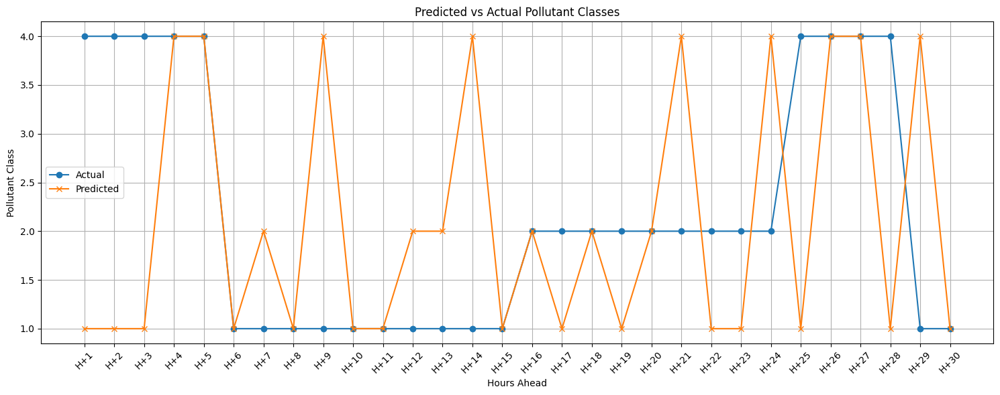


AQI Station 2 Metrics:

  Metrics for 1h:
    MAE: 4.352348327636719
    RMSE: 4.352348327636719
    MAPE: 9.067392349243164
    sMAPE: 8.67413349098099
    Correlation: nan
    DA: nan
    MASE: 0.3829341658089416

  Metrics for 2h:
    MAE: 2.7328834533691406
    RMSE: 3.176683561308136
    MAPE: 5.669837581868074
    sMAPE: 5.460444987370986
    Correlation: -1.0
    DA: 0.0
    MASE: 0.24044822856290504

  Metrics for 4h:
    MAE: 3.7052955627441406
    RMSE: 4.087534074342386
    MAPE: 7.572618377451995
    sMAPE: 7.721954258948399
    Correlation: -0.5864303212223639
    DA: 33.33333333333333
    MASE: 0.3260042989632312

  Metrics for 8h:
    MAE: 10.588311195373535
    RMSE: 13.598414884819507
    MAPE: 18.60088649359332
    sMAPE: 21.541618712311987
    Correlation: -0.5435523340555841
    DA: 42.857142857142854
    MASE: 0.9315950401257205

  Metrics for 24h:
    MAE: 26.046083609263103
    RMSE: 30.881485061304097
    MAPE: 31.222642873377122
    sMAPE: 38.774572680324496
 

In [ ]:
# Forecast for station 2
predictor_s2 = AirQualityPredictor(lookback=168, forecast_range=30, epochs=40, batch_size=32)
metrics_aqi_s2, pollutant_accuracy_s2 = predictor_s2.evaluate(station2, isIncludeCO = False)

# # Save model
predictor_s2.model.save('model_s2_3.h5')

# Print results
print("\nAQI Station 2 Metrics:")
for timeframe, metrics in metrics_aqi_s2.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

print(f"\nPollutant Classification Accuracy: {pollutant_accuracy_s2:.2f}%")

Epoch 1/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 9s 24ms/step - loss: 38.2508 - val_loss: 47.4722 - learning_rate: 0.0010
Epoch 2/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 32.6922 - val_loss: 37.2320 - learning_rate: 0.0010
Epoch 3/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 15.7977 - val_loss: 17.5217 - learning_rate: 0.0010
Epoch 4/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 7.9212 - val_loss: 17.1446 - learning_rate: 0.0010
Epoch 5/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 6s 25ms/step - loss: 7.4985 - val_loss: 17.8590 - learning_rate: 0.0010
Epoch 6/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 7.3377 - val_loss: 16.8889 - learning_rate: 0.0010
Epoch 7/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 7.1305 - val_loss: 16.6887 - learning_rate: 0.0010
Epoch 8/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 6.9358 - val_loss: 17.1830 - learning_rate: 0.0010
Epoch 9/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 6.6914 - val_loss: 18.1551 - learning_ra

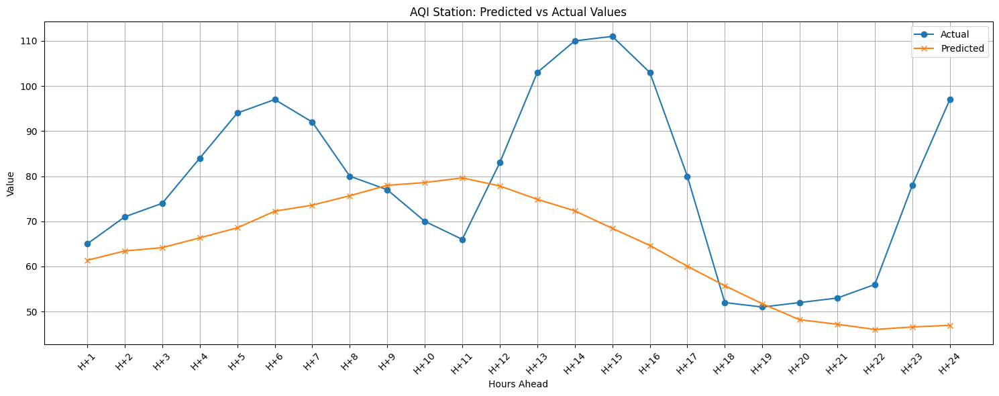


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 3.6225013732910156
    RMSE: 3.6225013732910156
    MAPE: 5.573079035832332
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 5.595451354980469
    RMSE: 5.93309425984462
    MAPE: 8.116399614162589
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 9.670713424682617
    RMSE: 10.94277110196258
    MAPE: 12.635677938506875
    Correlation: 0.9915313871694365
    DA: 100.0

  Metrics for 8h:
    MAE: 13.951654434204102
    RMSE: 16.188344268205935
    MAPE: 16.068152015089716
    Correlation: 0.7074021913243264
    DA: 71.42857142857143

  Metrics for 12h:
    MAE: 11.6654421488444
    RMSE: 14.094522977765111
    MAPE: 14.081131372083053
    Correlation: 0.07627567267697449
    DA: 45.45454545454545

  Metrics for 16h:
    MAE: 17.916773796081543
    RMSE: 22.184227183583612
    MAPE: 19.129983141510586
    Correlation: -0.04536927540218423
    DA: 40.0

  Metrics for 24h:
    MAE: 17.17220703760783
    RMSE: 22

In [ ]:
predictor_s2 = Cnn_Lstm_AirQualityPredictor(
    lookback=72,       # Look back 168 giờ (7 ngày)
    forecast_range=24,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=32,      # Số filters cho CNN
    lstm_units=64,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s2, y_pred_s2 = predictor_s2.evaluate(station2)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s2.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

In [ ]:
y_pred_s2

array([61.3775  , 63.4316  , 64.17002 , 66.33803 , 68.56412 , 72.24398 ,
       73.589485, 75.672035, 77.97828 , 78.59032 , 79.634415, 77.83094 ,
       74.87512 , 72.333145, 68.44878 , 64.65988 , 60.05949 , 55.729095,
       51.732285, 48.180523, 47.191483, 46.029617, 46.586765, 46.948914],
      dtype=float32)

Epoch 1/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - loss: 1618.9694 - val_loss: 2976.6912 - learning_rate: 0.0010
Epoch 2/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 1384.8040 - val_loss: 1934.1312 - learning_rate: 0.0010
Epoch 3/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 917.5850 - val_loss: 1457.5828 - learning_rate: 0.0010
Epoch 4/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 436.8498 - val_loss: 709.1280 - learning_rate: 0.0010
Epoch 5/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 177.8524 - val_loss: 547.5142 - learning_rate: 0.0010
Epoch 6/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 116.0329 - val_loss: 447.0415 - learning_rate: 0.0010
Epoch 7/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 98.3753 - val_loss: 427.4463 - learning_rate: 0.0010
Epoch 8/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 97.4905 - val_loss: 526.8950 - learning_rate: 0.0010
Epoch 9/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - loss: 94.4123 - val_lo

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


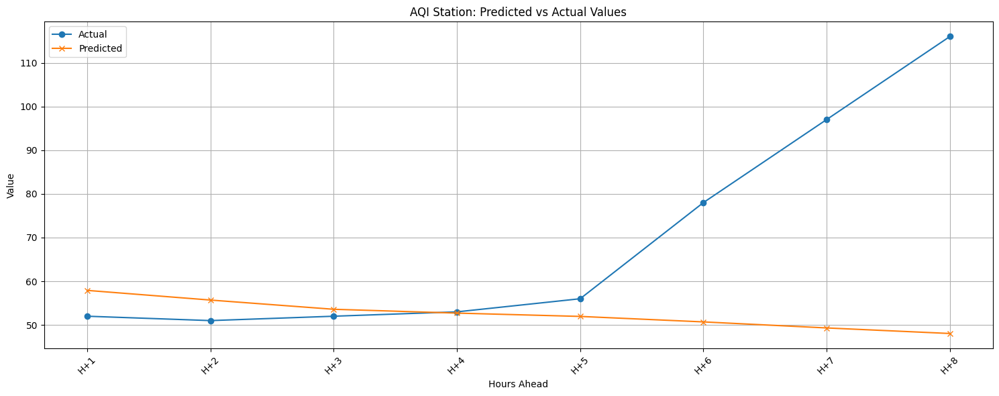


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 5.908058166503906
    RMSE: 5.908058166503906
    MAPE: 11.36165032019982
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 5.303581237792969
    RMSE: 5.337917787228781
    MAPE: 10.287790169003863
    Correlation: 0.9999999999999999
    DA: 100.0

  Metrics for 4h:
    MAE: 3.120781898498535
    RMSE: 3.8599065732089883
    MAPE: 6.043203563213064
    Correlation: -0.5251395256975822
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 19.93247079849243
    RMSE: 31.048614680991236
    MAPE: 21.766145696403477
    Correlation: -0.8381572462145244
    DA: 14.285714285714285

  Metrics for 12h:
    Error: Not enough data for this timeframe.

  Metrics for 16h:
    Error: Not enough data for this timeframe.

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 36h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
predictor_s2 = Cnn_Lstm_AirQualityPredictor(
    lookback=12,       # Look back 168 giờ (7 ngày)
    forecast_range=8,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=36,      # Số filters cho CNN
    lstm_units=64,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s2, y_pred_s2 = predictor_s2.evaluate(station2)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s2.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 9s 25ms/step - loss: 1601.5039 - val_loss: 2388.7439 - learning_rate: 0.0010
Epoch 2/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 1238.6171 - val_loss: 1681.5175 - learning_rate: 0.0010
Epoch 3/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 524.1011 - val_loss: 851.2869 - learning_rate: 0.0010
Epoch 4/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 158.8303 - val_loss: 734.1859 - learning_rate: 0.0010
Epoch 5/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 112.1637 - val_loss: 539.7556 - learning_rate: 0.0010
Epoch 6/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 105.0605 - val_loss: 612.8547 - learning_rate: 0.0010
Epoch 7/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 105.9777 - val_loss: 662.8513 - learning_rate: 0.0010
Epoch 8/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 100.8840 - val_loss: 598.3480 - learning_rate: 0.0010
Epoch 9/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 100.9795 - val_

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


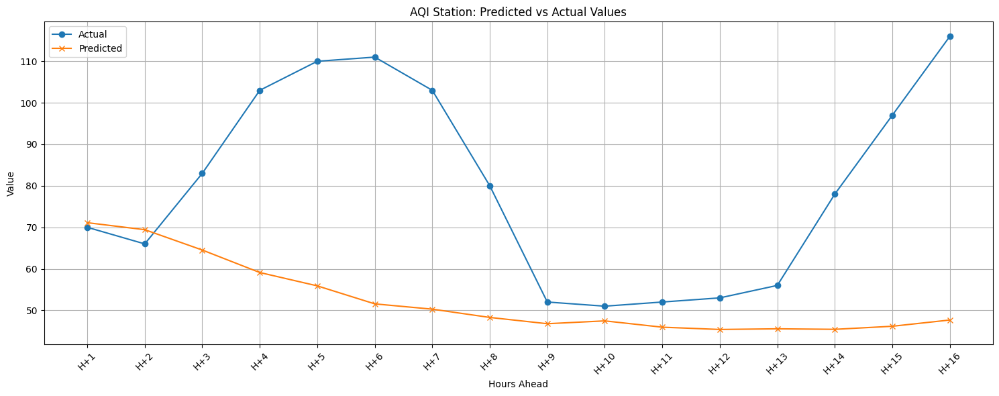


AQI Station 2 Metrics:

  Metrics for 1h:
    MAE: 1.1134185791015625
    RMSE: 1.1134185791015625
    MAPE: 1.5905979701450894
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 2.2704315185546875
    RMSE: 2.548242182860276
    MAPE: 3.3918478168966453
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 16.726611137390137
    RMSE: 23.878622691804985
    MAPE: 17.91366924195044
    Correlation: -0.9706579549128848
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 33.111648082733154
    RMSE: 39.57163364067187
    MAPE: 33.15304584230398
    Correlation: -0.6749599513685649
    DA: 42.857142857142854

  Metrics for 12h:
    MAE: 23.944830258687336
    RMSE: 32.483184955508285
    MAPE: 25.687066963373212
    Correlation: 0.2139609594871721
    DA: 36.36363636363637

  Metrics for 16h:
    MAE: 28.096213340759277
    RMSE: 36.30295805353535
    MAPE: 29.99961404923026
    Correlation: 0.11647409163354083
    DA: 46.666666666666664

  Metrics for 24h:
    Error

In [ ]:
predictor_s2 = Cnn_Lstm_AirQualityPredictor(
    lookback=32,       # Look back 168 giờ (7 ngày)
    forecast_range=16,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=32,      # Số filters cho CNN
    lstm_units=64,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s2, y_pred_s2 = predictor_s2.evaluate(station2)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print
print("\nAQI Station 2 Metrics:")
for timeframe, metrics in metrics_aqi_s2.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

3. Forecast for station 3

<ipython-input-95-e58cb7bc5d36>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = pd.to_datetime(df['date'])


Epoch 1/40
165/165 ━━━━━━━━━━━━━━━━━━━━ 12s 20ms/step - aqi_station_loss: 2365.7151 - loss: 2368.9158 - max_aqi_pollutant_loss: 3.2026 - val_aqi_station_loss: 3911.6035 - val_loss: 3910.9106 - val_max_aqi_pollutant_loss: 1.3060
Epoch 2/40
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - aqi_station_loss: 1996.9353 - loss: 1998.9437 - max_aqi_pollutant_loss: 2.0066 - val_aqi_station_loss: 3242.9055 - val_loss: 3242.1943 - val_max_aqi_pollutant_loss: 0.9872
Epoch 3/40
165/165 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - aqi_station_loss: 1368.3926 - loss: 1370.2772 - max_aqi_pollutant_loss: 1.8839 - val_aqi_station_loss: 2165.5708 - val_loss: 2164.9817 - val_max_aqi_pollutant_loss: 0.8915
Epoch 4/40
165/165 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - aqi_station_loss: 664.3983 - loss: 665.5436 - max_aqi_pollutant_loss: 1.1428 - val_aqi_station_loss: 1089.4678 - val_loss: 1089.5065 - val_max_aqi_pollutant_loss: 0.6861
Epoch 5/40
165/165 ━━━━━━━━━━━━━━━━━━━━ 6s 24ms/step - aqi_station_loss: 282.0741 - loss: 282

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


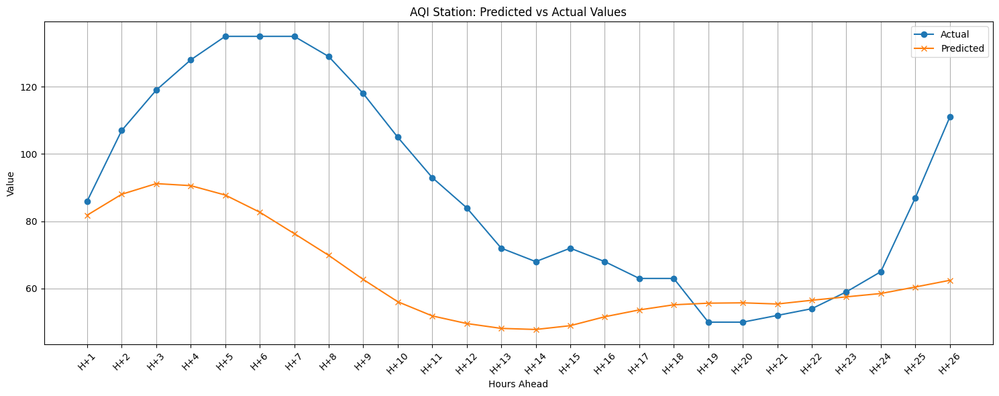

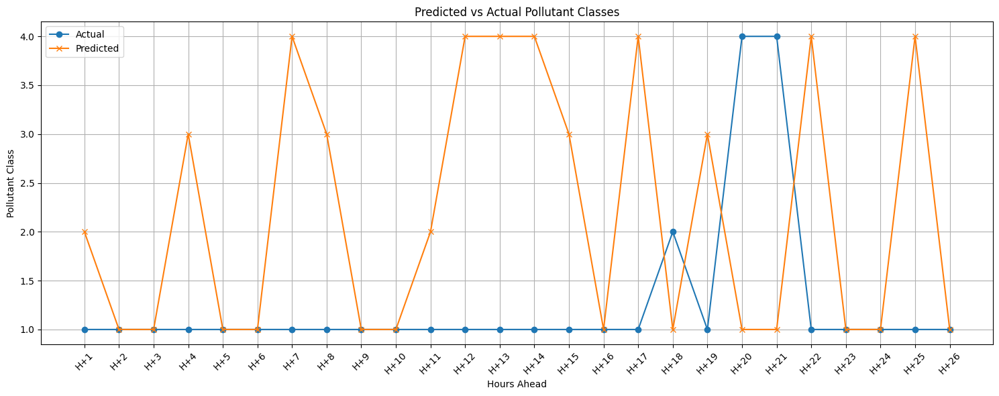


AQI Station 3 Metrics:

  Metrics for 1h:
    MAE: 4.182487487792969
    RMSE: 4.182487562381107
    MAPE: 4.8633575439453125
    sMAPE: 4.984566181659658
    Correlation: nan
    DA: nan
    MASE: 0.25104120312866046

  Metrics for 2h:
    MAE: 11.57516098022461
    RMSE: 13.734481099383986
    MAPE: 11.295152824615764
    sMAPE: 12.217773458723496
    Correlation: 1.0
    DA: 100.0
    MASE: 0.6947641439130465

  Metrics for 4h:
    MAE: 22.085609436035156
    RMSE: 25.24048397416341
    MAPE: 18.791024931413553
    sMAPE: 21.273958490887296
    Correlation: 0.957889741183068
    DA: 66.66666666666666
    MASE: 1.3256221281794323

  Metrics for 8h:
    MAE: 38.201263427734375
    RMSE: 42.494861247236415
    MAPE: 29.767553154338948
    sMAPE: 36.308352801175765
    Correlation: -0.14355666135066364
    DA: 42.857142857142854
    MASE: 2.2929157920367063

  Metrics for 24h:
    MAE: 25.47193717956543
    RMSE: 32.16320950866747
    MAPE: 25.395015440865937
    sMAPE: 30.650216023514

In [ ]:
# Forecast for station 3
predictor_s3 = AirQualityPredictor(lookback=24, forecast_range=26, epochs=40, batch_size=32)
metrics_aqi_s3, pollutant_accuracy_s3 = predictor_s3.evaluate(station3)

# # Save model
predictor_s3.model.save('Model_s3.h5')

# Print results
print("\nAQI Station 3 Metrics:")
for timeframe, metrics in metrics_aqi_s3.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

print(f"\nPollutant Classification Accuracy: {pollutant_accuracy_s3:.2f}%")

Epoch 1/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 2301.2378 - val_loss: 3324.5000 - learning_rate: 0.0010
Epoch 2/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 8s 20ms/step - loss: 1807.8882 - val_loss: 2484.6284 - learning_rate: 0.0010
Epoch 3/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 980.5806 - val_loss: 1509.1842 - learning_rate: 0.0010
Epoch 4/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 390.1480 - val_loss: 1025.8055 - learning_rate: 0.0010
Epoch 5/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 219.6530 - val_loss: 1096.3129 - learning_rate: 0.0010
Epoch 6/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - loss: 201.1324 - val_loss: 1053.6772 - learning_rate: 0.0010
Epoch 7/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 187.6939 - val_loss: 1114.9626 - learning_rate: 0.0010
Epoch 8/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 181.1229 - val_loss: 983.3412 - learning_rate: 0.0010
Epoch 9/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - loss: 177.3948 

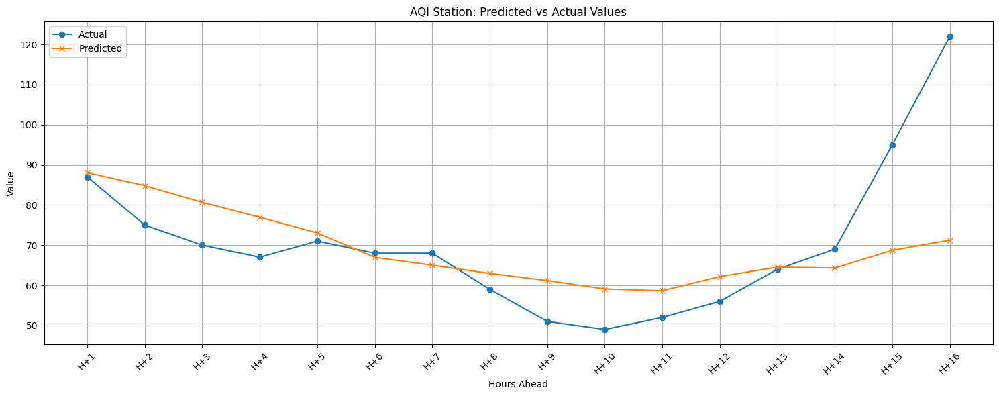


AQI Station 3 Metrics:

  Metrics for 1h:
    MAE: 1.04461669921875
    RMSE: 1.044616711700377
    MAPE: 1.2007088496767242
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 5.437385559082031
    RMSE: 6.990105857211287
    MAPE: 7.153790704135236
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 7.873817443847656
    RMSE: 8.811551956152591
    MAPE: 11.100602475521045
    Correlation: 0.9402102389294338
    DA: 100.0

  Metrics for 8h:
    MAE: 5.191384315490723
    RMSE: 6.523859981173345
    MAPE: 7.4904666849177985
    Correlation: 0.8219187297057122
    DA: 71.42857142857143

  Metrics for 12h:
    MAE: 6.218751430511475
    RMSE: 7.235586637533809
    MAPE: 10.357400289746863
    Correlation: 0.9030824771298936
    DA: 72.72727272727273

  Metrics for 16h:
    MAE: 9.805606842041016
    RMSE: 15.649393068677416
    MAPE: 12.574140709846244
    Correlation: 0.49022333769013315
    DA: 73.33333333333333

  Metrics for 24h:
    Error: Not enough data for t

In [ ]:
predictor_s3 = Cnn_Lstm_AirQualityPredictor(
    lookback=32,       # Look back 168 giờ (7 ngày)
    forecast_range=16,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=32,      # Số filters cho CNN
    lstm_units=50,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s3, y_pred_s3 = predictor_s3.evaluate(station3)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print
print("\nAQI Station 3 Metrics:")
for timeframe, metrics in metrics_aqi_s3.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 44.3295 - val_loss: 54.7563 - learning_rate: 0.0010
Epoch 2/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 38.4122 - val_loss: 39.6674 - learning_rate: 0.0010
Epoch 3/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 20.8965 - val_loss: 27.2724 - learning_rate: 0.0010
Epoch 4/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 11.2987 - val_loss: 24.3504 - learning_rate: 0.0010
Epoch 5/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 10.8959 - val_loss: 24.2387 - learning_rate: 0.0010
Epoch 6/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 10.4370 - val_loss: 23.0457 - learning_rate: 0.0010
Epoch 7/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 10.1614 - val_loss: 23.1818 - learning_rate: 0.0010
Epoch 8/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 9.8413 - val_loss: 24.1619 - learning_rate: 0.0010
Epoch 9/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 9.8044 - val_loss: 23.5887 - learni

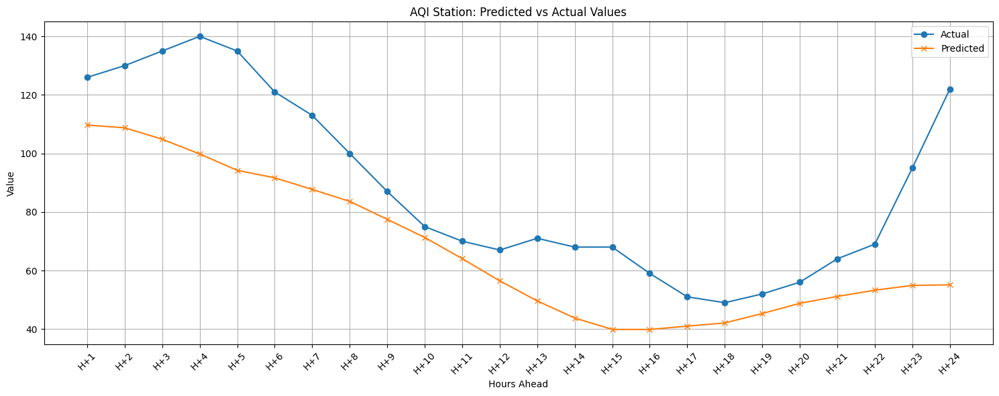


AQI Station 3 Metrics:

  Metrics for 1h:
    MAE: 16.292213439941406
    RMSE: 16.292213424262485
    MAPE: 12.930328126937624
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 18.76785659790039
    RMSE: 18.93043230065927
    MAPE: 14.635740892645494
    Correlation: -1.0
    DA: 0.0

  Metrics for 4h:
    MAE: 26.965721130371094
    RMSE: 28.46091283796626
    MAPE: 20.075651086536325
    Correlation: -0.9758125302423679
    DA: 0.0

  Metrics for 8h:
    MAE: 27.45553970336914
    RMSE: 28.877271158313786
    MAPE: 21.688994761822872
    Correlation: 0.6951546541800343
    DA: 57.14285714285714

  Metrics for 12h:
    MAE: 20.77914047241211
    RMSE: 24.016964320981796
    MAPE: 17.80114174991009
    Correlation: 0.9358228299579463
    DA: 72.72727272727273

  Metrics for 16h:
    MAE: 21.391311645507812
    RMSE: 23.881156407252483
    MAPE: 22.075891977923575
    Correlation: 0.9371949430424282
    DA: 66.66666666666666

  Metrics for 24h:
    MAE: 21.195459365844727


In [ ]:
predictor_s3 = Cnn_Lstm_AirQualityPredictor(
    lookback=72,       # Look back 168 giờ (7 ngày)
    forecast_range=24,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=32,      # Số filters cho CNN
    lstm_units=50,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s3, y_pred_s3 = predictor_s3.evaluate(station3)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print
print("\nAQI Station 3 Metrics:")
for timeframe, metrics in metrics_aqi_s3.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

In [ ]:
y_pred_s3

array([109.70779 , 108.7565  , 104.85719 ,  99.815636,  94.226715,
        91.66219 ,  87.7093  ,  83.62035 ,  77.48934 ,  71.28721 ,
        64.05432 ,  56.463757,  49.608555,  43.75674 ,  39.87215 ,
        39.85129 ,  40.98952 ,  42.077972,  45.30523 ,  48.790344,
        51.13441 ,  53.27571 ,  54.897907,  55.098843], dtype=float32)

4. Forecast for station 4

<ipython-input-95-e58cb7bc5d36>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = pd.to_datetime(df['date'])


Epoch 1/40
165/165 ━━━━━━━━━━━━━━━━━━━━ 10s 22ms/step - aqi_station_loss: 2138.9839 - loss: 2141.7856 - max_aqi_pollutant_loss: 2.8055 - val_aqi_station_loss: 3877.0969 - val_loss: 3870.1467 - val_max_aqi_pollutant_loss: 0.8940
Epoch 2/40
165/165 ━━━━━━━━━━━━━━━━━━━━ 5s 23ms/step - aqi_station_loss: 1781.9464 - loss: 1783.5667 - max_aqi_pollutant_loss: 1.6143 - val_aqi_station_loss: 2878.1091 - val_loss: 2875.8889 - val_max_aqi_pollutant_loss: 0.7204
Epoch 3/40
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - aqi_station_loss: 1138.4031 - loss: 1139.7964 - max_aqi_pollutant_loss: 1.3609 - val_aqi_station_loss: 1393.2003 - val_loss: 1395.2114 - val_max_aqi_pollutant_loss: 0.5572
Epoch 4/40
165/165 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - aqi_station_loss: 471.6280 - loss: 472.5430 - max_aqi_pollutant_loss: 0.9001 - val_aqi_station_loss: 654.3560 - val_loss: 655.1103 - val_max_aqi_pollutant_loss: 0.5215
Epoch 5/40
165/165 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - aqi_station_loss: 171.3881 - loss: 172.0

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


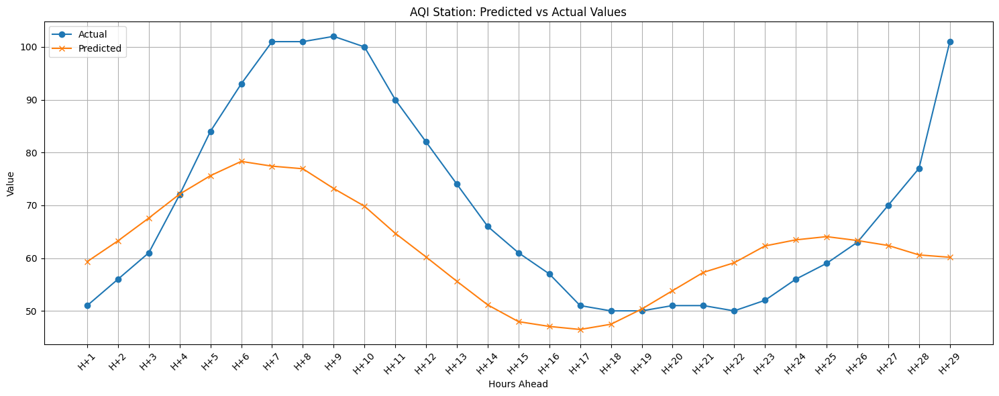

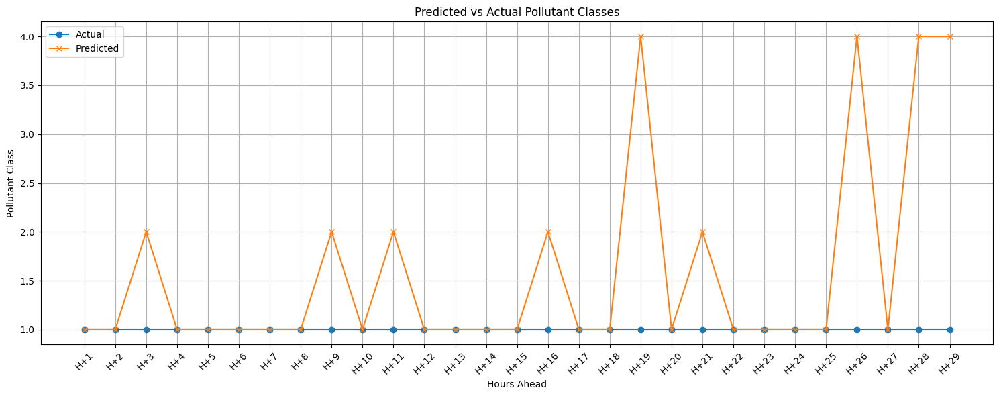


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 8.331977844238281
    RMSE: 8.331977683108398
    MAPE: 16.33721145929075
    sMAPE: 15.103468653486829
    Correlation: nan
    DA: nan
    MASE: 0.5838548343329037

  Metrics for 2h:
    MAE: 7.798789978027344
    RMSE: 7.816995288743513
    MAPE: 14.655750472338594
    sMAPE: 13.643685386533988
    Correlation: 1.0
    DA: 100.0
    MASE: 0.5464922393867141

  Metrics for 4h:
    MAE: 5.573247909545898
    RMSE: 6.433301723316918
    MAPE: 10.064810130807498
    sMAPE: 9.420652266735393
    Correlation: 0.9826388200428717
    DA: 100.0
    MASE: 0.39053965285977116

  Metrics for 8h:
    MAE: 11.62944221496582
    RMSE: 14.088225167809686
    MAPE: 14.154145474934682
    sMAPE: 14.85618996864107
    Correlation: 0.9476784538209913
    DA: 71.42857142857143
    MASE: 0.8149212809655145

  Metrics for 24h:
    MAE: 12.448516845703125
    RMSE: 15.26401963475402
    MAPE: 16.51748036705557
    sMAPE: 17.786220564818127
    Correlation

In [ ]:
# Forecast for station 4
predictor_s4 = AirQualityPredictor(lookback=48, forecast_range=29, epochs=40, batch_size=32)
metrics_aqi_s4, pollutant_accuracy_s4 = predictor_s4.evaluate(station4)

# # Save model
predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

print(f"\nPollutant Classification Accuracy: {pollutant_accuracy_s4:.2f}%")

<ipython-input-95-e58cb7bc5d36>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = pd.to_datetime(df['date'])


Epoch 1/40
162/162 ━━━━━━━━━━━━━━━━━━━━ 15s 51ms/step - aqi_station_loss: 2147.7222 - loss: 2150.3406 - max_aqi_pollutant_loss: 2.6379 - val_aqi_station_loss: 3987.8650 - val_loss: 3986.2881 - val_max_aqi_pollutant_loss: 1.0744
Epoch 2/40
162/162 ━━━━━━━━━━━━━━━━━━━━ 7s 31ms/step - aqi_station_loss: 1741.7251 - loss: 1743.2487 - max_aqi_pollutant_loss: 1.5040 - val_aqi_station_loss: 2990.4380 - val_loss: 2993.4473 - val_max_aqi_pollutant_loss: 1.3572
Epoch 3/40
162/162 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - aqi_station_loss: 1152.3955 - loss: 1153.8643 - max_aqi_pollutant_loss: 1.4553 - val_aqi_station_loss: 1487.9269 - val_loss: 1490.5469 - val_max_aqi_pollutant_loss: 0.8377
Epoch 4/40
162/162 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - aqi_station_loss: 496.9246 - loss: 497.8337 - max_aqi_pollutant_loss: 0.9036 - val_aqi_station_loss: 846.4265 - val_loss: 846.2312 - val_max_aqi_pollutant_loss: 0.7077
Epoch 5/40
162/162 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - aqi_station_loss: 167.7827 - loss: 168.4

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


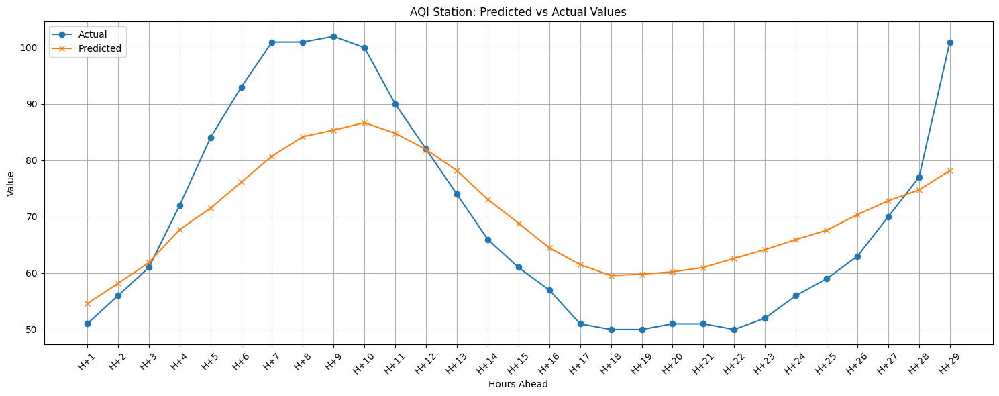

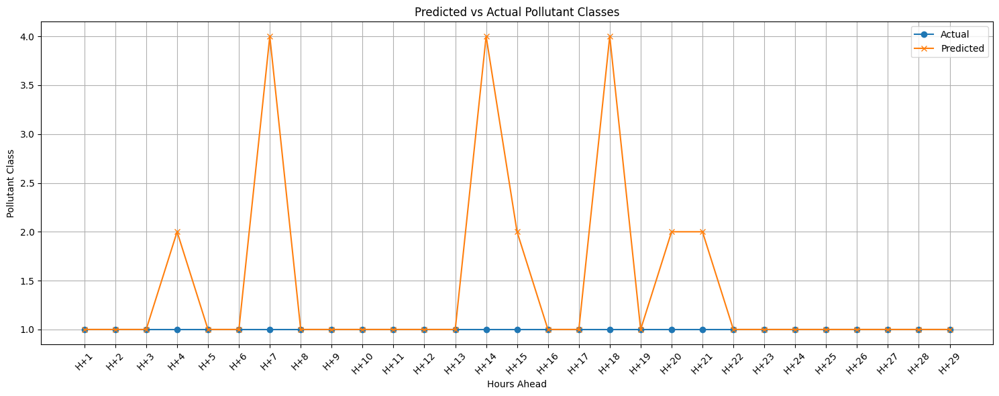


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 3.5762405395507812
    RMSE: 3.5762405430583057
    MAPE: 7.012236352060356
    sMAPE: 6.774707114544501
    Correlation: nan
    DA: nan
    MASE: 0.25074770585093603

  Metrics for 2h:
    MAE: 2.87457275390625
    RMSE: 2.9589705161597895
    MAPE: 5.446211897692427
    sMAPE: 5.290523988878376
    Correlation: 1.0
    DA: 100.0
    MASE: 0.20155034745904973

  Metrics for 4h:
    MAE: 2.72091007232666
    RMSE: 3.0205259670990947
    MAPE: 4.560018003245103
    sMAPE: 4.525001187016272
    Correlation: 0.9962508099140053
    DA: 100.0
    MASE: 0.1907763057090994

  Metrics for 8h:
    MAE: 9.660696029663086
    RMSE: 12.087839974294027
    MAPE: 10.990787360747367
    sMAPE: 11.816315263553653
    Correlation: 0.9910514300788281
    DA: 85.71428571428571
    MASE: 0.6773585892798262

  Metrics for 24h:
    MAE: 9.289117813110352
    RMSE: 10.653903199360677
    MAPE: 13.71703744989957
    sMAPE: 13.365908316367351
    Correlation

In [ ]:
# Forecast for station 4
predictor_s4 = AirQualityPredictor(lookback=168, forecast_range=29, epochs=100, batch_size=32)
metrics_aqi_s4, pollutant_accuracy_s4 = predictor_s4.evaluate(station4)

# # Save model
predictor_s4.model.save('Model_s4_3.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

print(f"\nPollutant Classification Accuracy: {pollutant_accuracy_s4:.2f}%")

Epoch 1/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 11s 30ms/step - loss: 2192.6050 - val_loss: 4324.5796 - learning_rate: 5.0000e-04
Epoch 2/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - loss: 2088.0500 - val_loss: 3733.9822 - learning_rate: 5.0000e-04
Epoch 3/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 36ms/step - loss: 1873.2439 - val_loss: 3226.7219 - learning_rate: 5.0000e-04
Epoch 4/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 1700.1569 - val_loss: 3010.4736 - learning_rate: 5.0000e-04
Epoch 5/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - loss: 1398.4476 - val_loss: 2591.9241 - learning_rate: 5.0000e-04
Epoch 6/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 1126.9878 - val_loss: 2161.3403 - learning_rate: 5.0000e-04
Epoch 7/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 806.1715 - val_loss: 2169.8704 - learning_rate: 5.0000e-04
Epoch 8/100
151/151 ━━━━━━━━━━━━━━━━━━━━ 9s 26ms/step - loss: 585.9813 - val_loss: 1799.8522 - learning_rate: 5.0000e-04
Epoch 9/100
151/151 ━━━━━

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


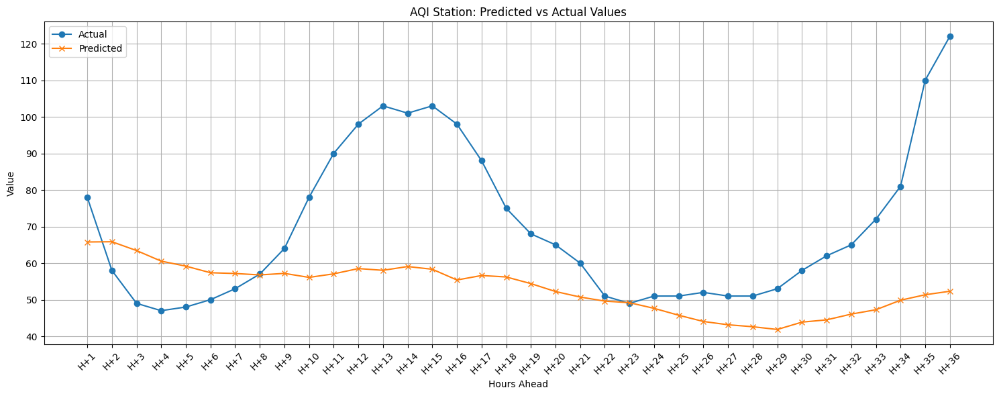


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 12.219032287597656
    RMSE: 12.21903222580071
    MAPE: 15.665426009740585
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 10.033271789550781
    RMSE: 10.26859736268177
    MAPE: 14.597808945821935
    Correlation: -1.0
    DA: 0.0

  Metrics for 4h:
    MAE: 12.01154899597168
    RMSE: 12.275151803812474
    MAPE: 21.86827338609189
    Correlation: 0.7396606390688192
    DA: 66.66666666666666

  Metrics for 8h:
    MAE: 8.873259544372559
    RMSE: 9.996224262776359
    MAPE: 16.71968316311318
    Correlation: 0.53252840664088
    DA: 28.57142857142857

  Metrics for 12h:
    MAE: 14.343040466308594
    RMSE: 18.18726173061279
    MAPE: 20.779973907996194
    Correlation: -0.1344329203910128
    DA: 45.45454545454545

  Metrics for 24h:
    MAE: 18.21038818359375
    RMSE: 23.58159480971402
    MAPE: 22.787310056329922
    Correlation: 0.17956905228039313
    DA: 52.17391304347826

  Metrics for 36h:
    MAE: 19.7899608

In [ ]:
# New Test for new feature
# lookback=168, forecast_range=48
predictor_s4 = Cnn_Lstm_AirQualityPredictor(
    lookback=144,       # Look back 168 giờ (7 ngày)
    forecast_range=36,  # Dự báo 48 giờ tiếp theo
    epochs=100,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=32,      # Số filters cho CNN
    lstm_units=64,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.0005  # Tốc độ học
)
metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 12s 31ms/step - loss: 44.2711 - val_loss: 63.8249 - learning_rate: 5.0000e-04
Epoch 2/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 42.8701 - val_loss: 52.4924 - learning_rate: 5.0000e-04
Epoch 3/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 6s 36ms/step - loss: 37.2565 - val_loss: 38.9132 - learning_rate: 5.0000e-04
Epoch 4/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 28.1831 - val_loss: 39.2200 - learning_rate: 5.0000e-04
Epoch 5/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 4s 28ms/step - loss: 17.1668 - val_loss: 23.1103 - learning_rate: 5.0000e-04
Epoch 6/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - loss: 11.3386 - val_loss: 22.8234 - learning_rate: 5.0000e-04
Epoch 7/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 10.4645 - val_loss: 21.4124 - learning_rate: 5.0000e-04
Epoch 8/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 6s 35ms/step - loss: 10.1771 - val_loss: 20.7998 - learning_rate: 5.0000e-04
Epoch 9/100
162/162 ━━━━━━━━━━━━━━━━━━━━ 9s 28ms/step -

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


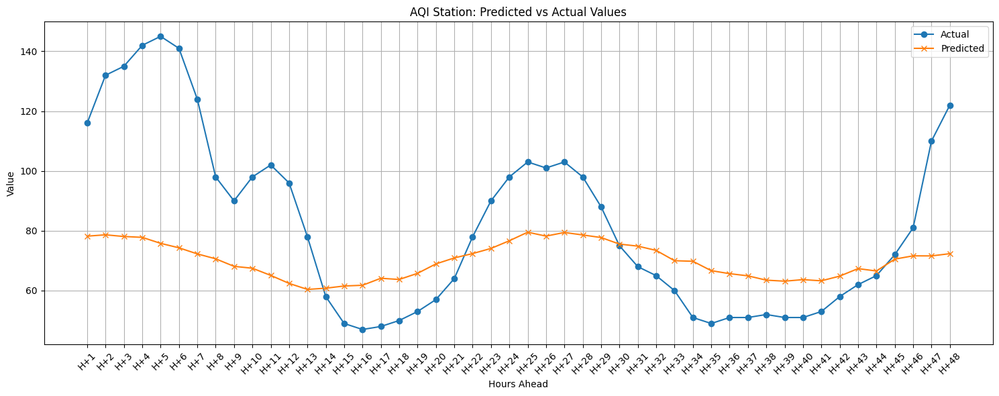


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 37.796722412109375
    RMSE: 37.79672320659888
    MAPE: 32.58338138974946
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 45.57386016845703
    RMSE: 46.2326799283729
    MAPE: 36.50040203002802
    Correlation: 0.9999999999999998
    DA: 100.0

  Metrics for 4h:
    MAE: 53.06508255004883
    RMSE: 53.93422055137513
    MAPE: 40.09239418074487
    Correlation: -0.38098312150553193
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 53.40818405151367
    RMSE: 55.11202414245121
    MAPE: 40.63120311686994
    Correlation: 0.5241731611970084
    DA: 57.14285714285714

  Metrics for 12h:
    MAE: 45.84939193725586
    RMSE: 48.47771012440924
    MAPE: 37.64234569837932
    Correlation: 0.8045485996744123
    DA: 54.54545454545454

  Metrics for 24h:
    MAE: 29.25971031188965
    RMSE: 35.61109069199422
    MAPE: 29.151548918545732
    Correlation: 0.765199633631837
    DA: 60.86956521739131

  Metrics for 36h:
    MAE: 

In [ ]:
# New Test for new feature
# lookback=144, forecast_range=48
predictor_s4 = Cnn_Lstm_AirQualityPredictor(
    lookback=144,       # Look back 168 giờ (7 ngày)
    forecast_range=48,  # Dự báo 48 giờ tiếp theo
    epochs=100,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=32,      # Số filters cho CNN
    lstm_units=50,      # Số units cho LSTM
    dropout_rate=0.25,   # Tỉ lệ dropout
    learning_rate=0.0005  # Tốc độ học
)
metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 8s 21ms/step - loss: 44.1828 - val_loss: 55.2046
Epoch 2/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - loss: 35.5098 - val_loss: 39.6918
Epoch 3/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 15.8660 - val_loss: 21.3742
Epoch 4/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 10.5999 - val_loss: 22.3562
Epoch 5/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - loss: 10.0580 - val_loss: 23.0666
Epoch 6/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 9.6374 - val_loss: 21.1732
Epoch 7/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 9.2595 - val_loss: 21.2156
Epoch 8/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 8.9210 - val_loss: 21.7301
Epoch 9/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 8.8715 - val_loss: 20.5477
Epoch 10/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 18ms/step - loss: 8.5636 - val_loss: 21.4258
Epoch 11/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 8.5821 - val_loss: 20.8239
Epoch 12/50
164/164 ━━━━━

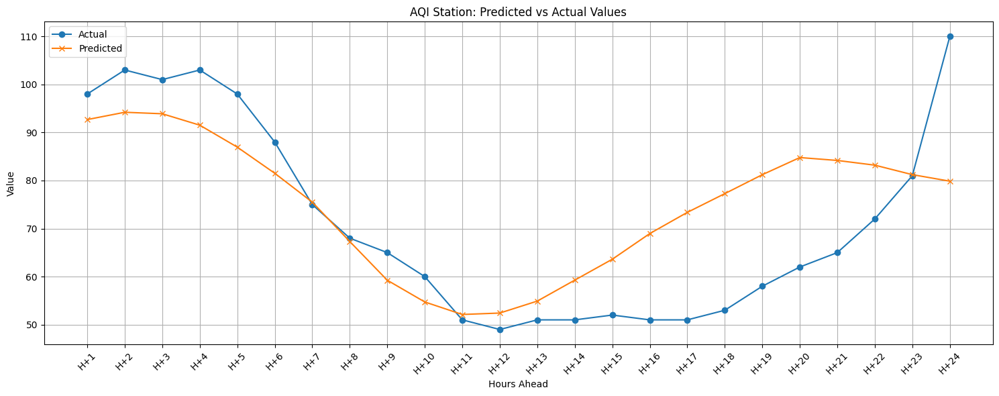


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 5.31689453125
    RMSE: 5.316894508829151
    MAPE: 5.425402582908164
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 7.056587219238281
    RMSE: 7.267871271550166
    MAPE: 6.98274008136989
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 8.176029205322266
    RMSE: 8.4856239369084
    MAPE: 8.037899173821684
    Correlation: 0.036633607451494084
    DA: 66.66666666666666

  Metrics for 8h:
    MAE: 6.43073844909668
    RMSE: 7.525706676872819
    MAPE: 6.562205391388283
    Correlation: 0.9768320875114971
    DA: 85.71428571428571

  Metrics for 24h:
    MAE: 10.922148704528809
    RMSE: 13.869586060170244
    MAPE: 16.662111279152924
    Correlation: 0.7543526517061524
    DA: 60.86956521739131

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# New Test for new feature
# lookback=72, forecast_range=24
predictor_s4 = Cnn_Lstm_AirQualityPredictor(lookback=72, forecast_range=24, epochs=50, batch_size=32)
metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/100
81/81 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 44.2359 - val_loss: 64.3079 - learning_rate: 0.0010
Epoch 2/100
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 43.5125 - val_loss: 51.5405 - learning_rate: 0.0010
Epoch 3/100
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 26ms/step - loss: 39.6602 - val_loss: 41.5786 - learning_rate: 0.0010
Epoch 4/100
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 33.2553 - val_loss: 37.4775 - learning_rate: 0.0010
Epoch 5/100
81/81 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 24.6220 - val_loss: 29.6572 - learning_rate: 0.0010
Epoch 6/100
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - loss: 15.6177 - val_loss: 26.7740 - learning_rate: 0.0010
Epoch 7/100
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 25ms/step - loss: 11.7191 - val_loss: 26.9217 - learning_rate: 0.0010
Epoch 8/100
81/81 ━━━━━━━━━━━━━━━━━━━━ 2s 27ms/step - loss: 10.8892 - val_loss: 28.5850 - learning_rate: 0.0010
Epoch 9/100
81/81 ━━━━━━━━━━━━━━━━━━━━ 3s 38ms/step - loss: 10.5603 - val_loss: 22.1189 - learning_rate:

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


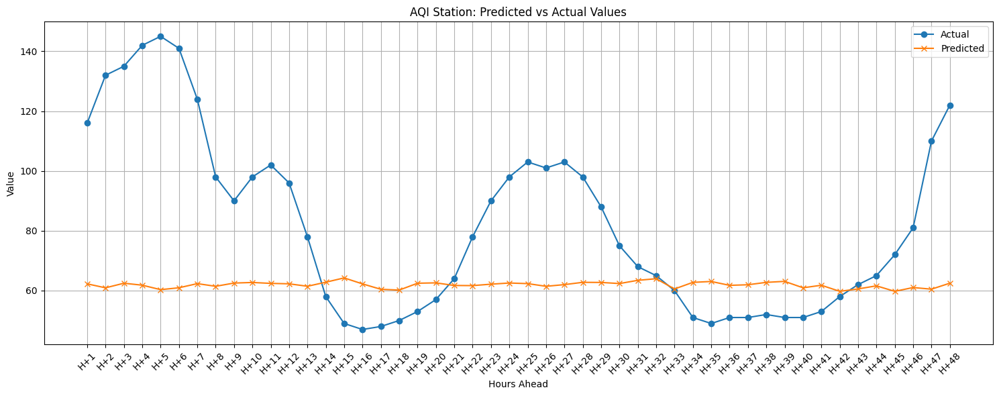


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 53.745216369628906
    RMSE: 53.74521690200673
    MAPE: 46.3320830772663
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 62.41099166870117
    RMSE: 63.00974162034392
    MAPE: 50.089060774417504
    Correlation: -1.0
    DA: 0.0

  Metrics for 4h:
    MAE: 69.38738250732422
    RMSE: 70.05814409965126
    MAPE: 52.595378277004976
    Correlation: -0.22184013363423313
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 67.56651306152344
    RMSE: 69.24086836227937
    MAPE: 51.57647664508058
    Correlation: -0.3398440801331288
    DA: 28.57142857142857

  Metrics for 12h:
    MAE: 56.3856315612793
    RMSE: 59.90289994545339
    MAPE: 46.09255611678387
    Correlation: -0.6209293418705981
    DA: 36.36363636363637

  Metrics for 24h:
    MAE: 35.336185455322266
    RMSE: 44.020179975974514
    MAPE: 33.821301860248276
    Correlation: -0.22102473900490177
    DA: 43.47826086956522

  Metrics for 36h:
    MAE: 30.14333

In [ ]:
# New Test for new feature
# lookback=48, forecast_range=24
predictor_s4 = Cnn_Lstm_AirQualityPredictor(
    lookback=144,       # Look back 168 giờ (7 ngày)
    forecast_range=48,  # Dự báo 48 giờ tiếp theo
    epochs=100,       # Số epochs huấn luyện
    batch_size=64,       # Kích thước batch
    cnn_filters=32,      # Số filters cho CNN
    lstm_units=50,      # Số units cho LSTM
    dropout_rate=0.3,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 10s 24ms/step - loss: 44.3383 - val_loss: 62.8897 - learning_rate: 5.0000e-04
Epoch 2/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 42.5877 - val_loss: 48.4522 - learning_rate: 5.0000e-04
Epoch 3/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 5s 27ms/step - loss: 36.8741 - val_loss: 48.1929 - learning_rate: 5.0000e-04
Epoch 4/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 28.0683 - val_loss: 33.1662 - learning_rate: 5.0000e-04
Epoch 5/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 5s 20ms/step - loss: 17.1647 - val_loss: 23.3247 - learning_rate: 5.0000e-04
Epoch 6/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 7s 30ms/step - loss: 11.1781 - val_loss: 24.5354 - learning_rate: 5.0000e-04
Epoch 7/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 10.1462 - val_loss: 20.0875 - learning_rate: 5.0000e-04
Epoch 8/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 9.6566 - val_loss: 20.5492 - learning_rate: 5.0000e-04
Epoch 9/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - 

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


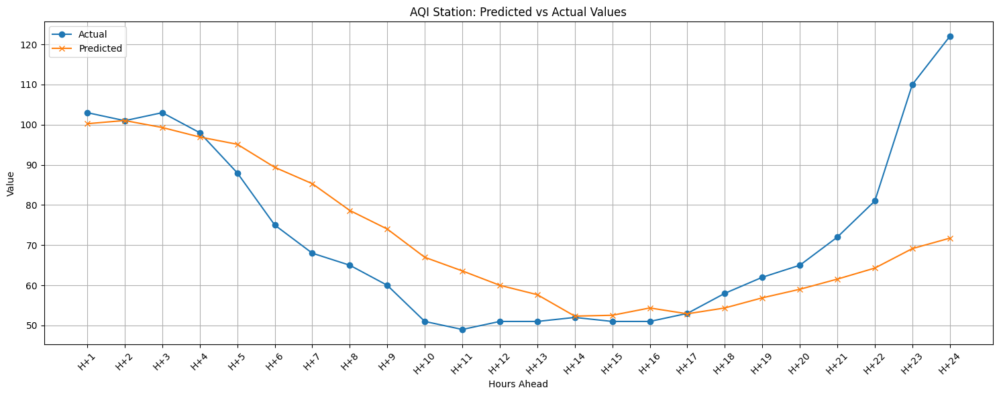


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 2.7456130981445312
    RMSE: 2.7456130669271754
    MAPE: 2.665643784606341
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 1.3904037475585938
    RMSE: 1.9416011351740425
    MAPE: 1.3502448611015152
    Correlation: -1.0
    DA: 0.0

  Metrics for 4h:
    MAE: 1.8881492614746094
    RMSE: 2.3662001561931953
    MAPE: 1.8465557963894133
    Correlation: 0.707545592563502
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 7.50093936920166
    RMSE: 9.782541987979506
    MAPE: 10.137042956760546
    Correlation: 0.9672093031101631
    DA: 71.42857142857143

  Metrics for 12h:
    MAE: 9.46530532836914
    RMSE: 11.220917813709859
    MAPE: 15.266260032510049
    Correlation: 0.9663396081849608
    DA: 72.72727272727273

  Metrics for 24h:
    MAE: 10.775135040283203
    RMSE: 16.109553072488154
    MAPE: 14.32994286734468
    Correlation: 0.691206750326367
    DA: 65.21739130434783

  Metrics for 36h:
    Error: Not eno

In [ ]:
# New Test for new feature
# lookback=48, forecast_range=24
predictor_s4 =  Cnn_Lstm_AirQualityPredictor(
    lookback=72,       # Look back 168 giờ (7 ngày)
    forecast_range=24,  # Dự báo 48 giờ tiếp theo
    epochs=100,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=64,      # Số filters cho CNN
    lstm_units=64,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 19s 52ms/step - loss: 42.9718 - val_loss: 57.8391 - learning_rate: 0.0010
Epoch 2/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 34ms/step - loss: 36.8347 - val_loss: 44.5614 - learning_rate: 0.0010
Epoch 3/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 19.1172 - val_loss: 22.0197 - learning_rate: 0.0010
Epoch 4/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 8s 22ms/step - loss: 10.1241 - val_loss: 25.0478 - learning_rate: 0.0010
Epoch 5/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 9.8343 - val_loss: 24.1220 - learning_rate: 0.0010
Epoch 6/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 9.4330 - val_loss: 24.4893 - learning_rate: 0.0010
Epoch 7/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 22ms/step - loss: 9.3398 - val_loss: 24.4532 - learning_rate: 0.0010
Epoch 8/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 9.1458 - val_loss: 20.9747 - learning_rate: 0.0010
Epoch 9/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 8.7406 - val_loss: 19.5702 - learning

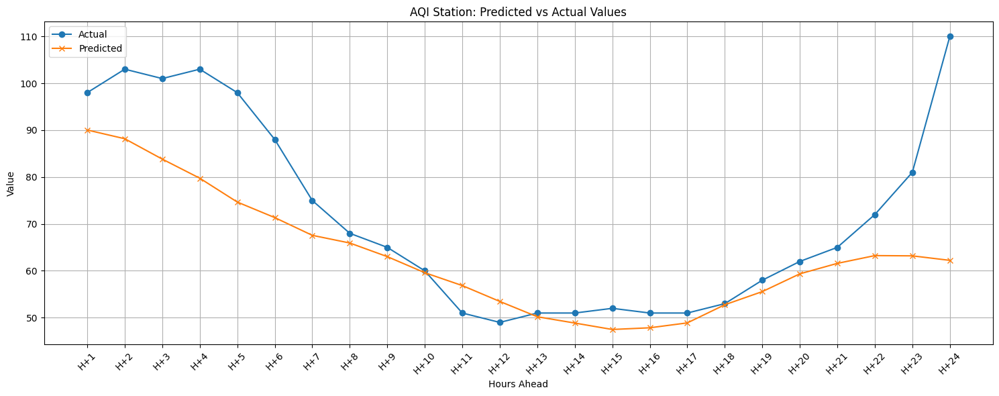


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 7.971710205078125
    RMSE: 7.971710253620348
    MAPE: 8.134398168447065
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 11.40274429321289
    RMSE: 11.907752555493063
    MAPE: 11.26806237613987
    Correlation: -0.9999999999999998
    DA: 0.0

  Metrics for 4h:
    MAE: 15.808305740356445
    RMSE: 16.727492968047954
    MAPE: 15.529145633886909
    Correlation: -0.6039920775020963
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 14.089813232421875
    RMSE: 15.813274862128793
    MAPE: 14.724916971705607
    Correlation: 0.837074624806797
    DA: 71.42857142857143

  Metrics for 12h:
    MAE: 10.451635360717773
    RMSE: 13.098319701545929
    MAPE: 11.842460971195152
    Correlation: 0.943314811359312
    DA: 81.81818181818183

  Metrics for 16h:
    MAE: 8.500716209411621
    RMSE: 11.440722735856768
    MAPE: 10.169239807184718
    Correlation: 0.9553434146287185
    DA: 60.0

  Metrics for 24h:
    MAE: 9.215

In [ ]:
# New Test for new feature
# lookback=48, forecast_range=24
predictor_s4 =  Cnn_Lstm_AirQualityPredictor(
    lookback=72,       # Look back 168 giờ (7 ngày)
    forecast_range=24,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=64,      # Số filters cho CNN
    lstm_units=64,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s4, y_pred_s2_24 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
152/152 ━━━━━━━━━━━━━━━━━━━━ 11s 26ms/step - loss: 42.9168 - val_loss: 56.5380 - learning_rate: 0.0010
Epoch 2/50
152/152 ━━━━━━━━━━━━━━━━━━━━ 5s 24ms/step - loss: 37.0331 - val_loss: 48.8073 - learning_rate: 0.0010
Epoch 3/50
152/152 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 19.4337 - val_loss: 24.6912 - learning_rate: 0.0010
Epoch 4/50
152/152 ━━━━━━━━━━━━━━━━━━━━ 8s 25ms/step - loss: 10.8846 - val_loss: 31.7895 - learning_rate: 0.0010
Epoch 5/50
152/152 ━━━━━━━━━━━━━━━━━━━━ 5s 33ms/step - loss: 10.2930 - val_loss: 26.6921 - learning_rate: 0.0010
Epoch 6/50
152/152 ━━━━━━━━━━━━━━━━━━━━ 7s 48ms/step - loss: 9.9381 - val_loss: 25.2142 - learning_rate: 0.0010
Epoch 7/50
152/152 ━━━━━━━━━━━━━━━━━━━━ 6s 38ms/step - loss: 9.8215 - val_loss: 28.5530 - learning_rate: 0.0010
Epoch 8/50
152/152 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 9.7801 - val_loss: 23.9254 - learning_rate: 0.0010
Epoch 9/50
152/152 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 9.7040 - val_loss: 23.8874 - learnin

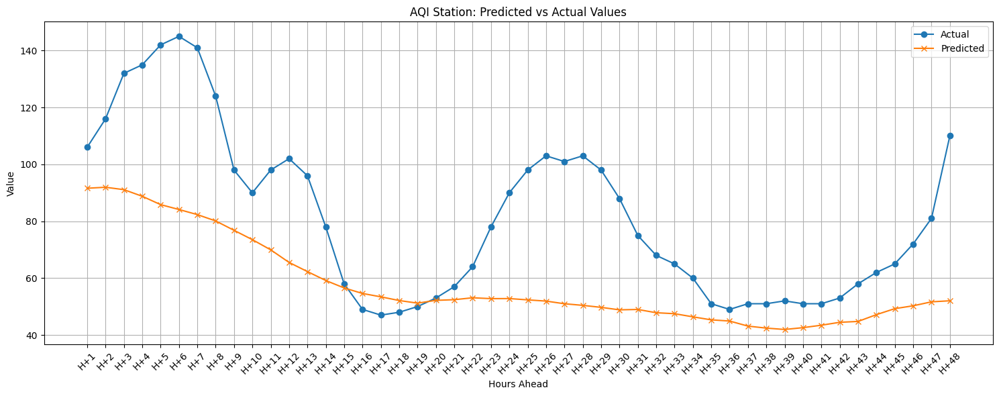


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 14.399742126464844
    RMSE: 14.399741996996964
    MAPE: 13.584662383457399
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 19.226333618164062
    RMSE: 19.82291290341968
    MAPE: 17.159971325290456
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 31.3929500579834
    RMSE: 33.89304538383391
    MAPE: 24.88528050226662
    Correlation: -0.7336219305313895
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 43.144535064697266
    RMSE: 45.855576397192415
    MAPE: 32.258886841073156
    Correlation: -0.5240688510420809
    DA: 42.857142857142854

  Metrics for 12h:
    MAE: 37.28020477294922
    RMSE: 40.47689348566661
    MAPE: 30.199806123689477
    Correlation: 0.5718182175929535
    DA: 45.45454545454545

  Metrics for 16h:
    MAE: 31.684852600097656
    RMSE: 36.387206661047095
    MAPE: 27.22498471264252
    Correlation: 0.8326048290488854
    DA: 60.0

  Metrics for 24h:
    MAE: 24.89219665527343

In [ ]:
# New Test for new feature
# lookback=48, forecast_range=24
predictor_s4 =  Cnn_Lstm_AirQualityPredictor(
    lookback=96,       # Look back 168 giờ (7 ngày)
    forecast_range=48,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=64,      # Số filters cho CNN
    lstm_units=64,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s4, y_pred_s2_24 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

In [ ]:
y_pred_s2_24

array([90.02829 , 88.16622 , 83.823074, 79.74919 , 74.66593 , 71.34911 ,
       67.568184, 65.93149 , 63.02608 , 59.59791 , 56.852627, 53.47248 ,
       50.20467 , 48.860733, 47.491436, 47.851322, 48.89505 , 52.763638,
       55.56875 , 59.354023, 61.588295, 63.244514, 63.191658, 62.2321  ],
      dtype=float32)

Epoch 1/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - loss: 42.8552 - val_loss: 59.5721 - learning_rate: 0.0010
Epoch 2/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 38.0574 - val_loss: 42.6926 - learning_rate: 0.0010
Epoch 3/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 20.8377 - val_loss: 18.5495 - learning_rate: 0.0010
Epoch 4/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 8.8254 - val_loss: 15.6353 - learning_rate: 0.0010
Epoch 5/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 7s 29ms/step - loss: 8.3788 - val_loss: 14.7420 - learning_rate: 0.0010
Epoch 6/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 8.3460 - val_loss: 14.8103 - learning_rate: 0.0010
Epoch 7/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 8.0369 - val_loss: 14.7742 - learning_rate: 0.0010
Epoch 8/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 7.8044 - val_loss: 16.1190 - learning_rate: 0.0010
Epoch 9/100
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - loss: 7.7363 - val_loss: 15.5286 - le

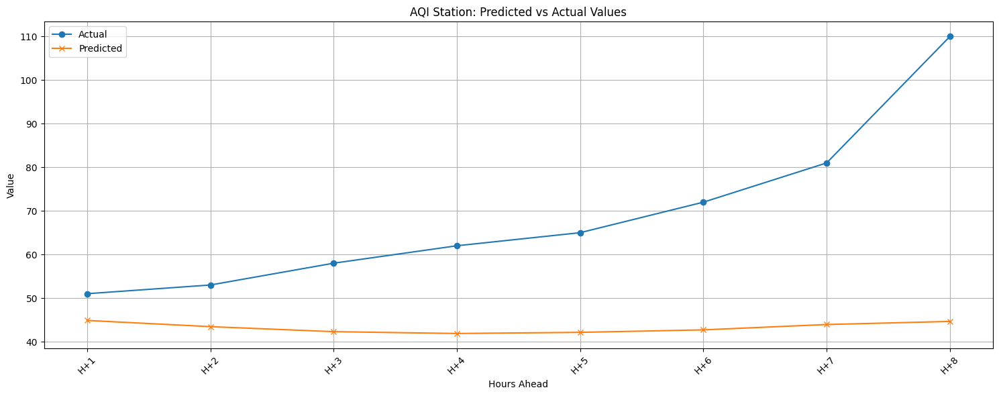


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 6.137889862060547
    RMSE: 6.137889767330336
    MAPE: 12.035078160903034
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 7.849157333374023
    RMSE: 8.033536236787224
    MAPE: 15.03680776411897
    Correlation: -1.0
    DA: 0.0

  Metrics for 4h:
    MAE: 12.885072708129883
    RMSE: 13.974703141063834
    MAPE: 22.407708697655238
    Correlation: -0.9430172644992268
    DA: 0.0

  Metrics for 8h:
    MAE: 25.767425537109375
    RMSE: 31.24290935181333
    MAPE: 33.83634292811373
    Correlation: 0.35862112384978817
    DA: 57.14285714285714

  Metrics for 12h:
    Error: Not enough data for this timeframe.

  Metrics for 16h:
    Error: Not enough data for this timeframe.

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 36h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# New Test for new feature
# lookback=48, forecast_range=12
predictor_s4 = Cnn_Lstm_AirQualityPredictor(
    lookback=48,       # Look back 168 giờ (7 ngày)
    forecast_range=8,  # Dự báo 48 giờ tiếp theo
    epochs=100,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=64,      # Số filters cho CNN
    lstm_units= 128,      # Số units cho LSTM
    dropout_rate=0.3,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)

metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)
# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 17s 41ms/step - loss: 43.0277 - val_loss: 58.6400 - learning_rate: 0.0010
Epoch 2/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 7s 44ms/step - loss: 37.6318 - val_loss: 43.7772 - learning_rate: 0.0010
Epoch 3/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 8s 27ms/step - loss: 19.4017 - val_loss: 17.9085 - learning_rate: 0.0010
Epoch 4/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - loss: 8.9689 - val_loss: 15.6091 - learning_rate: 0.0010
Epoch 5/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 8.4530 - val_loss: 15.5870 - learning_rate: 0.0010
Epoch 6/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 7.9834 - val_loss: 15.8379 - learning_rate: 0.0010
Epoch 7/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 8.0614 - val_loss: 14.6660 - learning_rate: 0.0010
Epoch 8/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 6s 23ms/step - loss: 7.7882 - val_loss: 15.2362 - learning_rate: 0.0010
Epoch 9/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 7.7590 - val_loss: 14.6264 - learning_r

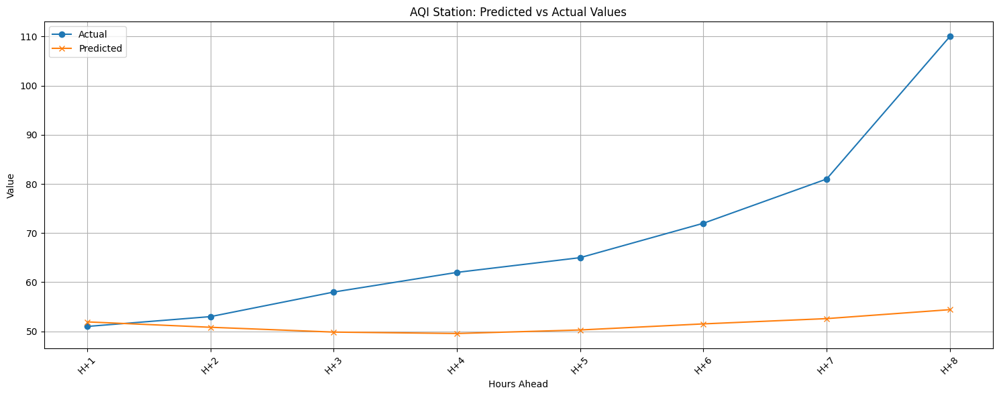


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 0.9254608154296875
    RMSE: 0.9254608243609006
    MAPE: 1.8146290498621325
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 1.547616958618164
    RMSE: 1.6679917630968786
    MAPE: 2.954270281352425
    Correlation: -1.0
    DA: 0.0

  Metrics for 4h:
    MAE: 5.920341491699219
    RMSE: 7.52735109828715
    MAPE: 10.004636228904534
    Correlation: -0.9433324975621183
    DA: 0.0

  Metrics for 8h:
    MAE: 17.859146118164062
    RMSE: 24.390947807761336
    MAPE: 22.088911436634774
    Correlation: 0.7933627313512697
    DA: 57.14285714285714

  Metrics for 12h:
    Error: Not enough data for this timeframe.

  Metrics for 16h:
    Error: Not enough data for this timeframe.

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 36h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# New Test for new feature
# lookback=48, forecast_range=8
predictor_s4 = Cnn_Lstm_AirQualityPredictor(
    lookback=24,       # Look back 168 giờ (7 ngày)
    forecast_range=8,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=32,      # Số filters cho CNN
    lstm_units=50,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001 # Tốc độ học
)

metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)
# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 12s 34ms/step - loss: 43.9282 - val_loss: 59.9056 - learning_rate: 0.0010
Epoch 2/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 8s 24ms/step - loss: 39.0849 - val_loss: 35.0621 - learning_rate: 0.0010
Epoch 3/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 23.4234 - val_loss: 25.6767 - learning_rate: 0.0010
Epoch 4/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 24ms/step - loss: 11.3342 - val_loss: 21.2280 - learning_rate: 0.0010
Epoch 5/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 10.6362 - val_loss: 21.3569 - learning_rate: 0.0010
Epoch 6/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 5s 31ms/step - loss: 10.5236 - val_loss: 23.6146 - learning_rate: 0.0010
Epoch 7/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step - loss: 10.0052 - val_loss: 20.2059 - learning_rate: 0.0010
Epoch 8/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 5s 30ms/step - loss: 9.8720 - val_loss: 20.8002 - learning_rate: 0.0010
Epoch 9/100
164/164 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 9.9727 - val_loss: 20.8612

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


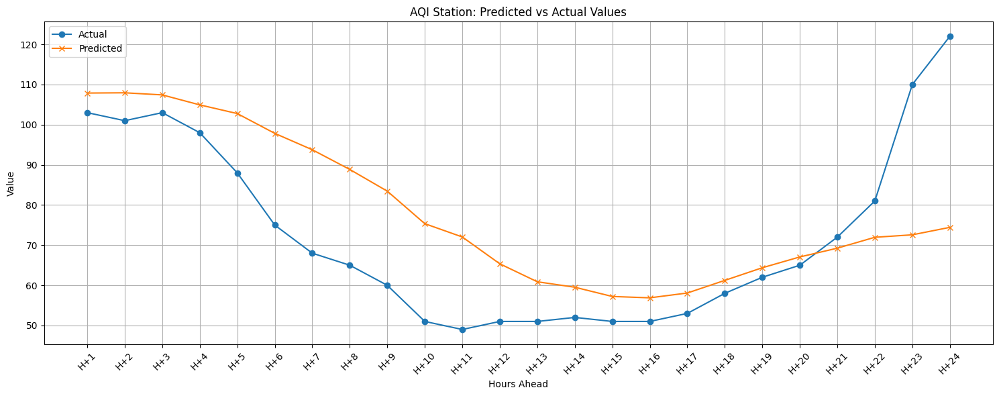


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 4.881011962890625
    RMSE: 4.8810119727170935
    MAPE: 4.738846565913228
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 5.912822723388672
    RMSE: 6.002175254696079
    MAPE: 5.807360651217365
    Correlation: -1.0
    DA: 0.0

  Metrics for 4h:
    MAE: 5.79551887512207
    RMSE: 5.909685699832164
    MAPE: 5.745980684715985
    Correlation: 0.8658647780527637
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 13.80122184753418
    RMSE: 16.248971759836163
    MAPE: 18.10081773755823
    Correlation: 0.978799117931847
    DA: 71.42857142857143

  Metrics for 12h:
    MAE: 16.300065994262695
    RMSE: 18.23860377003867
    MAPE: 25.56622929472811
    Correlation: 0.9515757754403662
    DA: 72.72727272727273

  Metrics for 24h:
    MAE: 13.943065643310547
    RMSE: 18.27799116252932
    MAPE: 19.77112240629399
    Correlation: 0.6443677652596915
    DA: 73.91304347826086

  Metrics for 36h:
    Error: Not enough dat

In [ ]:
# New Test for new feature
# lookback=72, forecast_range=24
predictor_s4 = Cnn_Lstm_AirQualityPredictor(
    lookback=96,       # Look back 168 giờ (7 ngày)
    forecast_range=24,  # Dự báo 48 giờ tiếp theo
    epochs=100,       # Số epochs huấn luyện
    batch_size=64,       # Kích thước batch
    cnn_filters=32,      # Số filters cho CNN
    lstm_units=64,      # Số units cho LSTM
    dropout_rate=0.3,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 9s 29ms/step - loss: 44.1270 - val_loss: 64.1197 - learning_rate: 0.0010
Epoch 2/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 22ms/step - loss: 42.8758 - val_loss: 57.8797 - learning_rate: 0.0010
Epoch 3/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 23ms/step - loss: 39.6300 - val_loss: 45.7438 - learning_rate: 0.0010
Epoch 4/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 32.8284 - val_loss: 41.5746 - learning_rate: 0.0010
Epoch 5/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 24.6687 - val_loss: 39.4412 - learning_rate: 0.0010
Epoch 6/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 2s 21ms/step - loss: 15.6892 - val_loss: 23.5143 - learning_rate: 0.0010
Epoch 7/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - loss: 11.3375 - val_loss: 20.2604 - learning_rate: 0.0010
Epoch 8/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 3s 32ms/step - loss: 10.7328 - val_loss: 22.3284 - learning_rate: 0.0010
Epoch 9/100
82/82 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 10.4733 - val_loss: 21.3297 - learning_rate:

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


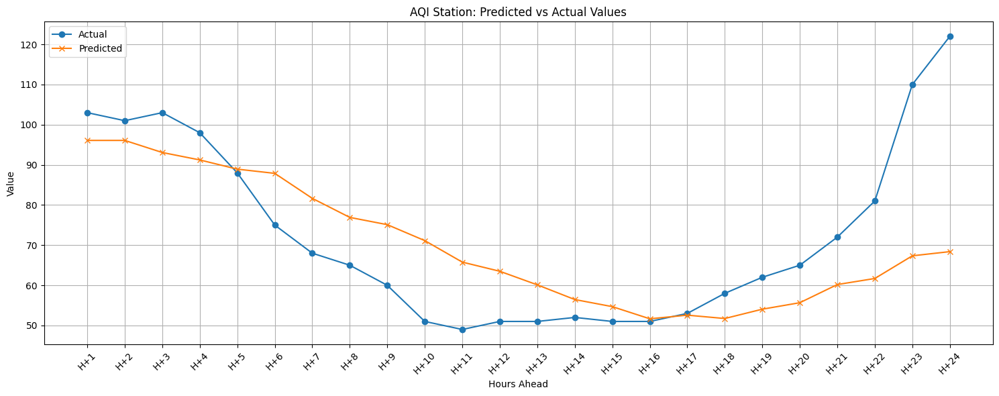


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 6.913299560546875
    RMSE: 6.913299690883276
    MAPE: 6.711941320919296
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 5.9141082763671875
    RMSE: 5.997921265678413
    MAPE: 5.789097884314846
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 7.131988525390625
    RMSE: 7.3543541499834575
    MAPE: 7.031792088696653
    Correlation: 0.6205800706938652
    DA: 66.66666666666666

  Metrics for 8h:
    MAE: 8.48828411102295
    RMSE: 9.430748956414133
    MAPE: 10.595817780163921
    Correlation: 0.9412676206245972
    DA: 85.71428571428571

  Metrics for 12h:
    MAE: 11.034037590026855
    RMSE: 12.187113750890669
    MAPE: 17.345164082989626
    Correlation: 0.9615445608605857
    DA: 81.81818181818183

  Metrics for 24h:
    MAE: 12.570561408996582
    RMSE: 17.434129833652168
    MAPE: 16.869767017523742
    Correlation: 0.6283159135254462
    DA: 73.91304347826086

  Metrics for 36h:
    Error: Not eno

In [ ]:
# New Test for new feature
# lookback=72, forecast_range=24
predictor_s4 = Cnn_Lstm_AirQualityPredictor(
    lookback=72,       # Look back 168 giờ (7 ngày)
    forecast_range=24,  # Dự báo 48 giờ tiếp theo
    epochs=100,       # Số epochs huấn luyện
    batch_size=64,       # Kích thước batch
    cnn_filters=32,      # Số filters cho CNN
    lstm_units=64,      # Số units cho LSTM
    dropout_rate=0.3,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 10s 32ms/step - loss: 2101.2903 - val_loss: 3615.4519 - learning_rate: 0.0010
Epoch 2/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 1666.0837 - val_loss: 2475.3474 - learning_rate: 0.0010
Epoch 3/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 872.4590 - val_loss: 913.3688 - learning_rate: 0.0010
Epoch 4/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 27ms/step - loss: 326.4241 - val_loss: 902.0618 - learning_rate: 0.0010
Epoch 5/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 197.9962 - val_loss: 667.3575 - learning_rate: 0.0010
Epoch 6/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 5s 19ms/step - loss: 179.2643 - val_loss: 634.1392 - learning_rate: 0.0010
Epoch 7/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 6s 26ms/step - loss: 174.7730 - val_loss: 716.0280 - learning_rate: 0.0010
Epoch 8/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 4s 19ms/step - loss: 174.9155 - val_loss: 771.5829 - learning_rate: 0.0010
Epoch 9/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 169.1461 - val

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


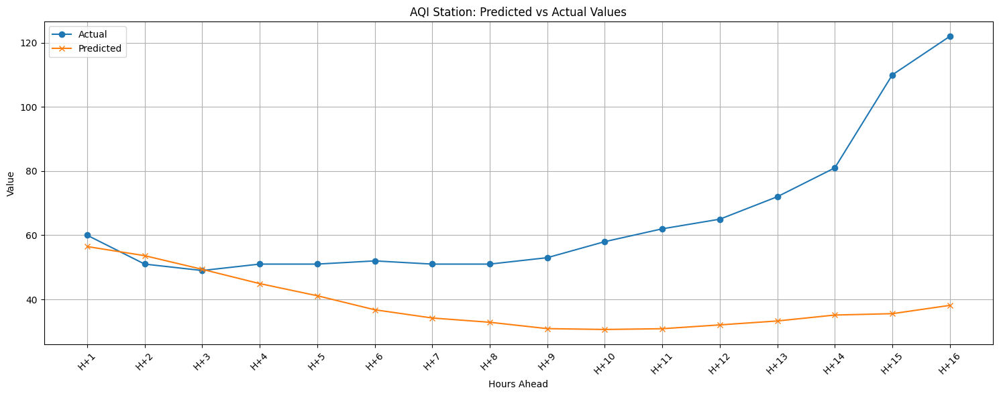


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 3.531879425048828
    RMSE: 3.531879470220223
    MAPE: 5.886465708414714
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 3.078256607055664
    RMSE: 3.111500842418431
    MAPE: 5.516403235641181
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 3.151935577392578
    RMSE: 3.758363425619998
    MAPE: 5.927936652032029
    Correlation: 0.69492817974504
    DA: 66.66666666666666

  Metrics for 8h:
    MAE: 9.080809593200684
    RMSE: 11.16491636156939
    MAPE: 17.60751799342044
    Correlation: 0.46463858443648426
    DA: 42.857142857142854

  Metrics for 12h:
    MAE: 15.52035140991211
    RMSE: 18.91237875224477
    MAPE: 27.56105291022992
    Correlation: -0.26843258092065964
    DA: 45.45454545454545

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 36h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# New Test for new feature
# lookback=36, forecast_range=12
predictor_s4 = Cnn_Lstm_AirQualityPredictor(
    lookback=32,       # Look back 168 giờ (7 ngày)
    forecast_range=16,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=32,      # Số filters cho CNN
    lstm_units=50,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

5. Forecast for station 6

<ipython-input-81-78ca4164cef0>:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['date'] = pd.to_datetime(df['date'])


Epoch 1/40
151/151 ━━━━━━━━━━━━━━━━━━━━ 41s 29ms/step - aqi_station_loss: 3304.5510 - loss: 3307.4827 - max_aqi_pollutant_loss: 2.9473 - val_aqi_station_loss: 4182.7246 - val_loss: 4155.1816 - val_max_aqi_pollutant_loss: 1.6419
Epoch 2/40
151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 35ms/step - aqi_station_loss: 2913.3521 - loss: 2915.4573 - max_aqi_pollutant_loss: 2.1106 - val_aqi_station_loss: 2826.4792 - val_loss: 2810.0725 - val_max_aqi_pollutant_loss: 1.7271
Epoch 3/40
151/151 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - aqi_station_loss: 2194.4226 - loss: 2196.1160 - max_aqi_pollutant_loss: 1.6859 - val_aqi_station_loss: 1316.0625 - val_loss: 1304.2811 - val_max_aqi_pollutant_loss: 1.1079
Epoch 4/40
151/151 ━━━━━━━━━━━━━━━━━━━━ 5s 25ms/step - aqi_station_loss: 1303.0183 - loss: 1304.0461 - max_aqi_pollutant_loss: 1.0214 - val_aqi_station_loss: 463.8898 - val_loss: 457.0938 - val_max_aqi_pollutant_loss: 0.8128
Epoch 5/40
151/151 ━━━━━━━━━━━━━━━━━━━━ 6s 32ms/step - aqi_station_loss: 524.6054 - loss: 525

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


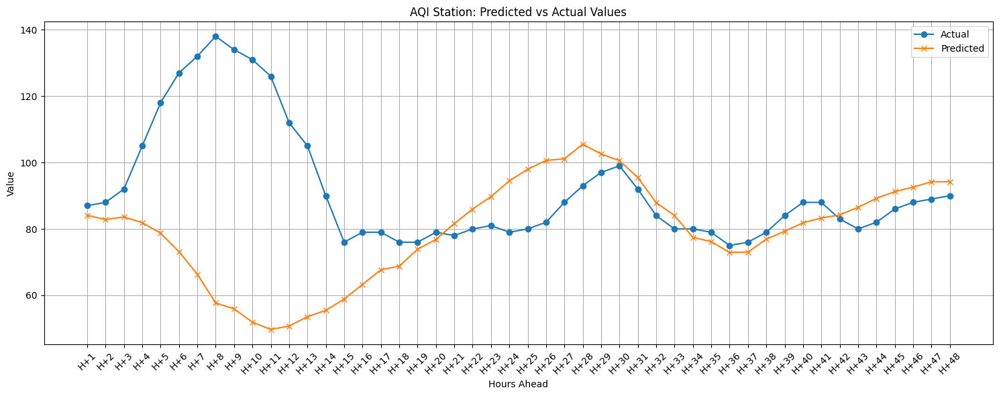

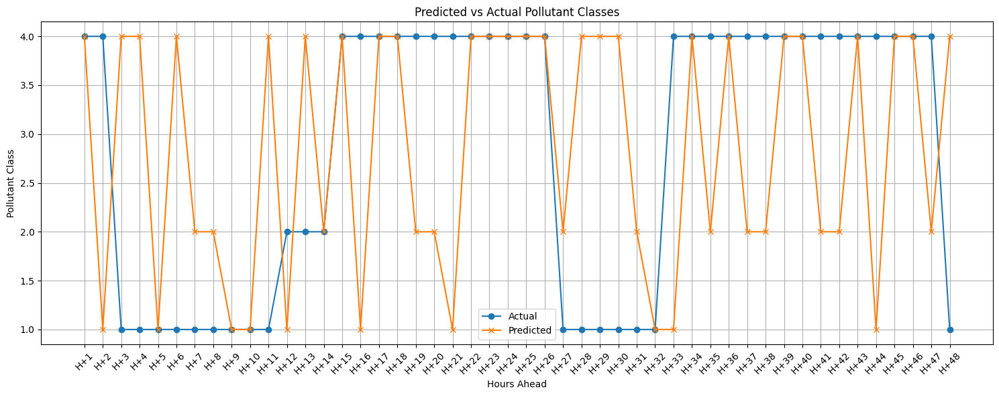


AQI Station 6 Metrics:

  Metrics for 1h:
    MAE: 2.8869857788085938
    RMSE: 2.8869858387202374
    MAPE: 3.3183744584006822
    sMAPE: 3.374361432353351
    Correlation: nan
    DA: nan
    MASE: 0.26920224572378

  Metrics for 2h:
    MAE: 4.030479431152344
    RMSE: 4.189551463006707
    MAPE: 4.59894466300494
    sMAPE: 4.715977426425648
    Correlation: -0.9999999999999999
    DA: 0.0
    MASE: 0.37582939347123484

  Metrics for 4h:
    MAE: 9.89337158203125
    RMSE: 12.649443578733512
    MAPE: 10.08485794906073
    sMAPE: 10.93334339174774
    Correlation: -0.819838703001336
    DA: 33.33333333333333
    MASE: 0.9225254475488761

  Metrics for 8h:
    MAE: 34.828025817871094
    RMSE: 44.49186855131508
    MAPE: 27.99137795417182
    sMAPE: 35.71208129980356
    Correlation: -0.9033286849231795
    DA: 14.285714285714285
    MASE: 3.2476026841274925

  Metrics for 24h:
    MAE: 31.199546813964844
    RMSE: 42.17692720524531
    MAPE: 27.47706668087569
    sMAPE: 35.30033165

In [ ]:
# Forecast for station 6
predictor_s6 = AirQualityPredictor(lookback=168, forecast_range=48, epochs=40, batch_size=32)
metrics_aqi_s6, pollutant_accuracy_s6 = predictor_s6.evaluate(station6)

# # Save model
predictor_s6.model.save('Model_s6.h5')

# Print results
print("\nAQI Station 6 Metrics:")
for timeframe, metrics in metrics_aqi_s6.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value}")
    else:
        print(f"  {timeframe}: {metrics}")

print(f"\nPollutant Classification Accuracy: {pollutant_accuracy_s6:.2f}%")

Epoch 1/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - loss: 53.4008 - val_loss: 64.7928 - learning_rate: 0.0010
Epoch 2/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 21ms/step - loss: 47.7007 - val_loss: 49.5929 - learning_rate: 0.0010
Epoch 3/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 6s 30ms/step - loss: 29.1031 - val_loss: 21.1579 - learning_rate: 0.0010
Epoch 4/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - loss: 11.9930 - val_loss: 12.2551 - learning_rate: 0.0010
Epoch 5/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 10.1061 - val_loss: 11.4451 - learning_rate: 0.0010
Epoch 6/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 10.3009 - val_loss: 13.3463 - learning_rate: 0.0010
Epoch 7/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 29ms/step - loss: 9.6218 - val_loss: 13.6912 - learning_rate: 0.0010
Epoch 8/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 9.4793 - val_loss: 13.7457 - learning_rate: 0.0010
Epoch 9/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - loss: 9.1587 - val_loss: 13.9510 - learnin

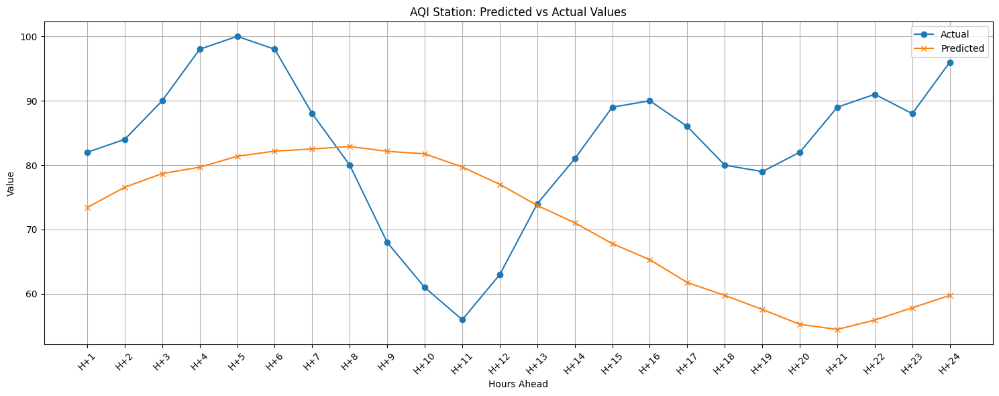


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 8.580513000488281
    RMSE: 8.580513154447836
    MAPE: 10.464040244497903
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 8.005306243896484
    RMSE: 8.025945076597434
    MAPE: 9.654698388501743
    Correlation: 0.9999999999999998
    DA: 100.0

  Metrics for 4h:
    MAE: 11.409612655639648
    RMSE: 12.16858758960058
    MAPE: 12.641922105935077
    Correlation: 0.8909316294459417
    DA: 100.0

  Metrics for 8h:
    MAE: 11.057244300842285
    RMSE: 12.388225847490734
    MAPE: 11.897704349182051
    Correlation: 0.37161409062156453
    DA: 57.14285714285714

  Metrics for 12h:
    MAE: 13.424484252929688
    RMSE: 14.769085965913892
    MAPE: 17.884141750247952
    Correlation: 0.08286135537414101
    DA: 63.63636363636363

  Metrics for 16h:
    MAE: 13.573148727416992
    RMSE: 15.35947484151807
    MAPE: 17.404505959308747
    Correlation: -0.11298674876426927
    DA: 46.666666666666664

  Metrics for 24h:
    MAE

array([73.41949 , 76.5699  , 78.69051 , 79.68165 , 81.37875 , 82.18116 ,
       82.51544 , 82.89486 , 82.14952 , 81.75805 , 79.709175, 77.019104,
       73.740585, 71.05116 , 67.8131  , 65.318565, 61.773033, 59.764446,
       57.594208, 55.283142, 54.481937, 55.949574, 57.85454 , 59.773853],
      dtype=float32)

In [ ]:
# New Test for new feature
# lookback=72, forecast_range=24
predictor_s6 = Cnn_Lstm_AirQualityPredictor(
    lookback=72,       # Look back 168 giờ (7 ngày)
    forecast_range=24,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=36,      # Số filters cho CNN
    lstm_units=128,      # Số units cho LSTM
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s6, y_pred_s6 = predictor_s6.evaluate(station6)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s6.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

y_pred_s6

# VI. Transfomer + CNN

0. Library

In [ ]:
from tensorflow.keras.layers import Input, Conv1D, MaxPooling1D, Flatten, Dense, Dropout, concatenate, BatchNormalization, Activation, MultiHeadAttention, LayerNormalization, Add

1. Build Model

In [ ]:
class Cnn_Transformer_AirQualityPredictor:
    def __init__(self, lookback=168, forecast_range=48, epochs=100, batch_size=32,
                 cnn_filters=64, transformer_units=128, num_heads=4, dropout_rate=0.2, learning_rate=0.001):
        self.lookback = lookback
        self.forecast_range = forecast_range
        self.epochs = epochs
        self.batch_size = batch_size
        self.cnn_filters = cnn_filters
        self.transformer_units = transformer_units
        self.num_heads = num_heads
        self.dropout_rate = dropout_rate
        self.learning_rate = learning_rate
        # self.label_encoder = LabelEncoder()  # No longer used
        # Removed feature_scaler and target_scaler

    def prepare_data(self, df, isIncludeCO=True, stride=3):
        df['date'] = pd.to_datetime(df['date'])

        if isIncludeCO is True:
            features = ['aqi_rolling_avg', 'rush_hour']
            # features = ['aqi_rolling_avg', 'rush_hour']
        else:
            features = ['aqi_rolling_avg', 'rush_hour']

        # Add AQI_Station[i] features if they exist
        # for station in [2, 3, 4, 6]:  # Iterate through station numbers
        #     column_name = f'AQI_Station[{station}]'
        #     if column_name in df.columns:
        #         features.append(column_name)

        X = df[features].values
        # Removed feature scaling
        y_numeric = df['AQI_Station'].values
        # Removed target scaling

        X_seq, y_seq = [], []
        for i in range(0, len(X) - self.lookback - self.forecast_range, stride):
            X_seq.append(X[i:(i + self.lookback)])
            y_seq.append(y_numeric[i + self.lookback:i + self.lookback + self.forecast_range])

        return np.array(X_seq), np.array(y_seq)

    def transformer_encoder(self, inputs, head_size, num_heads, ff_dim, dropout=0):
        # Multi-Head Attention
        attention_output = MultiHeadAttention(num_heads=num_heads, key_dim=head_size, dropout=dropout)(inputs, inputs)
        # Skip connection
        attention_output = Add()([inputs, attention_output])
        # Layer Normalization
        attention_output = LayerNormalization(epsilon=1e-6)(attention_output)

        # Feed-Forward Network
        ffn = Dense(ff_dim, activation='relu')(attention_output)
        ffn = Dense(inputs.shape[-1])(ffn)
        ffn = Dropout(dropout)(ffn)
        # Skip connection
        ffn_output = Add()([attention_output, ffn])
        # Layer Normalization
        ffn_output = LayerNormalization(epsilon=1e-6)(ffn_output)
        return ffn_output

    def build_model(self, input_shape):
        inputs = Input(shape=input_shape)
        x = BatchNormalization()(inputs)

        # CNN branch
        conv1 = Conv1D(filters=self.cnn_filters, kernel_size=3, padding='same')(x)
        bn1 = BatchNormalization()(conv1)
        act1 = Activation('relu')(bn1)
        conv2 = Conv1D(filters=self.cnn_filters * 2, kernel_size=3, padding='same')(act1)
        bn2 = BatchNormalization()(conv2)
        act2 = Activation('relu')(bn2)
        pool = MaxPooling1D(pool_size=2)(act2)
        drop1 = Dropout(self.dropout_rate)(pool)
        flatten_cnn = Flatten()(drop1)

        # Transformer branch
        transformer_output = self.transformer_encoder(
            inputs=x,
            head_size=self.transformer_units,
            num_heads=self.num_heads,
            ff_dim=self.transformer_units * 2,  # Dimension of Feed Forward network
            dropout=self.dropout_rate
        )

        flatten_transformer = Flatten()(transformer_output)

        merged = concatenate([flatten_cnn, flatten_transformer])
        drop3 = Dropout(self.dropout_rate)(merged)
        dense1 = Dense(100, activation='relu')(drop3)
        bn5 = BatchNormalization()(dense1)
        drop4 = Dropout(self.dropout_rate)(bn5)

        output = Dense(self.forecast_range,
                       activation='linear',
                       kernel_initializer='he_normal',
                       name='aqi_station')(drop4)
        model = Model(inputs=inputs, outputs=output)
        optimizer = Adam(learning_rate=self.learning_rate)
        model.compile(optimizer=optimizer, loss='mse')
        return model

    def train(self, X_train, y_train, validation_split=0.3):
            input_shape = (self.lookback, X_train.shape[2])
            model = self.build_model(input_shape)

            # Early stopping callback
            early_stopping = EarlyStopping(
                monitor='val_loss',
                patience=25,
                restore_best_weights=True,
                min_delta=1e-5
            )

            reduce_lr = ReduceLROnPlateau(
                monitor='val_loss',
                factor=0.2,
                patience=20,
                min_lr=1e-6,
                verbose=1
            )

            history = model.fit(
                X_train,
                y_train,
                epochs=self.epochs,
                batch_size=self.batch_size,
                validation_split=validation_split,
                callbacks=[reduce_lr],
                verbose=1
            )

            self.model = model
            return history

    def predict(self, X):
        predictions = self.model.predict(X)
        return predictions  # No inverse transform

    def evaluate(self, df, isIncludeCO=True, stride=1):
        evaluator = ModelEvaluator()
        X, y = self.prepare_data(df, isIncludeCO, stride)

        train_size = len(X) - 1  # Lấy tất cả trừ chuỗi cuối cùng làm train
        X_train, X_test = X[:train_size], X[train_size:]
        y_train, y_test = y[:train_size], y[train_size:]

        self.train(X_train, y_train)

        y_pred = self.predict(X_test)

        y_true = y_test[0]  # Lấy chuỗi test đầu tiên (no inverse transform)
        train_aqi = y_train

        metrics_aqi = evaluator.evaluate_numeric_predictions_timeframes(y_true, y_pred[0], train_aqi)

        evaluator.plot_predictions(y_true, y_pred[0], "AQI Station: Predicted vs Actual Values",
                                   hours_ahead=self.forecast_range)

        return metrics_aqi, y_pred[0]

Epoch 1/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 28s 85ms/step - loss: 2088.9170 - val_loss: 3748.1216 - learning_rate: 0.0010
Epoch 2/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - loss: 1687.9327 - val_loss: 2080.8689 - learning_rate: 0.0010
Epoch 3/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 863.9603 - val_loss: 1941.7325 - learning_rate: 0.0010
Epoch 4/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 310.6297 - val_loss: 1006.2621 - learning_rate: 0.0010
Epoch 5/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 200.8227 - val_loss: 956.5373 - learning_rate: 0.0010
Epoch 6/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 186.2271 - val_loss: 887.2476 - learning_rate: 0.0010
Epoch 7/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 180.5349 - val_loss: 895.6989 - learning_rate: 0.0010
Epoch 8/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 170.3838 - val_loss: 755.9192 - learning_rate: 0.0010
Epoch 9/50
153/153 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 167.9585 - val_loss

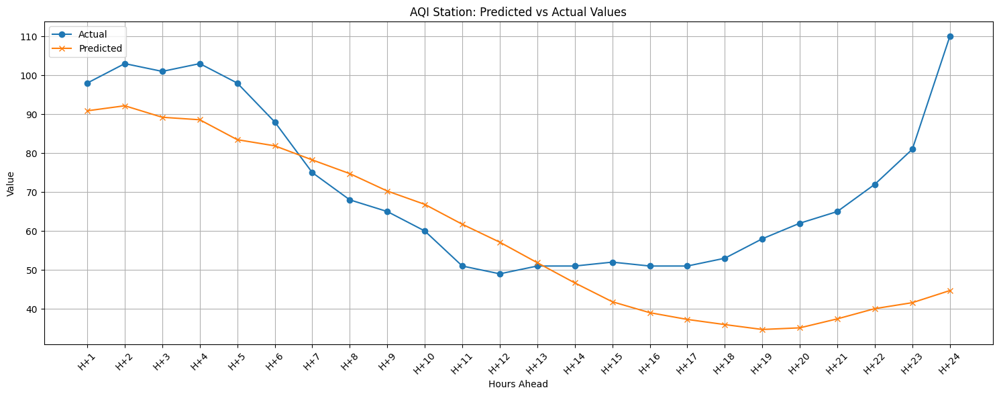


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 7.1249237060546875
    RMSE: 7.124923705646208
    MAPE: 7.270330312300702
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 8.976791381835938
    RMSE: 9.165816897683232
    MAPE: 8.891795766644131
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 11.041082382202148
    RMSE: 11.346943555502417
    MAPE: 10.864372211435471
    Correlation: -0.11633316483838275
    DA: 66.66666666666666

  Metrics for 8h:
    MAE: 9.352773666381836
    RMSE: 10.123853076919225
    MAPE: 9.937750925452505
    Correlation: 0.9304151311875244
    DA: 85.71428571428571

  Metrics for 12h:
    MAE: 8.814383506774902
    RMSE: 9.466726961973636
    MAPE: 11.383739483427286
    Correlation: 0.9768375971866129
    DA: 90.9090909090909

  Metrics for 16h:
    MAE: 8.32017993927002
    RMSE: 9.159040943562779
    MAPE: 11.865566218784018
    Correlation: 0.9197379966338189
    DA: 73.33333333333333

  Metrics for 24h:
    MAE: 15.7625656

In [ ]:
# New Test for new feature
# lookback=36, forecast_range=12
predictor_s4 = Cnn_Transformer_AirQualityPredictor(
    lookback=78,       # Look back 168 giờ (7 ngày)
    forecast_range=24,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=36,      # Số filters cho CNN
    transformer_units=128,  # Số units cho Transformer
    num_heads=4,        # Number of attention heads
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 31s 85ms/step - loss: 2138.7803 - val_loss: 3400.3528 - learning_rate: 0.0010
Epoch 2/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 19s 6ms/step - loss: 1650.6760 - val_loss: 1987.2225 - learning_rate: 0.0010
Epoch 3/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 857.6127 - val_loss: 1173.0098 - learning_rate: 0.0010
Epoch 4/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 315.8197 - val_loss: 744.7441 - learning_rate: 0.0010
Epoch 5/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 193.8062 - val_loss: 611.1689 - learning_rate: 0.0010
Epoch 6/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - loss: 170.5082 - val_loss: 731.7691 - learning_rate: 0.0010
Epoch 7/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step - loss: 173.4011 - val_loss: 743.2788 - learning_rate: 0.0010
Epoch 8/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 170.9124 - val_loss: 611.7480 - learning_rate: 0.0010
Epoch 9/50
154/154 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - loss: 162.8272 - val_loss:

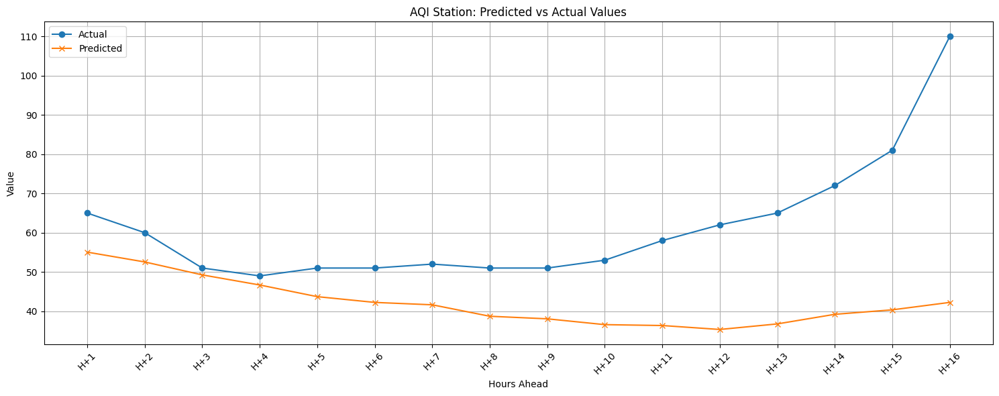


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 9.950286865234375
    RMSE: 9.950286891769283
    MAPE: 15.308133638822117
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 8.700729370117188
    RMSE: 8.789999082042312
    MAPE: 13.86337671524439
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 5.366518974304199
    RMSE: 6.382633500875179
    MAPE: 8.97052776576094
    Correlation: 0.9833983405979974
    DA: 100.0

  Metrics for 8h:
    MAE: 7.5186309814453125
    RMSE: 8.297940230729184
    MAPE: 13.91754110562459
    Correlation: 0.7800669494526822
    DA: 57.14285714285714

  Metrics for 12h:
    MAE: 11.481910705566406
    RMSE: 13.434510932087369
    MAPE: 20.663225642786433
    Correlation: 0.264650954425462
    DA: 36.36363636363637

  Metrics for 16h:
    MAE: 19.199066162109375
    RMSE: 25.34639175889366
    MAPE: 28.04275227080786
    Correlation: -0.03606569791275873
    DA: 53.333333333333336

  Metrics for 24h:
    Error: Not enough data for 

In [ ]:
# New Test for new feature
# lookback=36, forecast_range=12
predictor_s4 = Cnn_Transformer_AirQualityPredictor(
    lookback=48,       # Look back 168 giờ (7 ngày)
    forecast_range=16,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=36,      # Số filters cho CNN
    transformer_units=128,  # Số units cho Transformer
    num_heads=4,        # Number of attention heads
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 22s 66ms/step - loss: 2019.7810 - val_loss: 2728.0725 - learning_rate: 0.0010
Epoch 2/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 1604.2073 - val_loss: 1707.3467 - learning_rate: 0.0010
Epoch 3/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 831.2052 - val_loss: 927.0110 - learning_rate: 0.0010
Epoch 4/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 283.7230 - val_loss: 591.5253 - learning_rate: 0.0010
Epoch 5/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 162.1191 - val_loss: 487.7754 - learning_rate: 0.0010
Epoch 6/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 137.5305 - val_loss: 405.4263 - learning_rate: 0.0010
Epoch 7/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - loss: 146.2376 - val_loss: 448.1993 - learning_rate: 0.0010
Epoch 8/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 2s 7ms/step - loss: 135.5129 - val_loss: 406.1781 - learning_rate: 0.0010
Epoch 9/50
155/155 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 124.8193 - val_loss: 4

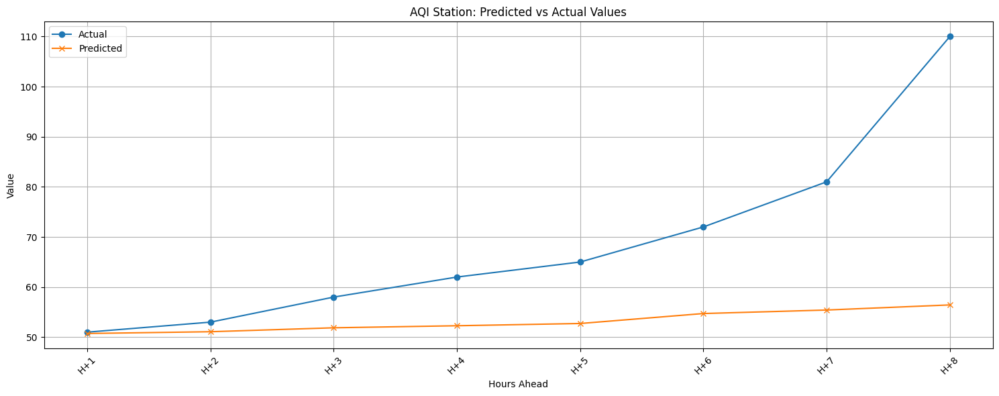


AQI Station 4 Metrics:

  Metrics for 1h:
    MAE: 0.2676544189453125
    RMSE: 0.26765442198993716
    MAPE: 0.5248125861672794
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 1.0911846160888672
    RMSE: 1.3670720078870133
    MAPE: 2.068741022548189
    Correlation: 0.9999999999999999
    DA: 100.0

  Metrics for 4h:
    MAE: 4.508383750915527
    RMSE: 5.827030846208557
    MAPE: 7.596431311896476
    Correlation: 0.9946744775598038
    DA: 100.0

  Metrics for 8h:
    MAE: 15.842220306396484
    RMSE: 22.66298391306295
    MAPE: 19.193860233809147
    Correlation: 0.9324048076168605
    DA: 100.0

  Metrics for 12h:
    Error: Not enough data for this timeframe.

  Metrics for 16h:
    Error: Not enough data for this timeframe.

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 36h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# New Test for new feature
# lookback=36, forecast_range=12
predictor_s4 = Cnn_Transformer_AirQualityPredictor(
    lookback=24,       # Look back 168 giờ (7 ngày)
    forecast_range=8,  # Dự báo 48 giờ tiếp theo
    epochs=50,       # Số epochs huấn luyện
    batch_size=32,       # Kích thước batch
    cnn_filters=36,      # Số filters cho CNN
    transformer_units=128,  # Số units cho Transformer
    num_heads=4,        # Number of attention heads
    dropout_rate=0.2,   # Tỉ lệ dropout
    learning_rate=0.001  # Tốc độ học
)
metrics_aqi_s4, y_pred_s2 = predictor_s4.evaluate(station4)

# # Save model
# predictor_s4.model.save('Model_s4_2.h5')

# Print results
print("\nAQI Station 4 Metrics:")
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

2. Evaluator

# (Additional 1) LSTM


0. Library

In [ ]:
from tensorflow.keras.layers import Input, Dense, LSTM, Conv1D, MaxPooling1D, concatenate, Flatten, Reshape
import random

1. Prepare Model

In [ ]:
class Lstm_AirQualityPredictor:
    def __init__(self, lookback=168, forecast_range=48, epochs=50, batch_size=32):
        self.lookback = lookback
        self.forecast_range = forecast_range
        self.epochs = epochs
        self.batch_size = batch_size
        self.feature_scaler = MinMaxScaler()
        self.target_scaler = MinMaxScaler()
        self.label_encoder = LabelEncoder()

    def prepare_data(self, df, isIncludeCO=True):
        df['date'] = pd.to_datetime(df['date'])

        if isIncludeCO is True:
            features = ['aqi_rolling_avg']
        else:
            features = ['aqi_rolling_avg']

        X = df[features].values
        X_scaled = X  # Apply scaling if needed

        y_numeric = df['AQI_Station'].values
        y_scaled = y_numeric

        X_seq, y_seq = [], []
        for i in range(len(X_scaled) - self.lookback - self.forecast_range):
            X_seq.append(X_scaled[i:(i + self.lookback)])
            y_seq.append(y_scaled[i + self.lookback:i + self.lookback + self.forecast_range])

        return np.array(X_seq), np.array(y_seq)

    def build_model(self, input_shape):
        inputs = Input(shape=input_shape)

        # LSTM branch
        lstm1 = LSTM(64, return_sequences=True)(inputs)
        bn1 = BatchNormalization()(lstm1)
        drop1 = Dropout(0.2)(bn1)
        lstm2 = LSTM(32)(drop1)
        bn2 = BatchNormalization()(lstm2)
        drop2 = Dropout(0.2)(bn2)

        # Fully connected layers
        dense1 = Dense(100, activation='relu')(drop2)
        bn3 = BatchNormalization()(dense1)

        # Output layers
        output1 = Dense(self.forecast_range, activation='linear', kernel_initializer='he_normal', name='aqi_station')(bn3)

        model = Model(inputs=inputs, outputs=output1)
        optimizer = Adam(learning_rate=0.001)
        model.compile(
            optimizer=optimizer,
            loss='mse'
        )
        return model

    def train(self, X_train, y_train, validation_split=0.25):
        input_shape = (self.lookback, X_train.shape[2])
        model = self.build_model(input_shape)  # Removed n_classes

        # Early stopping callback
        early_stopping = EarlyStopping(
            monitor='val_loss',
            patience=20,
            restore_best_weights=True,
            min_delta=1e-5
        )

        history = model.fit(
            X_train,
            y_train,  # Simplified target
            epochs=self.epochs,  # Using class parameter
            batch_size=self.batch_size,  # Using class parameter
            validation_split=validation_split,
            callbacks=[early_stopping],
            verbose=1
        )

        self.model = model
        return history

    def predict(self, X):
        predictions = self.model.predict(X)
        return predictions  # Only AQI predictions

    def evaluate(self, df, isIncludeCO=True):
        evaluator = ModelEvaluator()
        X, y = self.prepare_data(df, isIncludeCO)

        train_size = len(X) - 1
        X_train, X_test = X[:train_size], X[train_size:]
        y_train, y_test = y[:train_size], y[train_size:]

        self.train(X_train, y_train)

        y_pred = self.predict(X_test)  # Simplified prediction

        y_true = y_test[0]  # Simplified true value
        train_aqi = y_train

        metrics_aqi = evaluator.evaluate_numeric_predictions_timeframes(y_true, y_pred[0], train_aqi)

        evaluator.plot_predictions(y_true, y_pred[0], "LSTM model: Predicted vs Actual Values",
                                   hours_ahead=self.forecast_range)  # Modified parameter

        return metrics_aqi, y_pred[0]  # Simplified return

2. Station station 4

Epoch 1/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step - loss: 2260.0803 - val_loss: 5081.0742
Epoch 2/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 1700.6991 - val_loss: 2231.9656
Epoch 3/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 3s 19ms/step - loss: 749.8058 - val_loss: 1778.8967
Epoch 4/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 4s 22ms/step - loss: 295.3800 - val_loss: 1225.1151
Epoch 5/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 228.2382 - val_loss: 1090.2499
Epoch 6/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 210.1330 - val_loss: 981.0136
Epoch 7/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 205.0608 - val_loss: 1439.6940
Epoch 8/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 202.5722 - val_loss: 1432.5105
Epoch 9/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 187.7745 - val_loss: 1086.6895
Epoch 10/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 188.1527 - val_loss: 871.1152
Epoch 11/50
161/161 ━━━━━━━━━━━━━━━━━━━━ 5s 17ms/step - loss: 181.5544 - val_lo

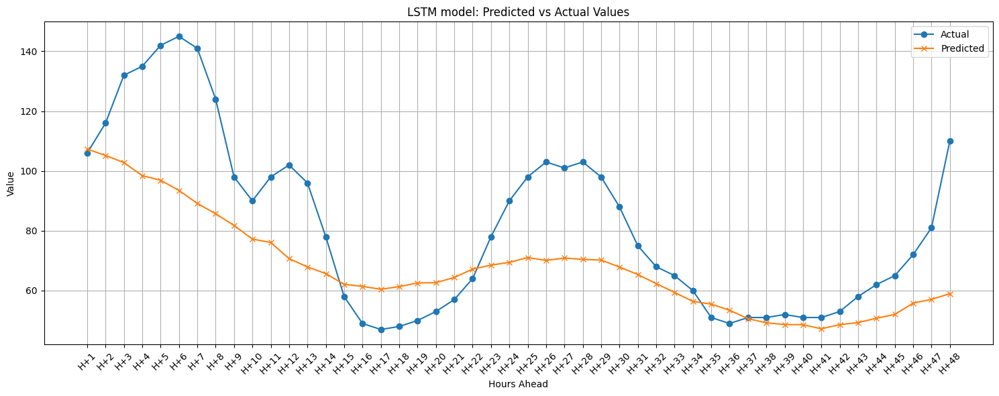


AQI Station 4 with lookback 4 and forecast_range 12 Metrics:

  Metrics for 1h:
    MAE: 1.3042221069335938
    RMSE: 1.3042221153017515
    MAPE: 1.2303982140882959
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 6.055637359619141
    RMSE: 7.697187321188871
    MAPE: 5.273411439934099
    Correlation: -1.0
    DA: 0.0

  Metrics for 4h:
    MAE: 19.468929290771484
    RMSE: 24.021441736205958
    MAPE: 14.938194172454573
    Correlation: -0.9210023479639823
    DA: 0.0

  Metrics for 8h:
    MAE: 33.08091354370117
    RMSE: 37.33549202627106
    MAPE: 24.338404886311384
    Correlation: -0.5639716483307162
    DA: 28.57142857142857

  Metrics for 24h:
    MAE: 20.55549430847168
    RMSE: 25.27760422569008
    MAPE: 21.18813904947853
    Correlation: 0.8606298112822592
    DA: 69.56521739130434

  Metrics for 48h:
    MAE: 17.44447135925293
    RMSE: 22.5286655504576
    MAPE: 19.100168447426704
    Correlation: 0.8475007996196661
    DA: 70.2127659574468


In [ ]:
# Lookback = 168, forecast_range=48
predictor_s4 = Lstm_AirQualityPredictor(lookback=168, forecast_range=48, epochs=50, batch_size=32)
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4) # Thay đổi ở đây

# # Save model
# predictor_s2.model.save('model_s2.h5')

# Print results
print("\nAQI Station 4 with lookback 4 and forecast_range 12 Metrics:") # Thay đổi ở đây
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 2278.3843 - val_loss: 4906.1240
Epoch 2/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 5s 18ms/step - loss: 1730.7562 - val_loss: 3470.2729
Epoch 3/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 751.0738 - val_loss: 1276.3080
Epoch 4/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 284.4390 - val_loss: 1154.8815
Epoch 5/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 220.0492 - val_loss: 1057.1543
Epoch 6/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - loss: 213.1234 - val_loss: 1011.0558
Epoch 7/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 20ms/step - loss: 212.2382 - val_loss: 904.4444
Epoch 8/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - loss: 199.2387 - val_loss: 821.8471
Epoch 9/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 201.9605 - val_loss: 865.5173
Epoch 10/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 193.2701 - val_loss: 925.0760
Epoch 11/50
163/163 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 186.3454 - val_loss

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step


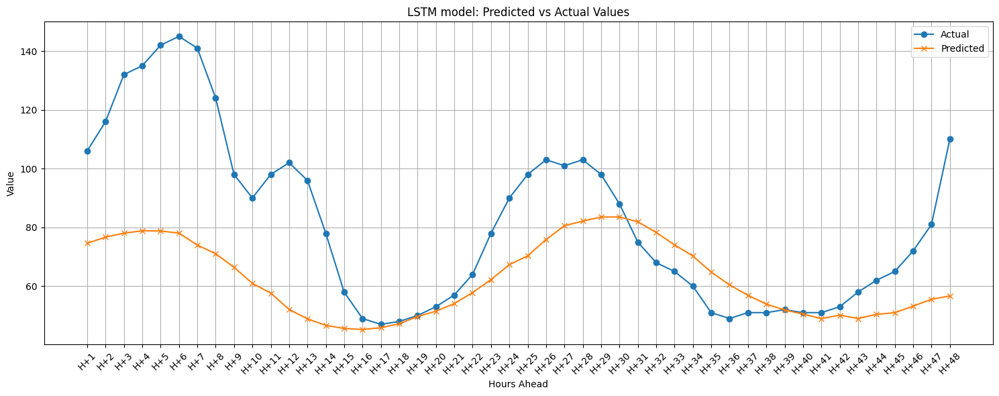


AQI Station 4 with lookback 4 and forecast_range 12 Metrics:

  Metrics for 1h:
    MAE: 31.385513305664062
    RMSE: 31.38551282103038
    MAPE: 29.608974816664208
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 35.352699279785156
    RMSE: 35.57459599043695
    MAPE: 31.752713810877896
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 45.20603942871094
    RMSE: 46.358919466080096
    MAPE: 36.49582080997709
    Correlation: 0.9807922451713205
    DA: 100.0

  Metrics for 8h:
    MAE: 53.87105941772461
    RMSE: 55.19402477708751
    MAPE: 40.864413133921055
    Correlation: 0.42177743030049314
    DA: 71.42857142857143

  Metrics for 24h:
    MAE: 30.32383155822754
    RMSE: 37.922198507581776
    MAPE: 27.815866182974787
    Correlation: 0.8788596115306274
    DA: 78.26086956521739

  Metrics for 48h:
    MAE: 21.898141860961914
    RMSE: 29.606576591044874
    MAPE: 22.45796778512783
    Correlation: 0.6640331347828564
    DA: 72.3404255319149


In [ ]:
# Lookback = 96, forecast_range=48
predictor_s4 = Lstm_AirQualityPredictor(lookback=96, forecast_range=48, epochs=50, batch_size=32)
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4) # Thay đổi ở đây

# # Save model
# predictor_s2.model.save('model_s2.h5')

# Print results
print("\nAQI Station 4 with lookback 4 and forecast_range 12 Metrics:") # Thay đổi ở đây
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 6s 21ms/step - loss: 2243.9937 - val_loss: 4486.7212
Epoch 2/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 1705.9165 - val_loss: 2755.3225
Epoch 3/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 728.4604 - val_loss: 1259.4865
Epoch 4/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 264.0160 - val_loss: 800.4096
Epoch 5/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 12ms/step - loss: 205.0355 - val_loss: 739.4984
Epoch 6/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 184.2698 - val_loss: 744.7619
Epoch 7/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step - loss: 174.8700 - val_loss: 969.9633
Epoch 8/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 161.7672 - val_loss: 823.7933
Epoch 9/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 159.6085 - val_loss: 998.3044
Epoch 10/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 154.4990 - val_loss: 961.6329
Epoch 11/50
164/164 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 146.8451 - val_loss: 8

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step


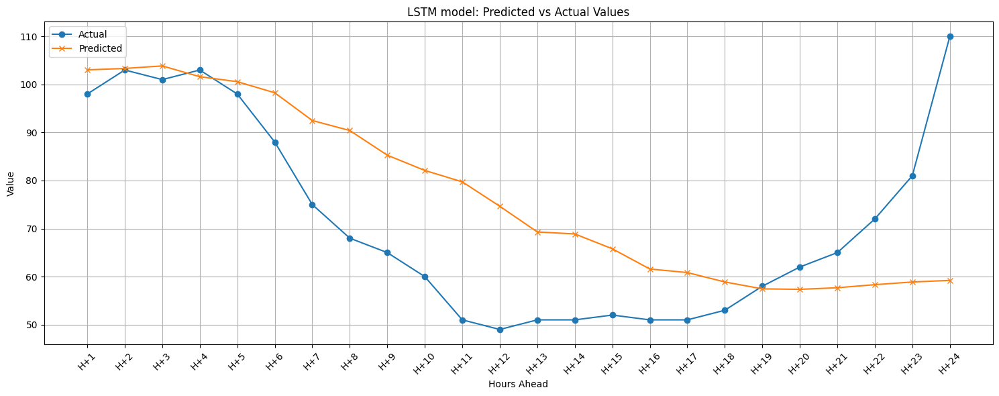


AQI Station 4 with lookback 4 and forecast_range 12 Metrics:

  Metrics for 1h:
    MAE: 5.027336120605469
    RMSE: 5.027336162096061
    MAPE: 5.129934816944356
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 2.673969268798828
    RMSE: 3.562084642256019
    MAPE: 2.7205996497305214
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 2.3974246978759766
    RMSE: 2.976233917282595
    MAPE: 2.403543805107964
    Correlation: -0.32064672005613754
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 7.7888946533203125
    RMSE: 10.92648999421818
    MAPE: 10.020015843203584
    Correlation: 0.9773975515522009
    DA: 71.42857142857143

  Metrics for 24h:
    MAE: 13.934592247009277
    RMSE: 17.977011517914605
    MAPE: 21.568018122012155
    Correlation: 0.6029755681000369
    DA: 60.86956521739131

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# Lookback = 72, forecast_range=24
predictor_s4 = Lstm_AirQualityPredictor(lookback=72, forecast_range=24, epochs=50, batch_size=32)
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4) # Thay đổi ở đây

# # Save model
# predictor_s2.model.save('model_s2.h5')

# Print results
print("\nAQI Station 4 with lookback 4 and forecast_range 12 Metrics:") # Thay đổi ở đây
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step - loss: 2221.2910 - val_loss: 4354.5859
Epoch 2/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1658.6709 - val_loss: 2238.3577
Epoch 3/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 698.3557 - val_loss: 767.0811
Epoch 4/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 251.0650 - val_loss: 656.5156
Epoch 5/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 180.8024 - val_loss: 693.7535
Epoch 6/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 168.3058 - val_loss: 586.0704
Epoch 7/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 157.9689 - val_loss: 639.3943
Epoch 8/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 145.4779 - val_loss: 636.2122
Epoch 9/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 145.7459 - val_loss: 677.4956
Epoch 10/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 132.3323 - val_loss: 703.3749
Epoch 11/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 129.4986 - val_loss: 67

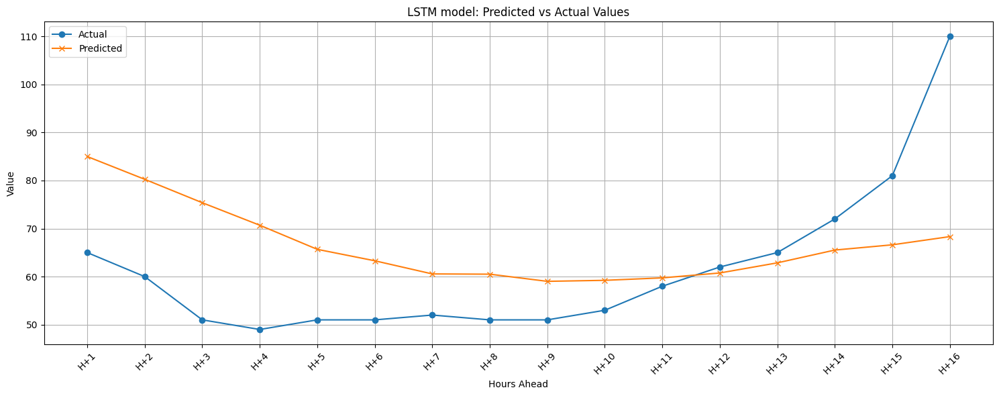


AQI Station 4 with lookback 4 and forecast_range 12 Metrics:

  Metrics for 1h:
    MAE: 19.990280151367188
    RMSE: 19.990280078263584
    MAPE: 30.754277155949516
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 20.119056701660156
    RMSE: 20.11946892403366
    MAPE: 32.250332954602364
    Correlation: 0.9999999999999999
    DA: 100.0

  Metrics for 4h:
    MAE: 21.577476501464844
    RMSE: 21.647767887063726
    MAPE: 39.14339140643299
    Correlation: 0.9768675679356085
    DA: 100.0

  Metrics for 8h:
    MAE: 16.418651580810547
    RMSE: 17.337650250565602
    MAPE: 30.570392700011784
    Correlation: 0.7876209619662465
    DA: 57.14285714285714

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# Lookback = 48, forecast_range=16
predictor_s4 = Lstm_AirQualityPredictor(lookback=48, forecast_range=12, epochs=50, batch_size=32)
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4) # Thay đổi ở đây

# # Save model
# predictor_s2.model.save('model_s2.h5')

# Print results
print("\nAQI Station 4 with lookback 4 and forecast_range 12 Metrics:") # Thay đổi ở đây
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - loss: 2137.4983 - val_loss: 5037.4619
Epoch 2/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1566.6737 - val_loss: 2429.7676
Epoch 3/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 663.4471 - val_loss: 896.0659
Epoch 4/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 199.0343 - val_loss: 528.8400
Epoch 5/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 149.5712 - val_loss: 479.5631
Epoch 6/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 137.1977 - val_loss: 412.1019
Epoch 7/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 131.9012 - val_loss: 402.9589
Epoch 8/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 133.9228 - val_loss: 478.6107
Epoch 9/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 125.5526 - val_loss: 431.6703
Epoch 10/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 119.8830 - val_loss: 472.3275
Epoch 11/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 109.4368 - val_loss: 39

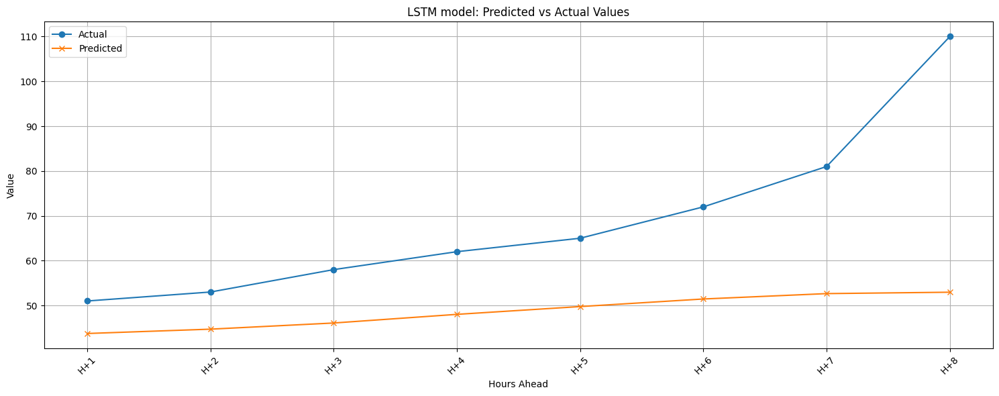


AQI Station 4 with lookback 4 and forecast_range 12 Metrics:

  Metrics for 1h:
    MAE: 7.2540130615234375
    RMSE: 7.25401300321959
    MAPE: 14.223555022594974
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 7.770444869995117
    RMSE: 7.787587231779694
    MAPE: 14.929585698530316
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 10.359274864196777
    RMSE: 10.709132381169908
    MAPE: 18.238102168647803
    Correlation: 0.992882651357062
    DA: 100.0

  Metrics for 8h:
    MAE: 20.329504013061523
    RMSE: 25.42533804969771
    MAPE: 26.47748761672033
    Correlation: 0.8522356240656619
    DA: 100.0

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# Lookback = 16, forecast_range=8
predictor_s4 = Lstm_AirQualityPredictor(lookback=32, forecast_range=8, epochs=50, batch_size=32)
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4) # Thay đổi ở đây

# # Save model
# predictor_s2.model.save('model_s2.h5')

# Print results
print("\nAQI Station 4 with lookback 4 and forecast_range 12 Metrics:") # Thay đổi ở đây
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step - loss: 2124.1577 - val_loss: 4336.2275
Epoch 2/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 1617.8490 - val_loss: 2234.4802
Epoch 3/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 686.3543 - val_loss: 784.5311
Epoch 4/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 216.8695 - val_loss: 470.1646
Epoch 5/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 4s 17ms/step - loss: 151.6318 - val_loss: 393.1491
Epoch 6/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 152.8923 - val_loss: 440.9307
Epoch 7/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 147.3419 - val_loss: 368.7630
Epoch 8/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 159.9397 - val_loss: 408.0658
Epoch 9/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 145.6940 - val_loss: 372.7694
Epoch 10/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 4s 16ms/step - loss: 157.9200 - val_loss: 390.3618
Epoch 11/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 154.0736 - val_loss: 39

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


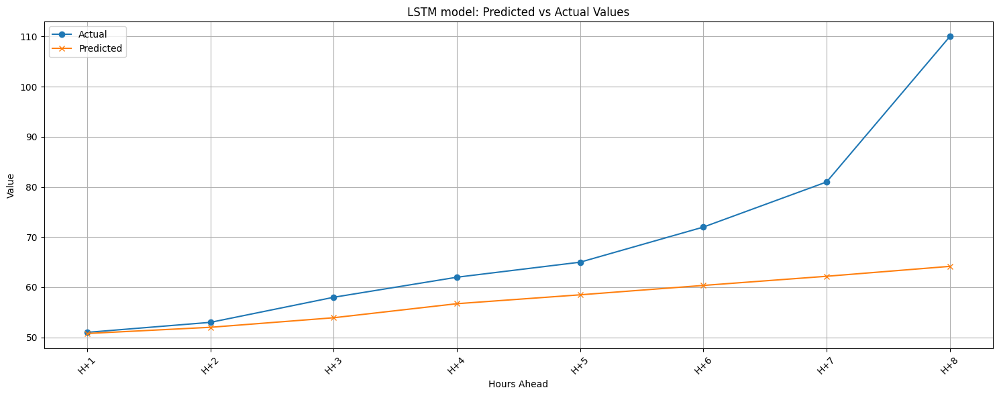


AQI Station 4 with lookback 4 and forecast_range 12 Metrics:

  Metrics for 1h:
    MAE: 0.22414779663085938
    RMSE: 0.2241477950402931
    MAPE: 0.43950548358992036
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 0.6058197021484375
    RMSE: 0.7160244139419629
    MAPE: 1.1513485980836542
    Correlation: 0.9999999999999999
    DA: 100.0

  Metrics for 4h:
    MAE: 2.6436729431152344
    RMSE: 3.3755797841844193
    MAPE: 4.464607419277147
    Correlation: 0.9916604271262416
    DA: 100.0

  Metrics for 8h:
    MAE: 11.670727729797363
    RMSE: 18.29589757743693
    MAPE: 13.615751354983702
    Correlation: 0.8999906939672431
    DA: 100.0

  Metrics for 12h:
    Error: Not enough data for this timeframe.

  Metrics for 16h:
    Error: Not enough data for this timeframe.

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 36h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# Lookback = 16, forecast_rage=4
predictor_s4 = Lstm_AirQualityPredictor(lookback=16, forecast_range=8, epochs=50, batch_size=32)
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4) # Thay đổi ở đây

# # Save model
# predictor_s2.model.save('model_s2.h5')

# Print results
print("\nAQI Station 4 with lookback 4 and forecast_range 12 Metrics:") # Thay đổi ở đây
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/100
166/166 ━━━━━━━━━━━━━━━━━━━━ 6s 17ms/step - loss: 2134.9978 - val_loss: 4591.3877
Epoch 2/100
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 1514.7920 - val_loss: 2454.7932
Epoch 3/100
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 580.7658 - val_loss: 831.8595
Epoch 4/100
166/166 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 144.8476 - val_loss: 342.4998
Epoch 5/100
166/166 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step - loss: 96.5810 - val_loss: 272.8254
Epoch 6/100
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 88.4143 - val_loss: 312.1489
Epoch 7/100
166/166 ━━━━━━━━━━━━━━━━━━━━ 5s 21ms/step - loss: 80.4848 - val_loss: 195.0930
Epoch 8/100
166/166 ━━━━━━━━━━━━━━━━━━━━ 4s 15ms/step - loss: 95.0579 - val_loss: 191.7014
Epoch 9/100
166/166 ━━━━━━━━━━━━━━━━━━━━ 5s 15ms/step - loss: 81.5511 - val_loss: 205.8980
Epoch 10/100
166/166 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 79.8635 - val_loss: 361.1527
Epoch 11/100
166/166 ━━━━━━━━━━━━━━━━━━━━ 5s 16ms/step - loss: 81.5113 - val_loss: 1

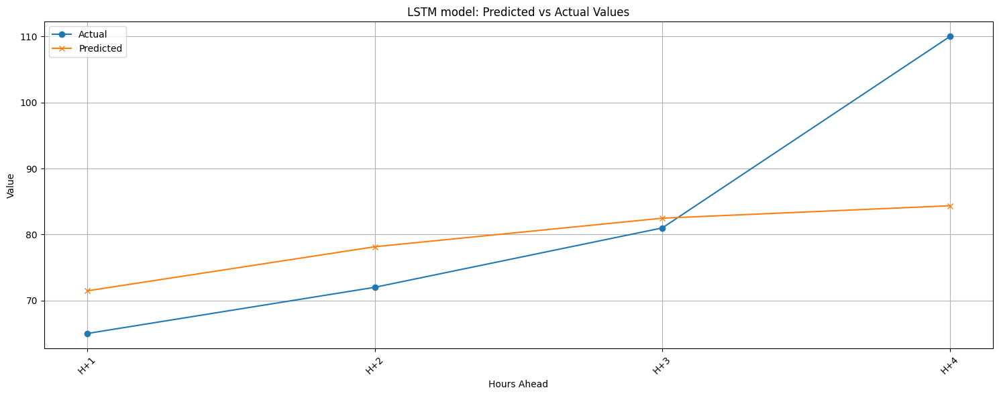


AQI Station 4 with lookback 4 and forecast_range 12 Metrics:

  Metrics for 1h:
    MAE: 6.464080810546875
    RMSE: 6.464080747081146
    MAPE: 9.944739708533653
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 6.305553436279297
    RMSE: 6.307545747897229
    MAPE: 9.241137952886076
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 9.93171501159668
    RMSE: 13.594462759690408
    MAPE: 10.903186414831096
    Correlation: 0.8338607313145618
    DA: 100.0

  Metrics for 8h:
    Error: Not enough data for this timeframe.

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# Lookback = 24, forecast_rage=4
predictor_s4 = Lstm_AirQualityPredictor(lookback=12, forecast_range=4, epochs=100, batch_size=32)
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4) # Thay đổi ở đây

# # Save model
# predictor_s2.model.save('model_s2.h5')

# Print results
print("\nAQI Station 4 with lookback 4 and forecast_range 12 Metrics:") # Thay đổi ở đây
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 1682.3298 - val_loss: 3535.8347
Epoch 2/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 1146.8134 - val_loss: 1654.2806
Epoch 3/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - loss: 383.4659 - val_loss: 721.8728
Epoch 4/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 109.0536 - val_loss: 518.0136
Epoch 5/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 96.6024 - val_loss: 470.5225
Epoch 6/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 93.5732 - val_loss: 470.3685
Epoch 7/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 92.9494 - val_loss: 441.4810
Epoch 8/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 10ms/step - loss: 94.8719 - val_loss: 541.1617
Epoch 9/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - loss: 89.2727 - val_loss: 436.9927
Epoch 10/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 3s 16ms/step - loss: 85.0038 - val_loss: 451.1917
Epoch 11/50
166/166 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step - loss: 90.5319 - val_loss: 539.0340


/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


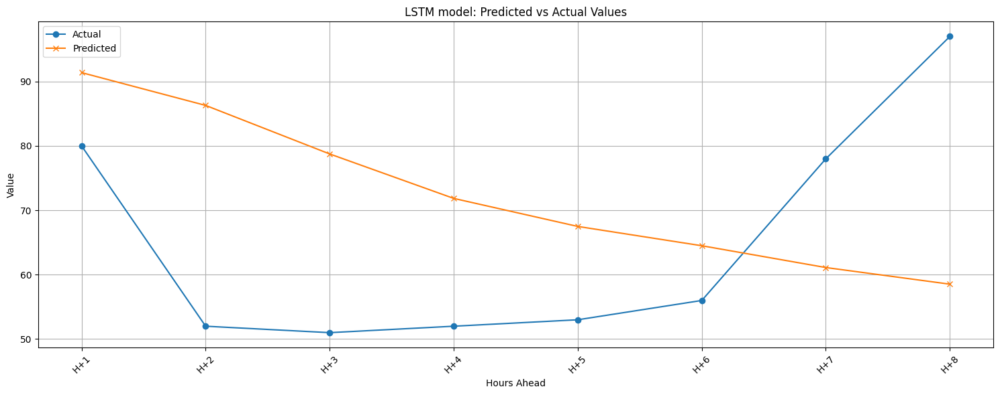


AQI Station 2 with lookback 12 and forecast_range 8 Metrics:

  Metrics for 1h:
    MAE: 11.383125305175781
    RMSE: 11.383125305175781
    MAPE: 14.228906631469727
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 22.83700180053711
    RMSE: 25.54838425436579
    MAPE: 40.086451677175674
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 23.319124221801758
    RMSE: 24.84790865296605
    MAPE: 43.19066500412034
    Correlation: 0.7252500385976971
    DA: 66.66666666666666

  Metrics for 8h:
    MAE: 21.453796863555908
    RMSE: 23.762531809980658
    MAPE: 34.57532988435915
    Correlation: -0.2969642004983345
    DA: 28.57142857142857

  Metrics for 12h:
    Error: Not enough data for this timeframe.

  Metrics for 16h:
    Error: Not enough data for this timeframe.

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 36h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timefr

In [ ]:
# Lookback = 48, forecast_range=16
predictor_s2 = Lstm_AirQualityPredictor(lookback=16, forecast_range=8, epochs=50, batch_size=32)
metrics_aqi_s2, y_pred_s2 = predictor_s2.evaluate(station2) # Thay đổi ở đây

# # Save model
# predictor_s2.model.save('model_s2.h5')

# Print results
print("\nAQI Station 2 with lookback 12 and forecast_range 8 Metrics:") # Thay đổi ở đây
for timeframe, metrics in metrics_aqi_s2.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

Epoch 1/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step - loss: 3224.2576 - val_loss: 4733.8442
Epoch 2/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - loss: 2546.3328 - val_loss: 2758.0129
Epoch 3/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - loss: 1276.6727 - val_loss: 961.3962
Epoch 4/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 4s 12ms/step - loss: 420.3191 - val_loss: 349.7057
Epoch 5/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 234.5425 - val_loss: 240.5166
Epoch 6/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 240.3931 - val_loss: 240.1619
Epoch 7/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - loss: 207.7737 - val_loss: 244.4098
Epoch 8/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - loss: 215.4394 - val_loss: 265.6026
Epoch 9/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 4s 11ms/step - loss: 194.4131 - val_loss: 204.8889
Epoch 10/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - loss: 194.9688 - val_loss: 263.6327
Epoch 11/50
165/165 ━━━━━━━━━━━━━━━━━━━━ 3s 11ms/step - loss: 192.3673 - val_loss: 2

/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2889: RuntimeWarning: Degrees of freedom <= 0 for slice
  c = cov(x, y, rowvar, dtype=dtype)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: divide by zero encountered in divide
  c *= np.true_divide(1, fact)
/usr/local/lib/python3.10/dist-packages/numpy/lib/function_base.py:2748: RuntimeWarning: invalid value encountered in multiply
  c *= np.true_divide(1, fact)


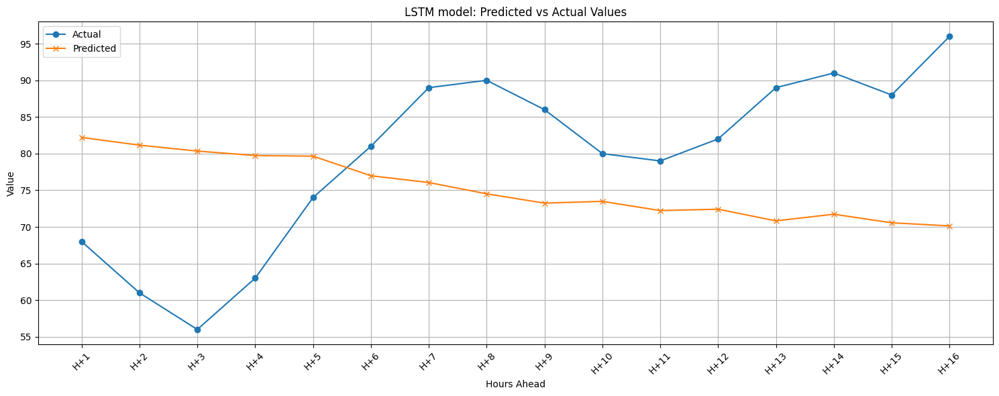


AQI Station 6 with lookback 4 and forecast_range 12 Metrics:

  Metrics for 1h:
    MAE: 14.206314086914062
    RMSE: 14.20631431635518
    MAPE: 20.891638363108918
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 17.18120574951172
    RMSE: 17.436852446533678
    MAPE: 26.967210502955584
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 18.860706329345703
    RMSE: 19.240833031906877
    MAPE: 30.9929393010054
    Correlation: 0.6118716108143102
    DA: 66.66666666666666

  Metrics for 8h:
    MAE: 14.192821502685547
    RMSE: 15.557527168908564
    MAPE: 21.039998293053543
    Correlation: -0.8717644278100243
    DA: 28.57142857142857

  Metrics for 12h:
    MAE: 12.431499481201172
    RMSE: 13.781939223305363
    MAPE: 17.630552503527966
    Correlation: -0.7742202692693972
    DA: 45.45454545454545

  Metrics for 16h:
    MAE: 14.370865821838379
    RMSE: 15.720828212828534
    MAPE: 18.74571094418571
    Correlation: -0.84889343703276
    DA: 46.666666666

In [ ]:
# Lookback = 48, forecast_range=16
predictor_s6 = Lstm_AirQualityPredictor(lookback=48, forecast_range=16, epochs=50, batch_size=32)
metrics_aqi_s6, y_pred_s6 = predictor_s6.evaluate(station6) # Thay đổi ở đây

# # Save model
# predictor_s2.model.save('model_s2.h5')

# Print results
print("\nAQI Station 6 with lookback 4 and forecast_range 12 Metrics:") # Thay đổi ở đây
for timeframe, metrics in metrics_aqi_s6.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

# (Additional 2) Arima model

0. Import Library

In [ ]:
from statsmodels.tsa.arima.model import ARIMA
import warnings
warnings.filterwarnings("ignore")

1. Prepare model

In [ ]:
class Arima_AirQualityPredictor:
    def __init__(self, order=(5, 1, 0), forecast_range=48):
        self.order = order
        self.forecast_range = forecast_range

    def prepare_data(self, df, isIncludeCO=True):
        df['date'] = pd.to_datetime(df['date'])

        if isIncludeCO is True:
            features = ['AQI_PM2.5', 'AQI_O3', 'AQI_CO', 'AQI_NO2', 'rush_hour']
        else:
            features = ['AQI_PM2.5', 'AQI_O3', 'AQI_NO2', 'rush_hour']

        X = df[features].values
        X_scaled = X  # Apply scaling if needed

        y_numeric = df['AQI_Station'].values
        y_scaled = y_numeric

        X_seq, y_seq = [], []
        for i in range(len(X_scaled) - self.forecast_range):  # Modified range
            X_seq.append(X_scaled)
            y_seq.append(y_scaled[i  + self.forecast_range])  # Modified slice

        return np.array(X_seq), np.array(y_seq)

    def build_model(self, y_train):
        model = ARIMA(y_train, order=self.order)
        return model

    def train(self, y_train):
        model = self.build_model(y_train)
        model_fit = model.fit()
        self.model_fit = model_fit
        return model_fit

    def predict(self):
        predictions = self.model_fit.predict(start=len(self.y_train), end=len(self.y_train) + self.forecast_range - 1)
        return predictions

    def evaluate(self, df, isIncludeCO=True):
        evaluator = ModelEvaluator()
        X, y = self.prepare_data(df, isIncludeCO)

        # Use y for training and testing since ARIMA doesn't require X
        train_size = len(y) - self.forecast_range # Modified to use forecast_range
        y_train, y_test = y[:train_size], y[train_size:]
        self.y_train = y_train # Store y_train for prediction

        self.train(y_train.flatten()) # Flatten y_train if necessary

        y_pred = self.predict()

        y_true = y_test # Modified to use entire y_test instead of y_test[0]

        metrics_aqi = evaluator.evaluate_numeric_predictions_timeframes(y_true, y_pred, y_train)

        evaluator.plot_predictions(y_true, y_pred, "AQI Station: Predicted vs Actual Values",
                                   hours_ahead=self.forecast_range)  # Modified parameter

        return metrics_aqi, y_pred  # Simplified return

2. Station 3

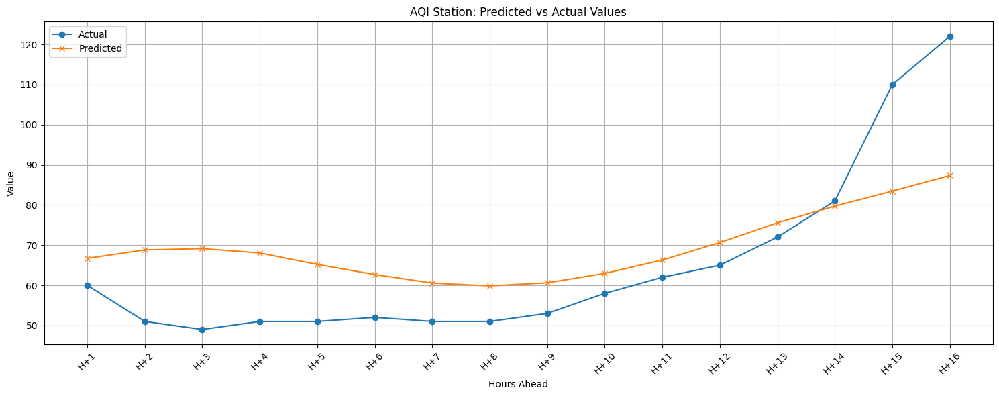


AQI Station 3 with lookback 16 and forecast_range 3 Metrics:

  Metrics for 1h:
    MAE: 6.718736065385841
    RMSE: 6.718736065385841
    MAPE: 11.197893442309734
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 12.269448478640768
    RMSE: 13.466617031187997
    MAPE: 23.069692693601628
    Correlation: -1.0
    DA: 0.0

  Metrics for 4h:
    MAE: 15.43525493135413
    RMSE: 16.274174298353742
    MAPE: 30.17401132865336
    Correlation: -0.9505508722744492
    DA: 0.0

  Metrics for 8h:
    MAE: 13.131199552935538
    RMSE: 13.897847183972713
    MAPE: 25.651486237460347
    Correlation: 0.04447940690190348
    DA: 14.285714285714285

  Metrics for 12h:
    MAE: 10.632476480293288
    RMSE: 11.826594821328268
    MAPE: 20.315656161929397
    Correlation: 0.3213773040338617
    DA: 45.45454545454545

  Metrics for 16h:
    MAE: 12.099366793593862
    RMSE: 14.992753343705484
    MAPE: 18.92564140882196
    Correlation: 0.9048755170811221
    DA: 60.0

  Metrics for 24h:


In [ ]:
# order=(24, 1, 3), forecast_rage=24
predictor_s3 = Arima_AirQualityPredictor(order=(48, 1, 0), forecast_range=16) # Khởi tạo model ARIMA
metrics_aqi_s3, y_pred_s3 = predictor_s3.evaluate(station4)  # Đánh giá model

# Print results
print("\nAQI Station 3 with lookback 16 and forecast_range 3 Metrics:") # Modified for ARIMA
for timeframe, metrics in metrics_aqi_s3.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

3. Evaluate for station 4

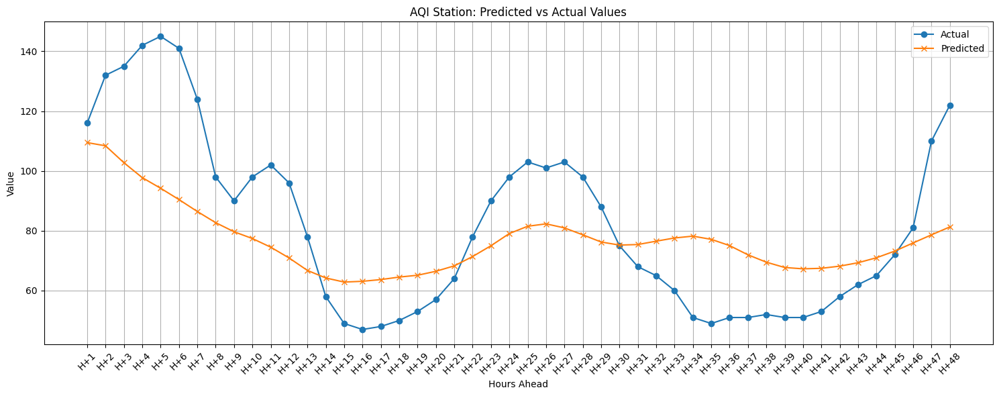


AQI Station 4 with lookback 16 and forecast_range 4 Metrics:

  Metrics for 1h:
    MAE: 6.524071272653984
    RMSE: 6.524071272653984
    MAPE: 5.624199372977572
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 15.057212529189094
    RMSE: 17.307054886755015
    MAPE: 11.747839756838864
    Correlation: -1.0
    DA: 0.0

  Metrics for 4h:
    MAE: 26.646968831853826
    RMSE: 29.979201304079385
    MAPE: 19.63189768268129
    Correlation: -0.8482086477680738
    DA: 0.0

  Metrics for 8h:
    MAE: 32.596173611808474
    RMSE: 36.01059413110211
    MAPE: 24.4113454323648
    Correlation: 0.2631347625733209
    DA: 42.857142857142854

  Metrics for 24h:
    MAE: 20.34557977549095
    RMSE: 24.362634297398724
    MAPE: 21.702770738513646
    Correlation: 0.8894871942568171
    DA: 69.56521739130434

  Metrics for 48h:
    MAE: 18.446772838201493
    RMSE: 21.899900960324292
    MAPE: 23.040099431845196
    Correlation: 0.8263648985856883
    DA: 63.829787234042556


In [ ]:
# order=(24, 1, 3), forecast_rage=24
predictor_s4 = Arima_AirQualityPredictor(order=(48, 1, 0), forecast_range=48) # Khởi tạo model ARIMA
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4)  # Đánh giá model

# Print results
print("\nAQI Station 4 with lookback 16 and forecast_range 4 Metrics:") # Modified for ARIMA
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

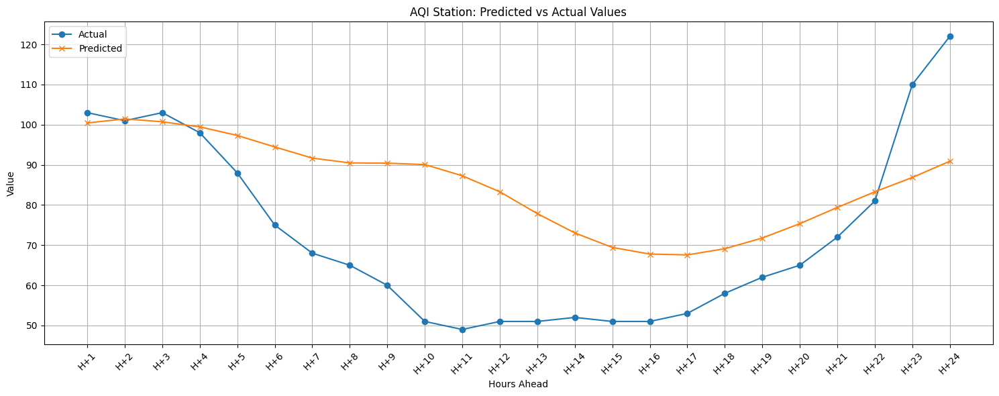


AQI Station 4 with lookback 16 and forecast_range 4 Metrics:

  Metrics for 1h:
    MAE: 2.5703090612390582
    RMSE: 2.5703090612390582
    MAPE: 2.4954456905233577
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 1.5087690077489313
    RMSE: 1.844790287243381
    MAPE: 1.4691233176670275
    Correlation: -1.0
    DA: 0.0

  Metrics for 4h:
    MAE: 1.6876387572924827
    RMSE: 1.8782913659355998
    MAPE: 1.6586592203697916
    Correlation: 0.5854940742748272
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 10.58638414627096
    RMSE: 14.533082004691217
    MAPE: 14.649615590795282
    Correlation: 0.9905676702471448
    DA: 71.42857142857143

  Metrics for 24h:
    MAE: 17.399830822615602
    RMSE: 20.951977879804158
    MAPE: 28.58635646057212
    Correlation: 0.6714648874465051
    DA: 69.56521739130434

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# order=(24, 2, 3), forecast_rage=24
predictor_s4 = Arima_AirQualityPredictor(order=(48, 1, 0), forecast_range=24) # Khởi tạo model ARIMA
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4)  # Đánh giá model

# Print results
print("\nAQI Station 4 with lookback 16 and forecast_range 4 Metrics:") # Modified for ARIMA
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

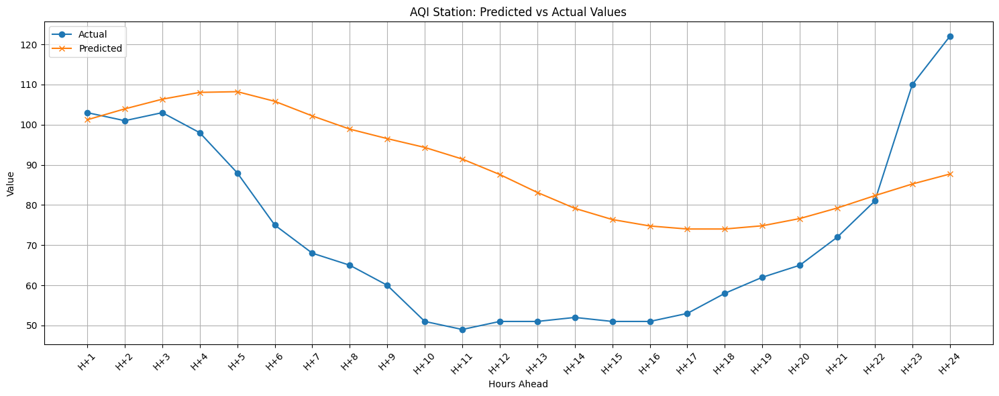


AQI Station 4 with lookback 16 and forecast_range 4 Metrics:

  Metrics for 1h:
    MAE: 1.7733315848196867
    RMSE: 1.7733315848196867
    MAPE: 1.7216811503103755
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 2.3562019886416294
    RMSE: 2.4272259307551747
    MAPE: 2.315826908057946
    Correlation: -0.9999999999999999
    DA: 0.0

  Metrics for 4h:
    MAE: 4.5278766066701515
    RMSE: 5.56720543615676
    MAPE: 4.534553198775246
    Correlation: -0.6596399694582364
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 17.154999287618665
    RMSE: 21.796462920188855
    MAPE: 23.079811036297865
    Correlation: 0.43329472773798083
    DA: 57.14285714285714

  Metrics for 24h:
    MAE: 22.239029103450992
    RMSE: 25.80005557914278
    MAPE: 36.19583356550582
    Correlation: 0.4962846078582457
    DA: 65.21739130434783

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# order=(24, 2, 3), forecast_rage=24
predictor_s4 = Arima_AirQualityPredictor(order=(24, 1, 0), forecast_range=24) # Khởi tạo model ARIMA
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4)  # Đánh giá model

# Print results
print("\nAQI Station 4 with lookback 16 and forecast_range 4 Metrics:") # Modified for ARIMA
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

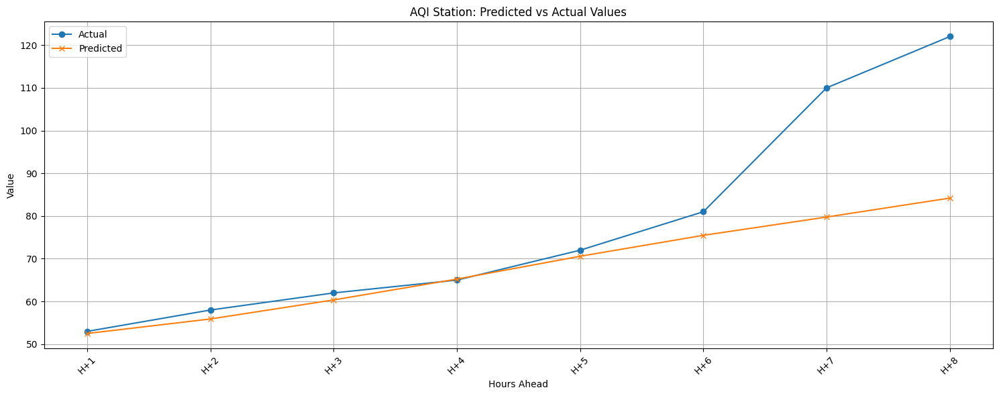


AQI Station 4 with lookback 16 and forecast_range 4 Metrics:

  Metrics for 1h:
    MAE: 0.4977118511712817
    RMSE: 0.4977118511712817
    MAPE: 0.9390789644741163
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 1.2971218767905484
    RMSE: 1.5236737027031841
    MAPE: 2.2768945705213817
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 1.1171981684161345
    RMSE: 1.3585739480615495
    MAPE: 1.8899163574675482
    Correlation: 0.9821920649462222
    DA: 100.0

  Metrics for 8h:
    MAE: 9.932847269223542
    RMSE: 17.262513572124305
    MAPE: 9.354307566259338
    Correlation: 0.9324965111319103
    DA: 100.0

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# order=(24, 2, 3), forecast_rage=8
predictor_s4 = Arima_AirQualityPredictor(order=(48, 1, 0), forecast_range=8) # Khởi tạo model ARIMA
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4)  # Đánh giá model

# Print results
print("\nAQI Station 4 with lookback 16 and forecast_range 4 Metrics:") # Modified for ARIMA
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

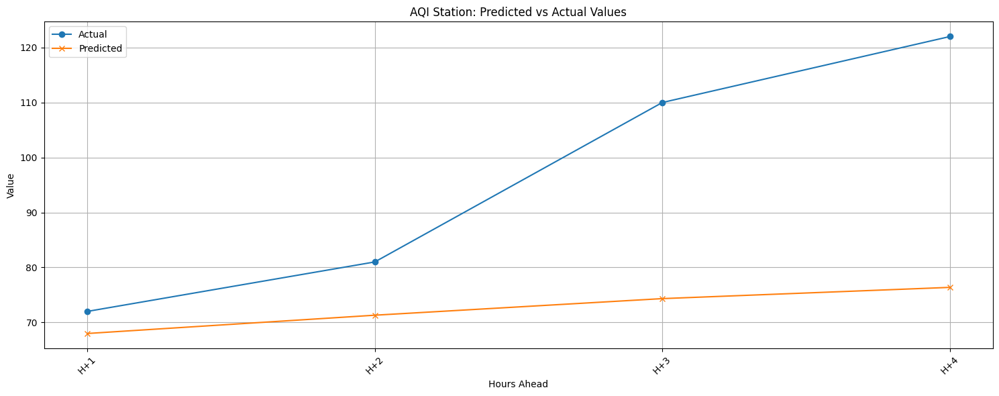


AQI Station 4 with lookback 16 and forecast_range 4 Metrics:

  Metrics for 1h:
    MAE: 4.0158941713654315
    RMSE: 4.0158941713654315
    MAPE: 5.5776307935631
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 6.852355532180461
    RMSE: 7.416217997793809
    MAPE: 8.769566565297286
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 23.750750052059082
    RMSE: 29.428982986861175
    MAPE: 21.841694494362223
    Correlation: 0.9743673194064453
    DA: 100.0

  Metrics for 8h:
    Error: Not enough data for this timeframe.

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# order=(24, 2, 3), forecast_rage=4
predictor_s4 = Arima_AirQualityPredictor(order=(24, 1, 0), forecast_range=4) # Khởi tạo model ARIMA
metrics_aqi_s4, y_pred_s4 = predictor_s4.evaluate(station4)  # Đánh giá model

# Print results
print("\nAQI Station 4 with lookback 16 and forecast_range 4 Metrics:") # Modified for ARIMA
for timeframe, metrics in metrics_aqi_s4.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

4. Station 6

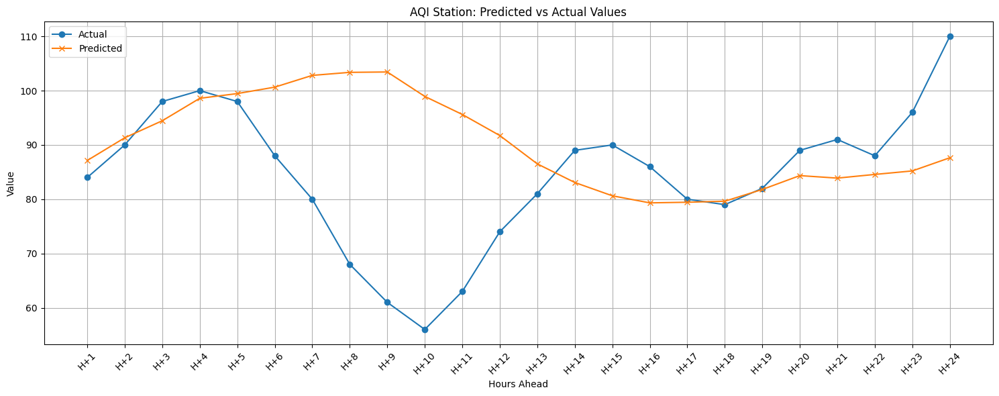


AQI Station 4 with lookback 16 and forecast_range 4 Metrics:

  Metrics for 1h:
    MAE: 3.1326444158136013
    RMSE: 3.1326444158136013
    MAPE: 3.729338590254287
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 2.225817932737442
    RMSE: 2.403455791169011
    MAPE: 2.5974423227167454
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 2.3526951878735893
    RMSE: 2.555721874680156
    MAPE: 2.5566022845372625
    Correlation: 0.9691929124993158
    DA: 100.0

  Metrics for 8h:
    MAE: 10.21164440498648
    RMSE: 15.650119771751354
    MAPE: 13.326197189810346
    Correlation: -0.2922582890994413
    DA: 42.857142857142854

  Metrics for 12h:
    MAE: 18.117541133761744
    RMSE: 24.121209346055043
    MAPE: 27.381593543736628
    Correlation: -0.252779870986181
    DA: 36.36363636363637

  Metrics for 24h:
    MAE: 12.276873795428614
    RMSE: 18.121433901937984
    MAPE: 17.10342313354373
    Correlation: -0.3125177422818593
    DA: 39.130434782608695

  M

In [ ]:
# order=(24, 2, 3), forecast_rage=24
predictor_s6 = Arima_AirQualityPredictor(order=(48, 1, 0), forecast_range=24) # Khởi tạo model ARIMA
metrics_aqi_s6, y_pred_s6 = predictor_s6.evaluate(station6)  # Đánh giá model

# Print results
print("\nAQI Station 4 with lookback 16 and forecast_range 6 Metrics:") # Modified for ARIMA
for timeframe, metrics in metrics_aqi_s6.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

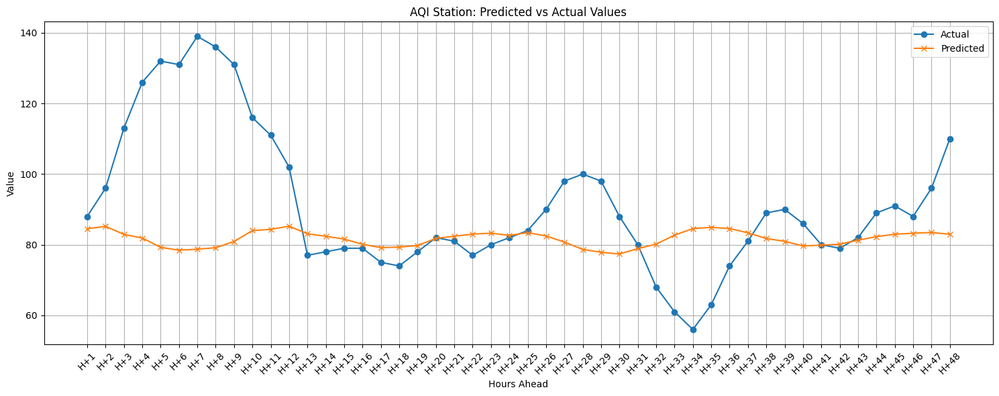


AQI Station 4 with lookback 16 and forecast_range 4 Metrics:

  Metrics for 1h:
    MAE: 3.469557854485174
    RMSE: 3.469557854485174
    MAPE: 3.942679380096789
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 7.136506593171781
    RMSE: 8.02348050452792
    MAPE: 7.598139342057972
    Correlation: 1.0
    DA: 100.0

  Metrics for 4h:
    MAE: 22.11076470244445
    RMSE: 27.284804290337725
    MAPE: 19.201676024749943
    Correlation: -0.9300341859127544
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 38.85755526055544
    RMSE: 43.85492297588932
    MAPE: 30.255314069181242
    Correlation: -0.9395782119139455
    DA: 42.857142857142854

  Metrics for 12h:
    MAE: 36.36173082164938
    RMSE: 40.731702789936456
    MAPE: 29.024073587376243
    Correlation: -0.9058031952527597
    DA: 27.27272727272727

  Metrics for 24h:
    MAE: 19.722297821099954
    RMSE: 28.91887605466472
    MAPE: 16.509040930088972
    Correlation: -0.2584587610837625
    DA: 34.782608695652

In [ ]:
# order=(24, 2, 3), forecast_rage=24
predictor_s6 = Arima_AirQualityPredictor(order=(48, 1, 0), forecast_range=48) # Khởi tạo model ARIMA
metrics_aqi_s6, y_pred_s6 = predictor_s6.evaluate(station6)  # Đánh giá model

# Print results
print("\nAQI Station 4 with lookback 16 and forecast_range 6 Metrics:") # Modified for ARIMA
for timeframe, metrics in metrics_aqi_s6.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")

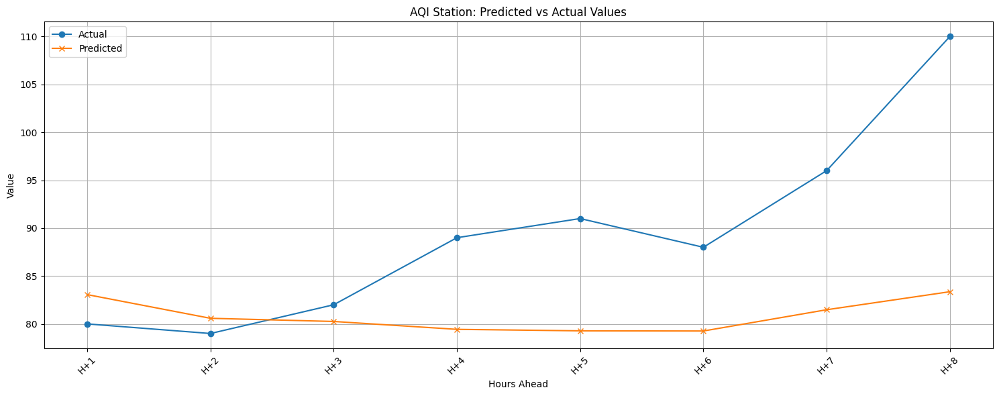


AQI Station 4 with lookback 16 and forecast_range 6 Metrics:

  Metrics for 1h:
    MAE: 3.0592547972493236
    RMSE: 3.0592547972493236
    MAPE: 3.824068496561654
    Correlation: nan
    DA: nan

  Metrics for 2h:
    MAE: 2.32262657290552
    RMSE: 2.4366401741058823
    MAPE: 2.915830671421154
    Correlation: 0.9999999999999999
    DA: 100.0

  Metrics for 4h:
    MAE: 3.989175037439928
    RMSE: 5.158611767665451
    MAPE: 4.677118352532369
    Correlation: -0.6398679692138823
    DA: 33.33333333333333

  Metrics for 8h:
    MAE: 9.697412715163146
    RMSE: 12.453665157814104
    MAPE: 10.108196671603828
    Correlation: 0.3625178115935435
    DA: 57.14285714285714

  Metrics for 12h:
    Error: Not enough data for this timeframe.

  Metrics for 24h:
    Error: Not enough data for this timeframe.

  Metrics for 36h:
    Error: Not enough data for this timeframe.

  Metrics for 48h:
    Error: Not enough data for this timeframe.


In [ ]:
# order=(24, 2, 3), forecast_rage=24
predictor_s6 = Arima_AirQualityPredictor(order=(24, 1, 0), forecast_range=8) # Khởi tạo model ARIMA
metrics_aqi_s6, y_pred_s6 = predictor_s6.evaluate(station6)  # Đánh giá model

# Print results
print("\nAQI Station 4 with lookback 16 and forecast_range 6 Metrics:") # Modified for ARIMA
for timeframe, metrics in metrics_aqi_s6.items():
    if isinstance(metrics, dict):
        print(f"\n  Metrics for {timeframe}:")
        for metric, value in metrics.items():
            print(f"    {metric}: {value:}")
    else:
        print(f"  {timeframe}: {metrics}")